# Group 14 - Project FP01
## Time series anomaly detection - Isolation Forest Classifier

This project aims at investigating the current state-of-the-arts TAD scenario.

In [1]:
# %pip install --no-binary :all: -r requirements.txt

In [2]:
# %pip install numpy==1.26.4
# %pip install pandas==1.5.3
# %pip install tensorflow
# %pip install tsfel
# %pip install keras_tuner
# %pip install -U kaleido
# %pip install seaborn
# %pip install plotly
# %pip install openpyxl

In [3]:
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import IsolationForest

from src.dataset import get_df_action, get_features_ts, get_train_test_data, label_collision_data
from src.plots import seaborn_cm, create_and_plot_cm, plot_uncertainty, plot_signals, plot_anomalies, plot_anomalies_over_time, plot_anomalies_over_time_isolation_forest, plot_roc_curve
from src.metrics import Confidence, anomaly_detection_metric, compute_metrics

# from google.colab import drive
# drive.mount('/content/drive', force_remount=True)

# Set style for matplotlib
plt.style.use("Solarize_Light2")

In [4]:
# from google.colab import drive
# drive.mount('/content/drive')

In [5]:
# Path to the root directory of the dataset
ROOTDIR_DATASET_NORMAL =  './dataset/normal' #'/content/drive/MyDrive/dataset/normal'
ROOTDIR_DATASET_ANOMALY = './dataset/collisions'#'/content/drive/MyDrive/dataset/collisions'

# TF_ENABLE_ONEDNN_OPTS=0 means that the model will not use the oneDNN library for optimization

import os
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'

### Dataset: Kuka-v1
In 5 different recording sessions, the robot executes several different operations, while being
monitored by several sensors. The sensed signals are collected, with different sampling frequencies
(1, 10, 100, 200 Hz),

### Data Loading

In [6]:
#freq = '1.0'
freq = '0.1'
#freq = '0.01'
# freq = '0.005'

# NORMAL DATA
filepath_csv = [os.path.join(ROOTDIR_DATASET_NORMAL, f"rec{r}_20220811_rbtc_{freq}s.csv") for r in [0, 2, 3, 4]]
filepath_meta = [os.path.join(ROOTDIR_DATASET_NORMAL, f"rec{r}_20220811_rbtc_{freq}s.metadata") for r in [0, 2, 3, 4]]
df_action, df, df_meta, action2int = get_df_action(filepath_csv, filepath_meta)


# COLLISION DATA
xls = pd.ExcelFile(os.path.join(ROOTDIR_DATASET_ANOMALY, "20220811_collisions_timestamp.xlsx"))
collision_rec1 = pd.read_excel(xls, 'rec1')
collision_rec5 = pd.read_excel(xls, 'rec5')


collisions = pd.concat([collision_rec1, collision_rec5]).dropna()
collisions_init = collisions[collisions['Inizio/fine'] == "i"].Timestamp - pd.to_timedelta([2] * len(collisions[collisions['Inizio/fine'] == "i"].Timestamp), 'h')
collisions_adjusted = collisions.Timestamp - pd.to_timedelta([2] * len(collisions.Timestamp), 'h')
collisions['Timestamp'] = collisions_adjusted


collisions_1 = collision_rec1.dropna()
collisions_init_1 = collisions_1[collisions_1['Inizio/fine'] == "i"].Timestamp - pd.to_timedelta([2] * len(collisions_1[collisions_1['Inizio/fine'] == "i"].Timestamp), 'h')
collisions_adjusted_1 = collisions_1.Timestamp - pd.to_timedelta([2] * len(collisions_1.Timestamp), 'h')
collisions_1['Timestamp'] = collisions_adjusted_1


collisions_5 = collision_rec5.dropna()
collisions_init_5 = collisions_5[collisions_5['Inizio/fine'] == "i"].Timestamp - pd.to_timedelta([2] * len(collisions_5[collisions_5['Inizio/fine'] == "i"].Timestamp), 'h')
collisions_adjusted_5 = collisions_5.Timestamp - pd.to_timedelta([2] * len(collisions_5.Timestamp), 'h')
collisions_5['Timestamp'] = collisions_adjusted_5



filepath_csv = [os.path.join(ROOTDIR_DATASET_ANOMALY, f"rec{r}_collision_20220811_rbtc_{freq}s.csv") for r in [1, 5]]
filepath_meta = [os.path.join(ROOTDIR_DATASET_ANOMALY, f"rec{r}_collision_20220811_rbtc_{freq}s.metadata") for r in [1, 5]]
#df_collision è il dataset a meno di alcune colonne
df_action_collision, df_collision, df_meta_collision, action2int_collision = get_df_action(filepath_csv, filepath_meta)


filepath_csv_1 = [os.path.join(ROOTDIR_DATASET_ANOMALY, f"rec{r}_collision_20220811_rbtc_{freq}s.csv") for r in [1]]
filepath_meta_1 = [os.path.join(ROOTDIR_DATASET_ANOMALY, f"rec{r}_collision_20220811_rbtc_{freq}s.metadata") for r in [1]]
#df_collision è il dataset a meno di alcune colonne
df_action_collision_1, df_collision_1, df_meta_collision_1, action2int_collision_1 = get_df_action(filepath_csv_1, filepath_meta_1)


filepath_csv_5 = [os.path.join(ROOTDIR_DATASET_ANOMALY, f"rec{r}_collision_20220811_rbtc_{freq}s.csv") for r in [5]]
filepath_meta_5 = [os.path.join(ROOTDIR_DATASET_ANOMALY, f"rec{r}_collision_20220811_rbtc_{freq}s.metadata") for r in [5]]
#df_collision è il dataset a meno di alcune colonne
df_action_collision_5, df_collision_5, df_meta_collision_5, action2int_collision_5 = get_df_action(filepath_csv_5, filepath_meta_5)

Loading data.
Found 31 different actions.
Loading data done.

Loading data.
Found 31 different actions.
Loading data done.

Loading data.
Found 31 different actions.
Loading data done.

Loading data.
Found 31 different actions.
Loading data done.



### Features Exctraction

In [7]:
start_time = time.time()
frequency = 1/float(freq)

df_features = get_features_ts("statistical", df_action, df_meta, frequency, action2int)

df_features_collision = get_features_ts("statistical", df_action_collision, df_meta_collision, frequency, action2int_collision)
df_features_collision_1 = get_features_ts("statistical", df_action_collision_1, df_meta_collision_1, frequency, action2int_collision_1)
df_features_collision_5 = get_features_ts("statistical", df_action_collision_5, df_meta_collision_5, frequency, action2int_collision_5)

print("--- %s seconds ---" % (time.time() - start_time))

Computing features.


Skipped feature extraction for pickFromPallet(1,2)=[true,1,0] 2022-08-11 14:37:37.436000 : 2022-08-11 14:37:37.421000.
Skipped feature extraction for placeToPallet(1,1)=[true,0] 2022-08-11 14:37:37.421000 : 2022-08-11 14:37:37.442000.
Skipped feature extraction for pickFromPallet(3,2)=[true,1,0] 2022-08-11 15:36:32.568000 : 2022-08-11 15:36:32.533000.
Skipped feature extraction for pickFromPallet(3,2)=[true,1,0] 2022-08-11 15:36:32.572000 : 2022-08-11 15:36:32.561000.
Skipped feature extraction for placeToPallet(1,3)=[true,0] 2022-08-11 15:36:32.533000 : 2022-08-11 15:36:32.572000.
Skipped feature extraction for placeToPallet(1,3)=[true,0] 2022-08-11 15:36:32.561000 : 2022-08-11 15:36:32.561000.
Computing features done.
Computing features.


Skipped feature extraction for moveOverPallet(1,3)=[true,0] 2022-08-11 16:55:15.149000 : 2022-08-11 16:55:15.146000.
Skipped feature extraction for moveOverPallet(3,1)=[true,0] 2022-08-11 16:55:15.146000 : 2022-08-11 16:55:15.150000.
Computing features done.
Computing features.


Computing features done.
Computing features.


Skipped feature extraction for moveOverPallet(1,3)=[true,0] 2022-08-11 16:55:15.149000 : 2022-08-11 16:55:15.146000.
Skipped feature extraction for moveOverPallet(3,1)=[true,0] 2022-08-11 16:55:15.146000 : 2022-08-11 16:55:15.150000.
Computing features done.
--- 232.28299927711487 seconds ---


In [8]:
X_train, y_train, X_test, y_test, X_test_start_end = get_train_test_data(df_features, df_features_collision)
X_train_1, y_train_1, X_test_1, y_test_1, X_test_start_end_1 = get_train_test_data(df_features, df_features_collision_1)
X_train_5, y_train_5, X_test_5, y_test_5, X_test_start_end_5 = get_train_test_data(df_features, df_features_collision_5)

X_train shape: (973, 2200)
y_train shape: (973,)
X_test shape: (306, 2200)
y_test shape: (306,)
X_train shape: (973, 96)
y_train categorical shape: (973, 31)
y_train shape: (973,)
X_test shape: (306, 96)
y_test shape: (306,)
X_train shape: (973, 2200)
y_train shape: (973,)
X_test shape: (164, 2200)
y_test shape: (164,)
X_train shape: (973, 96)
y_train categorical shape: (973, 31)
y_train shape: (973,)
X_test shape: (164, 96)
y_test shape: (164,)
X_train shape: (973, 2200)
y_train shape: (973,)
X_test shape: (141, 2200)
y_test shape: (141,)
X_train shape: (973, 96)
y_train categorical shape: (973, 31)
y_train shape: (973,)
X_test shape: (141, 96)
y_test shape: (141,)


In [9]:
collisions_init

0     2022-08-11 14:02:17.450
2     2022-08-11 14:02:28.320
4     2022-08-11 14:02:45.770
6     2022-08-11 14:02:57.490
8     2022-08-11 14:03:56.960
                ...          
102   2022-08-11 17:01:56.990
104   2022-08-11 17:02:11.180
106   2022-08-11 17:02:58.080
108   2022-08-11 17:03:44.090
110   2022-08-11 17:04:10.600
Length: 107, dtype: datetime64[ns]

In [10]:
df_with_labels = label_collision_data(df_features_collision, collisions_init)
y_test_collision = df_with_labels["is_collision"]

In [11]:
df_with_labels_1 = label_collision_data(df_features_collision_1, collisions_init_1)
y_test_collision_1 = df_with_labels_1["is_collision"]

In [12]:
df_with_labels_5 = label_collision_data(df_features_collision_5, collisions_init_5)
y_test_collision_5 = df_with_labels_5["is_collision"]

In [13]:
len(y_test_collision), len(y_test_collision_1), len(y_test_collision_5)

(306, 164, 141)

### Collision_zones



In [14]:
# ts_starts = collisions[collisions['Inizio/fine'] == 'i'].Timestamp.reset_index()
# ts_ends = collisions[collisions['Inizio/fine'] == 'f'].Timestamp.reset_index()

# d = {'start': ts_starts.Timestamp, 'end': ts_ends.Timestamp}
# collision_zones = pd.DataFrame(d)


## Isolation Forest

In [15]:
#Let's cheat a little bit, computing contamination dircetly on the test set --> By the way in the training set we do not have collisions -.-
cont = np.sum(y_test_collision)/float(len(y_test_collision))
print(f"dataset contamination = {cont}")

num_estims = [1, 2, 3, 5, 10, 100]
contamination_s = [cont, 0.005, 0.001, 0.001, 0.03, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5]
contamination_s += np.linspace(0.03, 0.1, 5).tolist()
clf_s = []
clf_s_1 = []
clf_s_5 = []

#Variare contamination è come variare threshold
for n in num_estims:
    for cont in contamination_s:
        classifier = IsolationForest(
            n_estimators = n,
            contamination = cont
        )
        # Train the RandomForestClassifier on normal data
        classifier.fit(X_train, y_train)
        clf_s.append((classifier, n, cont))

        classifier.fit(X_train_1, y_train_1)
        clf_s_1.append((classifier, n, cont))

        classifier.fit(X_train_5, y_train_5)
        clf_s_5.append((classifier, n, cont))

        print("Random Forest training completed.")


dataset contamination = 0.3431372549019608
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Rando

## Predicting Labels

In [16]:
print(f"Real number of collisions {np.sum(y_test_collision == 1)}")
print(f"Real number of collisions {np.sum(y_test_collision_1 == 1)}")
print(f"Real number of collisions {np.sum(y_test_collision_5 == 1)}")

Real number of collisions 105
Real number of collisions 35
Real number of collisions 56


In [17]:
#Facendo così otteniamo le stesse prediction del metodo con gli score, ma con gli score possiamo plottare grafici, quindi terrei quello

# pred_s = []
# # For each of the trained clasisfier make a prediction
# for clf in clf_s:
#     try:
#         anomalies_detected = clf.predict(X_test)
#         pred_s.append(anomalies_detected)
#     except Exception as e:
#         print(f"An error occurred during prediction: {str(e)}")
#         # If an error occurs, you might want to inspect the model's internal state

#     #Anomalies are set as -1
#     print(f"Number of anomalies detected: {-np.sum(anomalies_detected[anomalies_detected == -1])} with contamination {clf.get_params()['contamination']}")


## Decision function

In [18]:
anomaly_scores_s = []
for clf in clf_s:
    try:
        anomaly_scores = clf[0].decision_function(X_test)
        # Replace inf values with the maximum float value
        anomaly_scores_s.append(np.nan_to_num(anomaly_scores, nan=np.nanmean(anomaly_scores), posinf=np.finfo(float).max, neginf=np.finfo(float).min))
    except Exception as e:
        print(f"An error occurred during prediction: {str(e)}")
        # If an error occurs, you might want to inspect the model's internal state
    print("Anomaly prediction completed.")

Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly pr

In [19]:
anomaly_scores_s_1 = []
for clf in clf_s_1:
    try:
        anomaly_scores = clf[0].decision_function(X_test_1)
        # Replace inf values with the maximum float value
        anomaly_scores_s_1.append(np.nan_to_num(anomaly_scores, nan=np.nanmean(anomaly_scores), posinf=np.finfo(float).max, neginf=np.finfo(float).min))
    except Exception as e:
        print(f"An error occurred during prediction: {str(e)}")
        # If an error occurs, you might want to inspect the model's internal state
    print("Anomaly prediction completed.")

Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly pr

In [20]:
anomaly_scores_s_5 = []
for clf in clf_s_5:
    try:
        anomaly_scores = clf[0].decision_function(X_test_5)
        # Replace inf values with the maximum float value
        anomaly_scores_s_5.append(np.nan_to_num(anomaly_scores, nan=np.nanmean(anomaly_scores), posinf=np.finfo(float).max, neginf=np.finfo(float).min))
    except Exception as e:
        print(f"An error occurred during prediction: {str(e)}")
        # If an error occurs, you might want to inspect the model's internal state
    print("Anomaly prediction completed.")

Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly prediction completed.
Anomaly pr

In [21]:
def plot_anomalies(anomaly_scores, freq, threshold, model_name="No_Model"):
    
    # Visualize the results
    plt.figure(figsize=(12, 6))

    scatter = plt.scatter(range(len(anomaly_scores)), anomaly_scores,
                        c=anomaly_scores, cmap='coolwarm',
                        norm=plt.Normalize(vmin=0, vmax=threshold*2))

    plt.colorbar(scatter, label='Anomaly Score')
    plt.axhline(y=threshold, color='g', linestyle='--', label='Threshold')
    plt.title(f'Anomaly Scores from {model_name} at frequency {freq}')
    plt.xlabel('Sample Index')
    plt.ylabel('Anomaly Score')
    plt.legend()
    plt.show()

    anomalies_detected = sum(anomaly_scores > threshold)
    print(f"Number of anomalies detected: {anomalies_detected}")
    
    return anomalies_detected

### Classifying collisions

IsolationForest(contamination=0.3431372549019608, n_estimators=1)
159
IsolationForest(contamination=0.005, n_estimators=1)
0
IsolationForest(contamination=0.001, n_estimators=1)
0
IsolationForest(contamination=0.001, n_estimators=1)
0
IsolationForest(contamination=0.03, n_estimators=1)
2
IsolationForest(contamination=0.05, n_estimators=1)
17
IsolationForest(contamination=0.1, n_estimators=1)
16
IsolationForest(contamination=0.2, n_estimators=1)
94


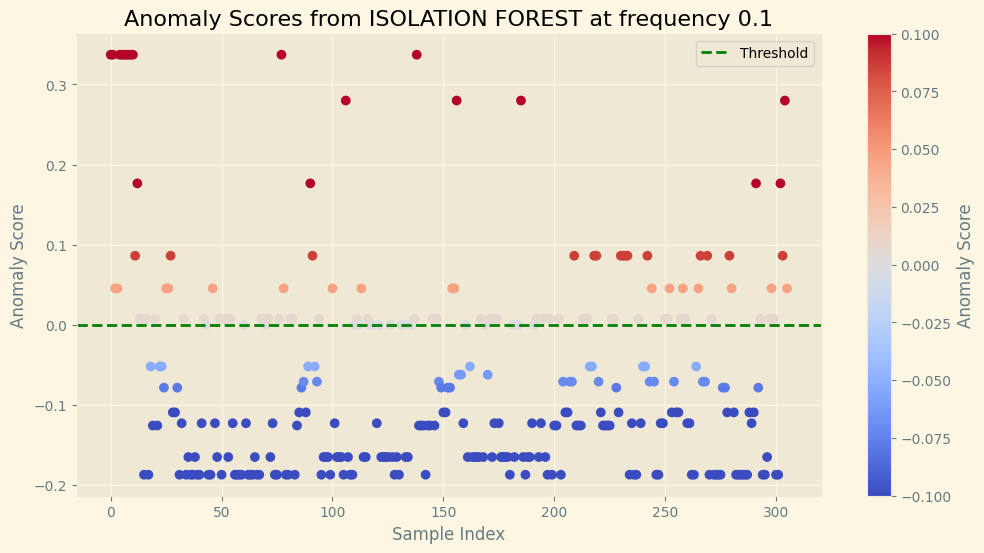

Number of anomalies detected: 94
Threshold: 0.0000
ROC AUC Score: 0.8016
F1 Score: 0.6533
Accuracy: 0.7745
Precision: 0.6915
Recall: 0.6190
              precision    recall  f1-score   support

           0       0.81      0.86      0.83       201
           1       0.69      0.62      0.65       105

    accuracy                           0.77       306
   macro avg       0.75      0.74      0.74       306
weighted avg       0.77      0.77      0.77       306



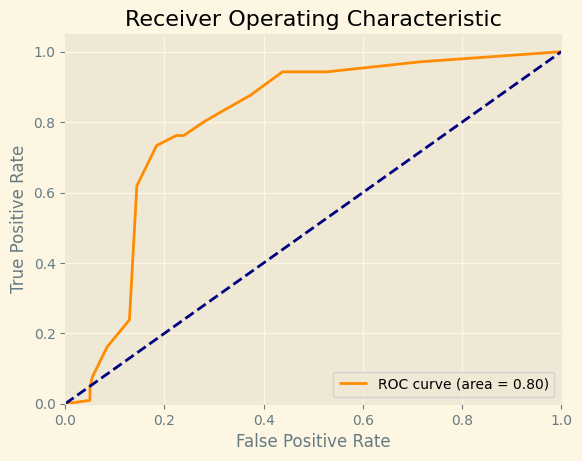

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=1)
61
IsolationForest(contamination=0.4, n_estimators=1)
143
IsolationForest(contamination=0.5, n_estimators=1)
186
IsolationForest(contamination=0.03, n_estimators=1)
5
IsolationForest(contamination=0.0475, n_estimators=1)
0
IsolationForest(contamination=0.065, n_estimators=1)
13
IsolationForest(contamination=0.0825, n_estimators=1)
88


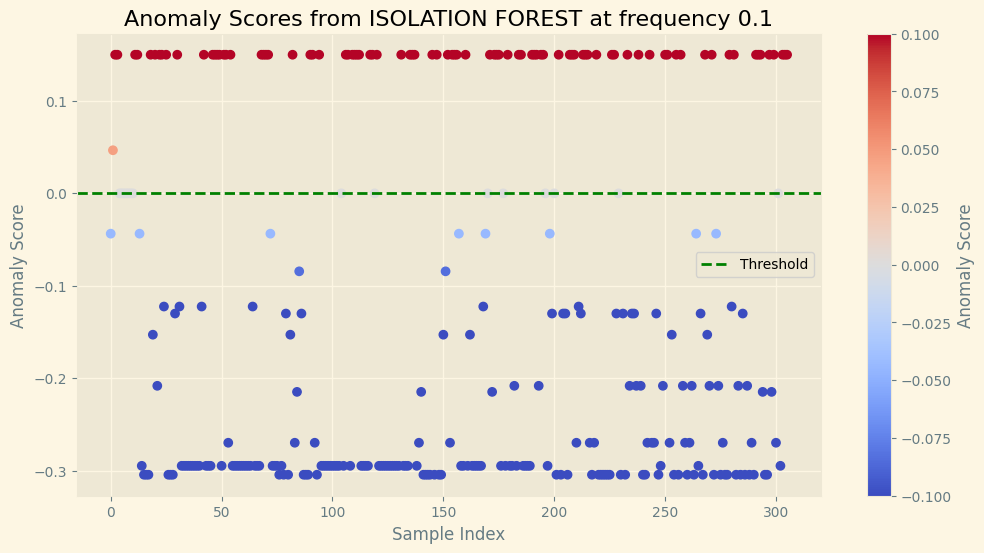

Number of anomalies detected: 88
Threshold: 0.0000
ROC AUC Score: 0.8907
F1 Score: 0.8497
Accuracy: 0.9052
Precision: 0.9318
Recall: 0.7810
              precision    recall  f1-score   support

           0       0.89      0.97      0.93       201
           1       0.93      0.78      0.85       105

    accuracy                           0.91       306
   macro avg       0.91      0.88      0.89       306
weighted avg       0.91      0.91      0.90       306



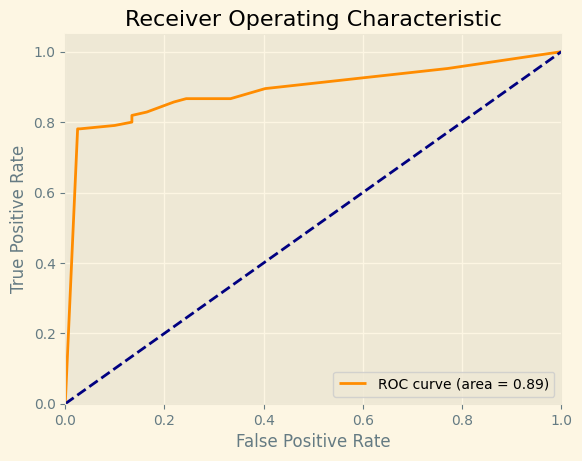

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=1)
61
IsolationForest(contamination=0.3431372549019608, n_estimators=2)
127
IsolationForest(contamination=0.005, n_estimators=2)
0
IsolationForest(contamination=0.001, n_estimators=2)
0
IsolationForest(contamination=0.001, n_estimators=2)
0
IsolationForest(contamination=0.03, n_estimators=2)
13
IsolationForest(contamination=0.05, n_estimators=2)
28
IsolationForest(contamination=0.1, n_estimators=2)
72
IsolationForest(contamination=0.2, n_estimators=2)
73
IsolationForest(contamination=0.3, n_estimators=2)
120
IsolationForest(contamination=0.4, n_estimators=2)
179
IsolationForest(contamination=0.5, n_estimators=2)
172
IsolationForest(contamination=0.03, n_estimators=2)
38
IsolationForest(contamination=0.0475, n_estimators=2)
10
IsolationForest(contamination=0.065, n_estimators=2)
23
IsolationForest(contamination=0.0825, n_estimators=2)
85


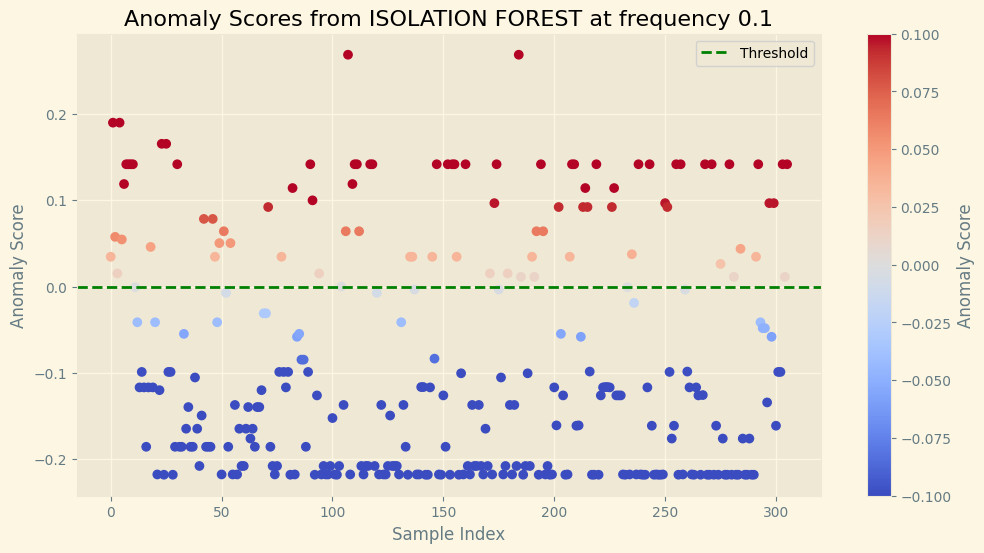

Number of anomalies detected: 85
Threshold: 0.0000
ROC AUC Score: 0.9045
F1 Score: 0.7368
Accuracy: 0.8366
Precision: 0.8235
Recall: 0.6667
              precision    recall  f1-score   support

           0       0.84      0.93      0.88       201
           1       0.82      0.67      0.74       105

    accuracy                           0.84       306
   macro avg       0.83      0.80      0.81       306
weighted avg       0.84      0.84      0.83       306



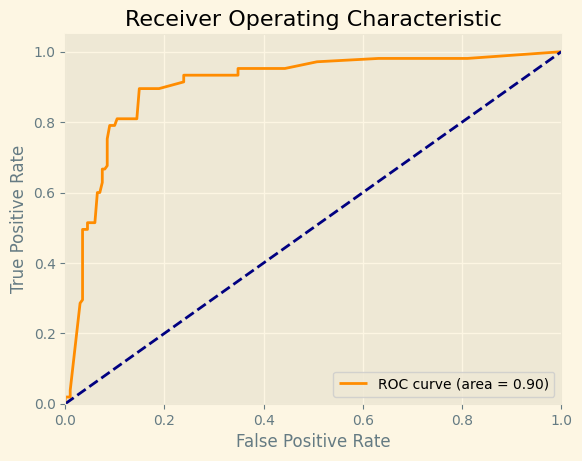

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=2)
65
IsolationForest(contamination=0.3431372549019608, n_estimators=3)
164
IsolationForest(contamination=0.005, n_estimators=3)
65
IsolationForest(contamination=0.001, n_estimators=3)
0
IsolationForest(contamination=0.001, n_estimators=3)
0
IsolationForest(contamination=0.03, n_estimators=3)
2
IsolationForest(contamination=0.05, n_estimators=3)
79
IsolationForest(contamination=0.1, n_estimators=3)
112


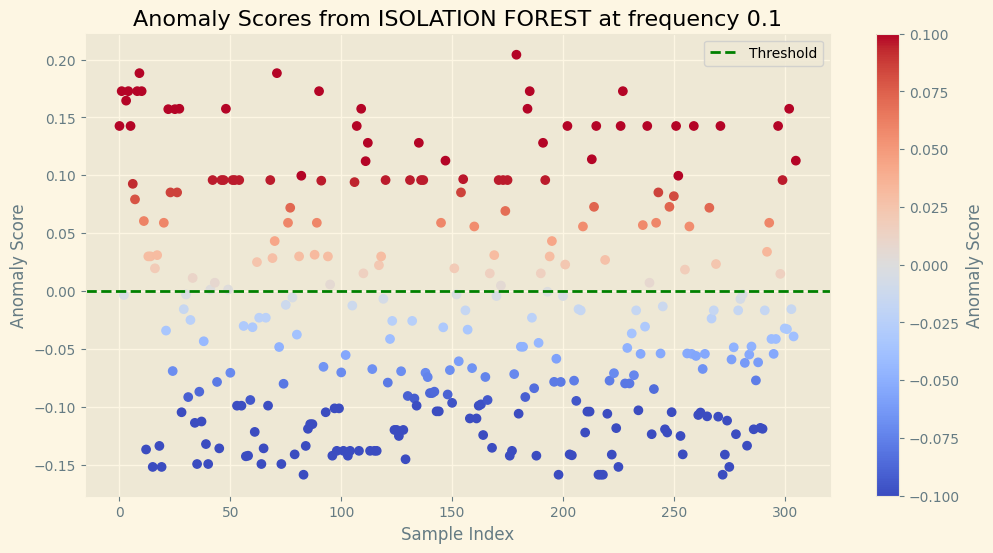

Number of anomalies detected: 112
Threshold: 0.0000
ROC AUC Score: 0.9204
F1 Score: 0.8111
Accuracy: 0.8660
Precision: 0.7857
Recall: 0.8381
              precision    recall  f1-score   support

           0       0.91      0.88      0.90       201
           1       0.79      0.84      0.81       105

    accuracy                           0.87       306
   macro avg       0.85      0.86      0.85       306
weighted avg       0.87      0.87      0.87       306



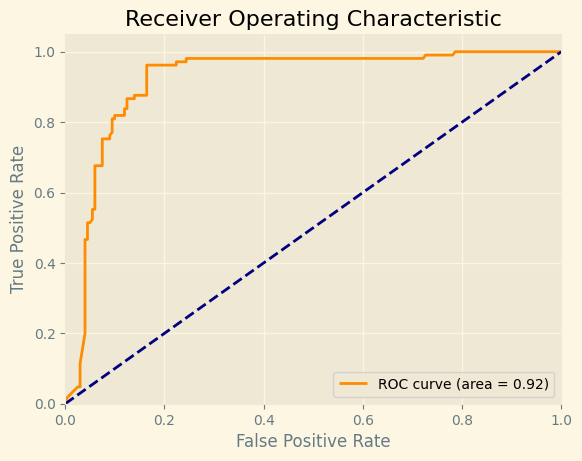

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2, n_estimators=3)
83


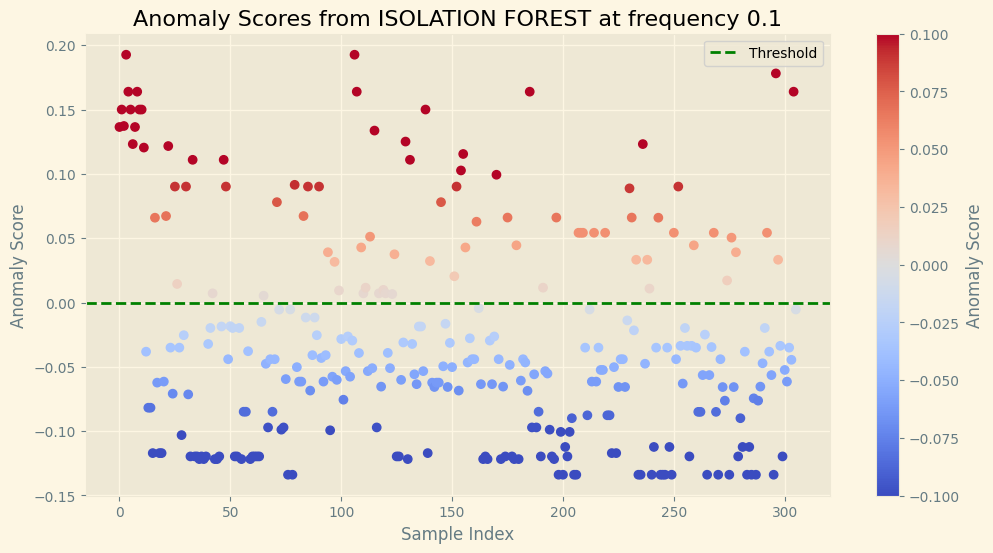

Number of anomalies detected: 83
Threshold: 0.0000
ROC AUC Score: 0.6875
F1 Score: 0.4894
Accuracy: 0.6863
Precision: 0.5542
Recall: 0.4381
              precision    recall  f1-score   support

           0       0.74      0.82      0.77       201
           1       0.55      0.44      0.49       105

    accuracy                           0.69       306
   macro avg       0.64      0.63      0.63       306
weighted avg       0.67      0.69      0.68       306



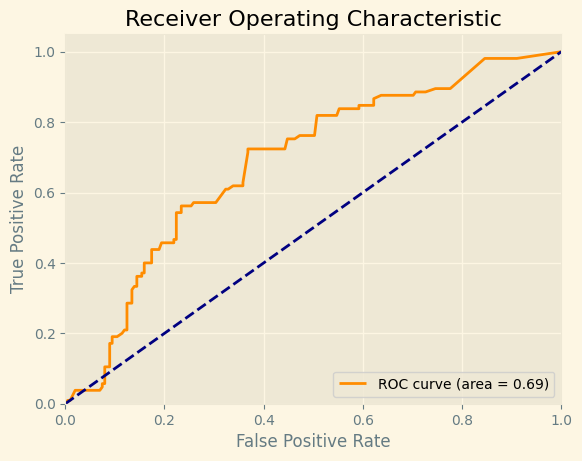

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=3)
163
IsolationForest(contamination=0.4, n_estimators=3)
145
IsolationForest(contamination=0.5, n_estimators=3)
196
IsolationForest(contamination=0.03, n_estimators=3)
12
IsolationForest(contamination=0.0475, n_estimators=3)
21
IsolationForest(contamination=0.065, n_estimators=3)
46
IsolationForest(contamination=0.0825, n_estimators=3)
76
IsolationForest(contamination=0.1, n_estimators=3)
46
IsolationForest(contamination=0.3431372549019608, n_estimators=5)
154
IsolationForest(contamination=0.005, n_estimators=5)
0
IsolationForest(contamination=0.001, n_estimators=5)
0
IsolationForest(contamination=0.001, n_estimators=5)
5
IsolationForest(contamination=0.03, n_estimators=5)
12
IsolationForest(contamination=0.05, n_estimators=5)
15
IsolationForest(contamination=0.1, n_estimators=5)
64
IsolationForest(contamination=0.2, n_estimators=5)
141
Isolati

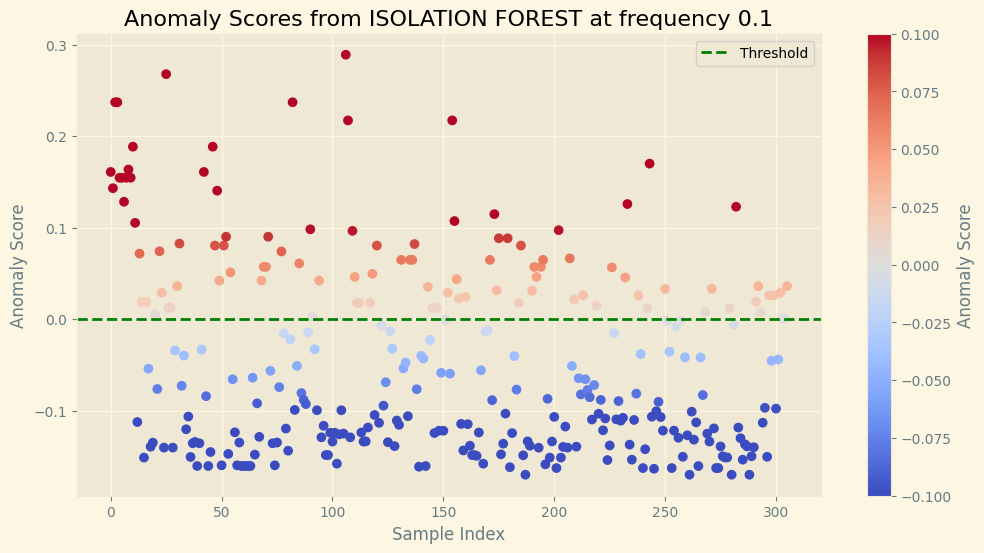

Number of anomalies detected: 100
Threshold: 0.0000
ROC AUC Score: 0.9155
F1 Score: 0.8000
Accuracy: 0.8660
Precision: 0.8200
Recall: 0.7810
              precision    recall  f1-score   support

           0       0.89      0.91      0.90       201
           1       0.82      0.78      0.80       105

    accuracy                           0.87       306
   macro avg       0.85      0.85      0.85       306
weighted avg       0.86      0.87      0.87       306



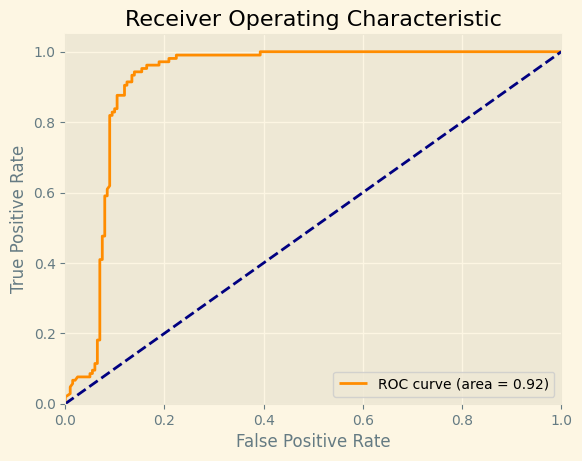

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825, n_estimators=5)
119


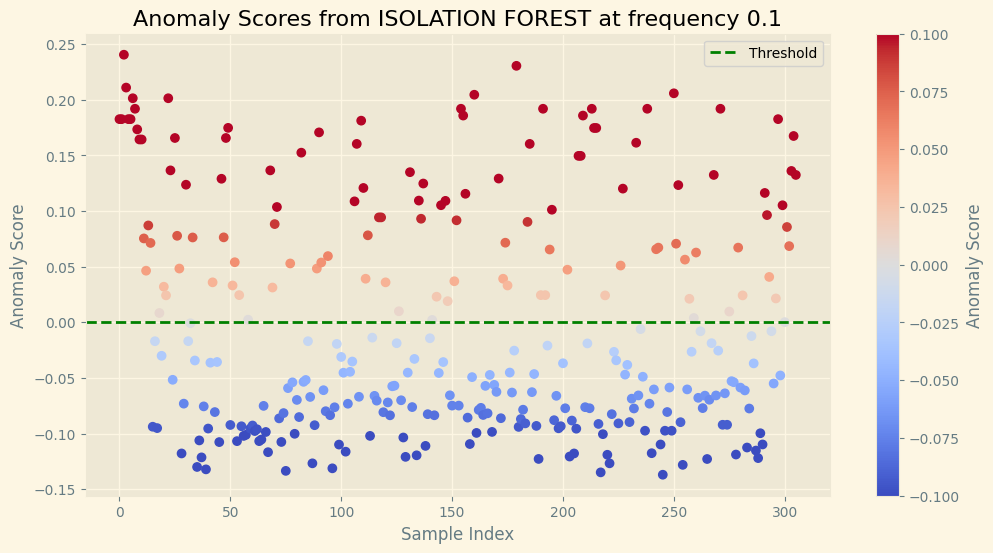

Number of anomalies detected: 119
Threshold: 0.0000
ROC AUC Score: 0.9201
F1 Score: 0.8571
Accuracy: 0.8954
Precision: 0.8067
Recall: 0.9143
              precision    recall  f1-score   support

           0       0.95      0.89      0.92       201
           1       0.81      0.91      0.86       105

    accuracy                           0.90       306
   macro avg       0.88      0.90      0.89       306
weighted avg       0.90      0.90      0.90       306



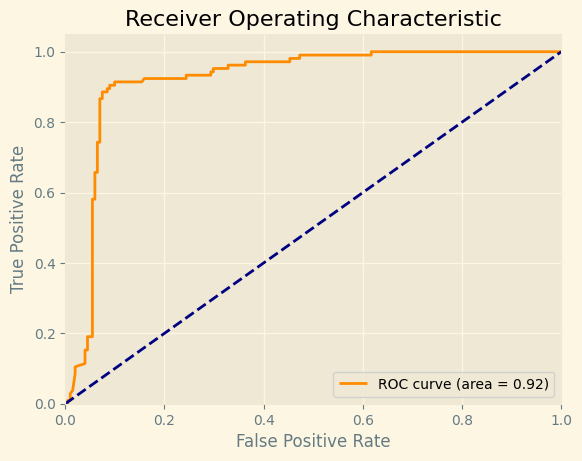

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=5)
111


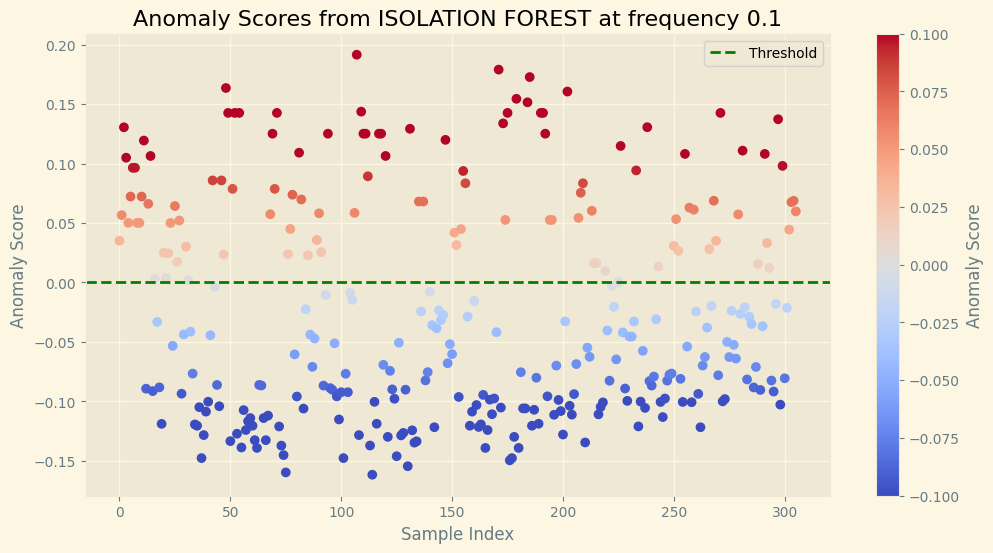

Number of anomalies detected: 111
Threshold: 0.0000
ROC AUC Score: 0.9457
F1 Score: 0.8611
Accuracy: 0.9020
Precision: 0.8378
Recall: 0.8857
              precision    recall  f1-score   support

           0       0.94      0.91      0.92       201
           1       0.84      0.89      0.86       105

    accuracy                           0.90       306
   macro avg       0.89      0.90      0.89       306
weighted avg       0.90      0.90      0.90       306



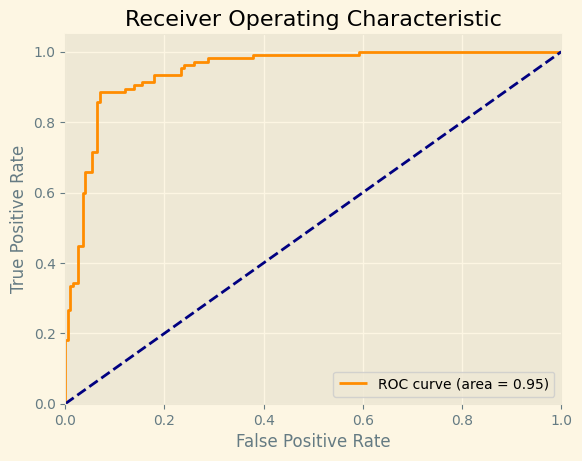

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3431372549019608, n_estimators=10)
174
IsolationForest(contamination=0.005, n_estimators=10)
2
IsolationForest(contamination=0.001, n_estimators=10)
0
IsolationForest(contamination=0.001, n_estimators=10)
0
IsolationForest(contamination=0.03, n_estimators=10)
13
IsolationForest(contamination=0.05, n_estimators=10)
30
IsolationForest(contamination=0.1, n_estimators=10)
116


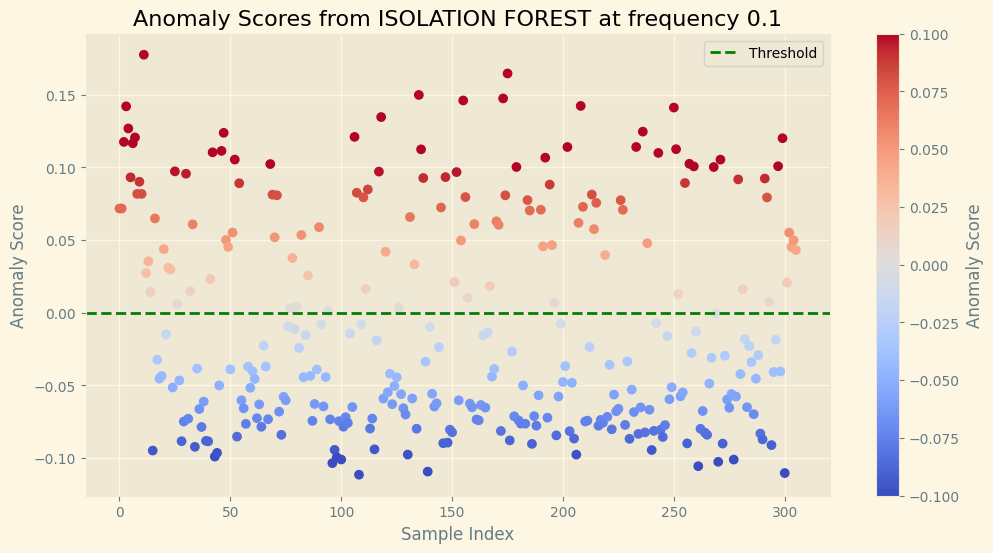

Number of anomalies detected: 116
Threshold: 0.0000
ROC AUC Score: 0.9317
F1 Score: 0.8688
Accuracy: 0.9052
Precision: 0.8276
Recall: 0.9143
              precision    recall  f1-score   support

           0       0.95      0.90      0.93       201
           1       0.83      0.91      0.87       105

    accuracy                           0.91       306
   macro avg       0.89      0.91      0.90       306
weighted avg       0.91      0.91      0.91       306



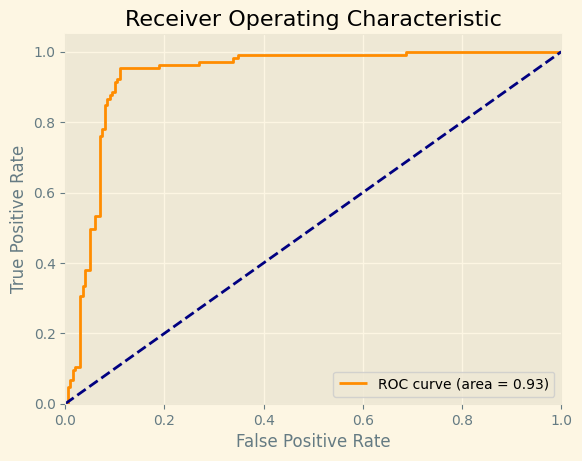

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2, n_estimators=10)
129
IsolationForest(contamination=0.3, n_estimators=10)
161
IsolationForest(contamination=0.4, n_estimators=10)
166
IsolationForest(contamination=0.5, n_estimators=10)
207
IsolationForest(contamination=0.03, n_estimators=10)
11
IsolationForest(contamination=0.0475, n_estimators=10)
72
IsolationForest(contamination=0.065, n_estimators=10)
93


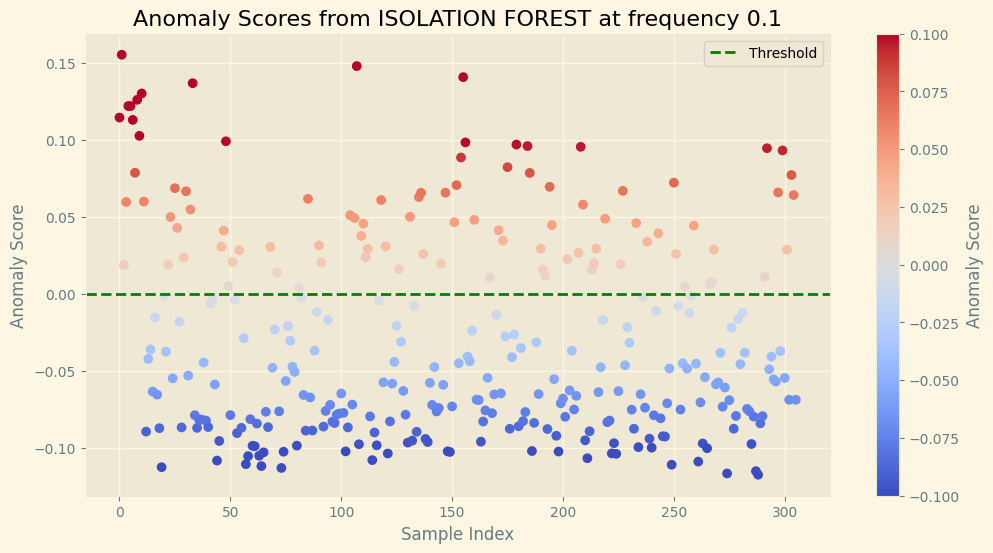

Number of anomalies detected: 93
Threshold: 0.0000
ROC AUC Score: 0.9218
F1 Score: 0.7879
Accuracy: 0.8627
Precision: 0.8387
Recall: 0.7429
              precision    recall  f1-score   support

           0       0.87      0.93      0.90       201
           1       0.84      0.74      0.79       105

    accuracy                           0.86       306
   macro avg       0.86      0.83      0.84       306
weighted avg       0.86      0.86      0.86       306



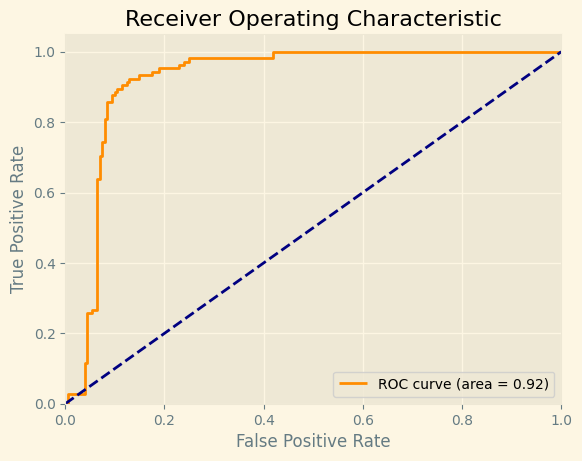

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825, n_estimators=10)
104


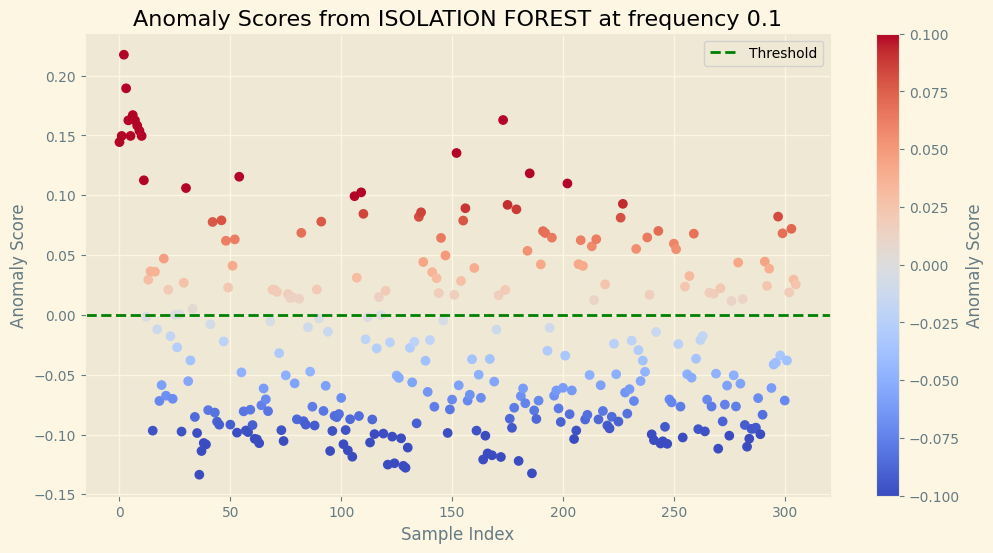

Number of anomalies detected: 104
Threshold: 0.0000
ROC AUC Score: 0.9218
F1 Score: 0.8230
Accuracy: 0.8791
Precision: 0.8269
Recall: 0.8190
              precision    recall  f1-score   support

           0       0.91      0.91      0.91       201
           1       0.83      0.82      0.82       105

    accuracy                           0.88       306
   macro avg       0.87      0.86      0.87       306
weighted avg       0.88      0.88      0.88       306



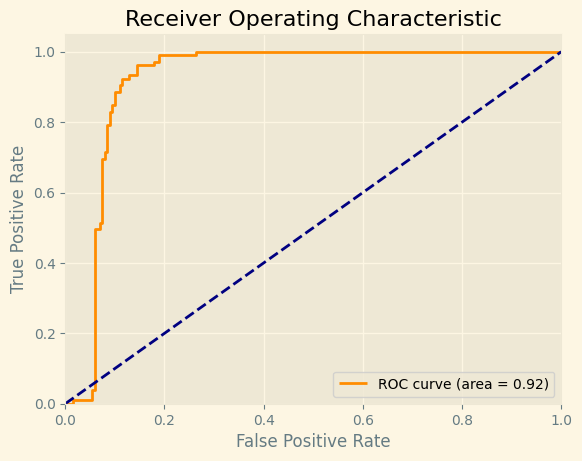

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=10)
104


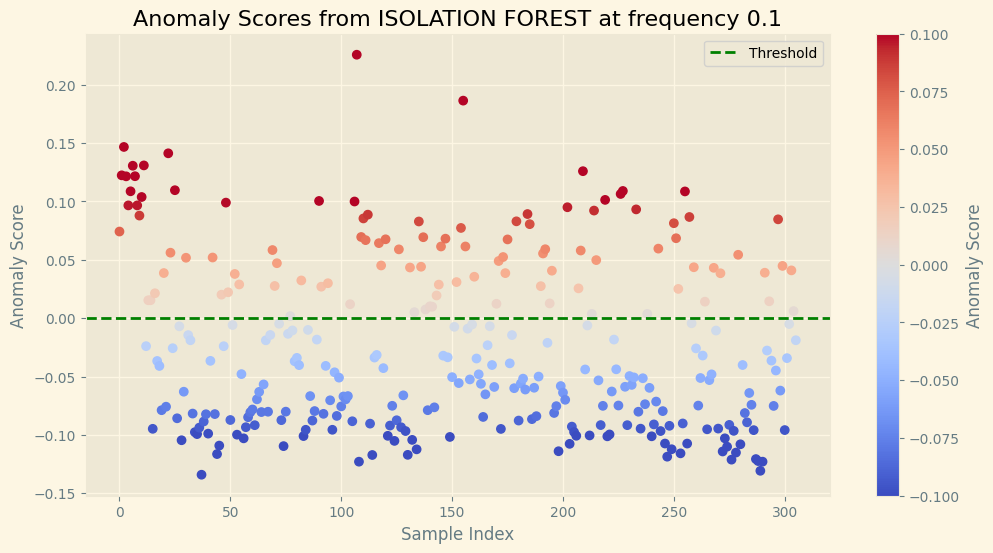

Number of anomalies detected: 104
Threshold: 0.0000
ROC AUC Score: 0.9023
F1 Score: 0.7847
Accuracy: 0.8529
Precision: 0.7885
Recall: 0.7810
              precision    recall  f1-score   support

           0       0.89      0.89      0.89       201
           1       0.79      0.78      0.78       105

    accuracy                           0.85       306
   macro avg       0.84      0.84      0.84       306
weighted avg       0.85      0.85      0.85       306



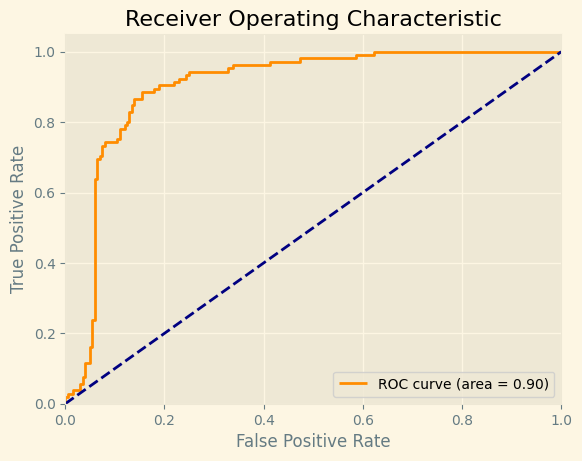

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3431372549019608)
169
IsolationForest(contamination=0.005)
0
IsolationForest(contamination=0.001)
0
IsolationForest(contamination=0.001)
0
IsolationForest(contamination=0.03)
14
IsolationForest(contamination=0.05)
103


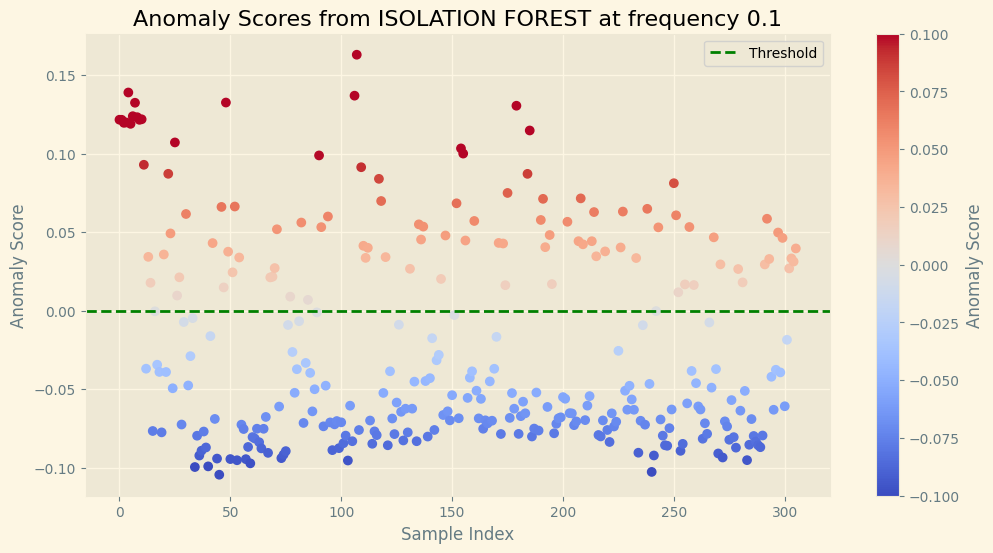

Number of anomalies detected: 103
Threshold: 0.0000
ROC AUC Score: 0.9406
F1 Score: 0.8750
Accuracy: 0.9150
Precision: 0.8835
Recall: 0.8667
              precision    recall  f1-score   support

           0       0.93      0.94      0.94       201
           1       0.88      0.87      0.88       105

    accuracy                           0.92       306
   macro avg       0.91      0.90      0.91       306
weighted avg       0.91      0.92      0.91       306



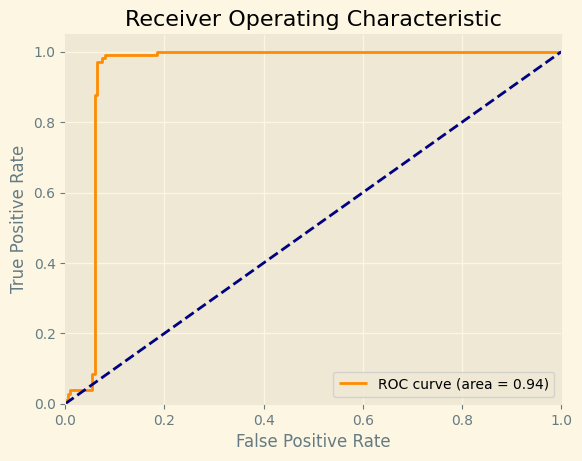

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1)
121
IsolationForest(contamination=0.2)
141
IsolationForest(contamination=0.3)
157
IsolationForest(contamination=0.4)
168
IsolationForest(contamination=0.5)
189
IsolationForest(contamination=0.03)
20
IsolationForest(contamination=0.0475)
101


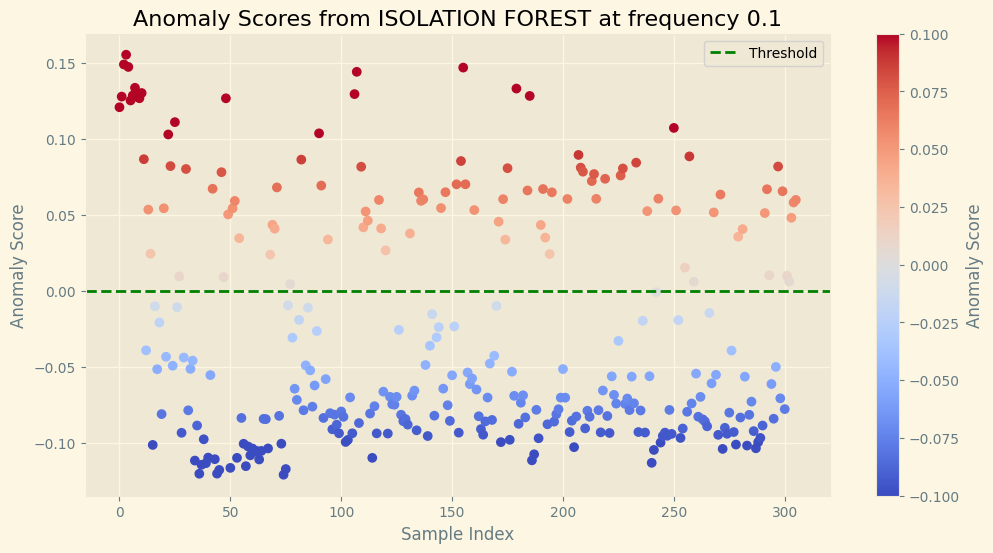

Number of anomalies detected: 101
Threshold: 0.0000
ROC AUC Score: 0.9381
F1 Score: 0.8641
Accuracy: 0.9085
Precision: 0.8812
Recall: 0.8476
              precision    recall  f1-score   support

           0       0.92      0.94      0.93       201
           1       0.88      0.85      0.86       105

    accuracy                           0.91       306
   macro avg       0.90      0.89      0.90       306
weighted avg       0.91      0.91      0.91       306



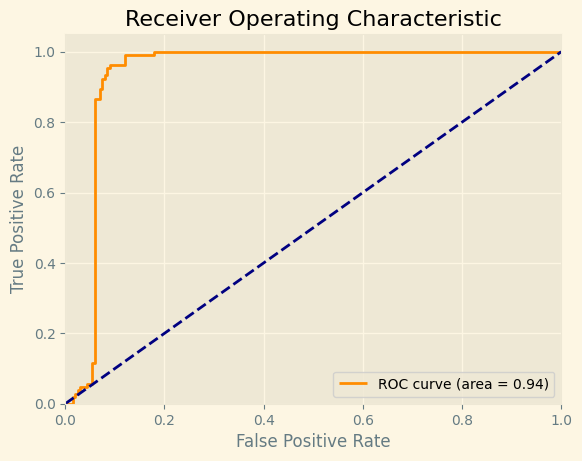

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.065)
109


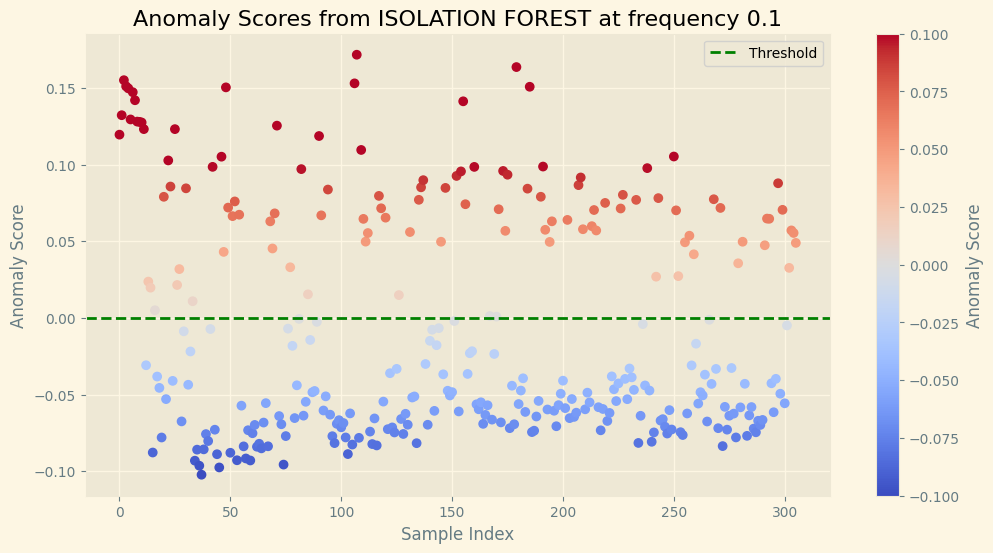

Number of anomalies detected: 109
Threshold: 0.0000
ROC AUC Score: 0.9419
F1 Score: 0.8879
Accuracy: 0.9216
Precision: 0.8716
Recall: 0.9048
              precision    recall  f1-score   support

           0       0.95      0.93      0.94       201
           1       0.87      0.90      0.89       105

    accuracy                           0.92       306
   macro avg       0.91      0.92      0.91       306
weighted avg       0.92      0.92      0.92       306



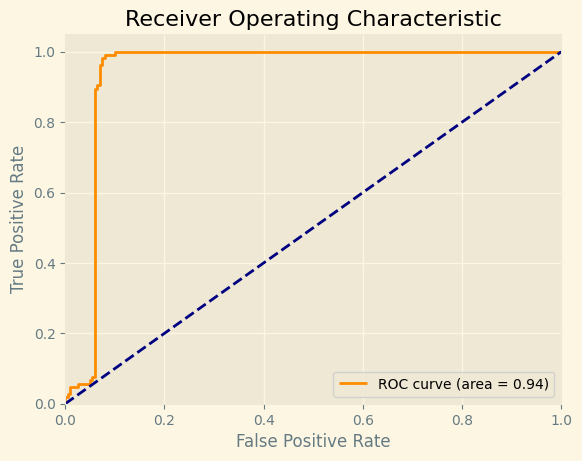

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825)
117


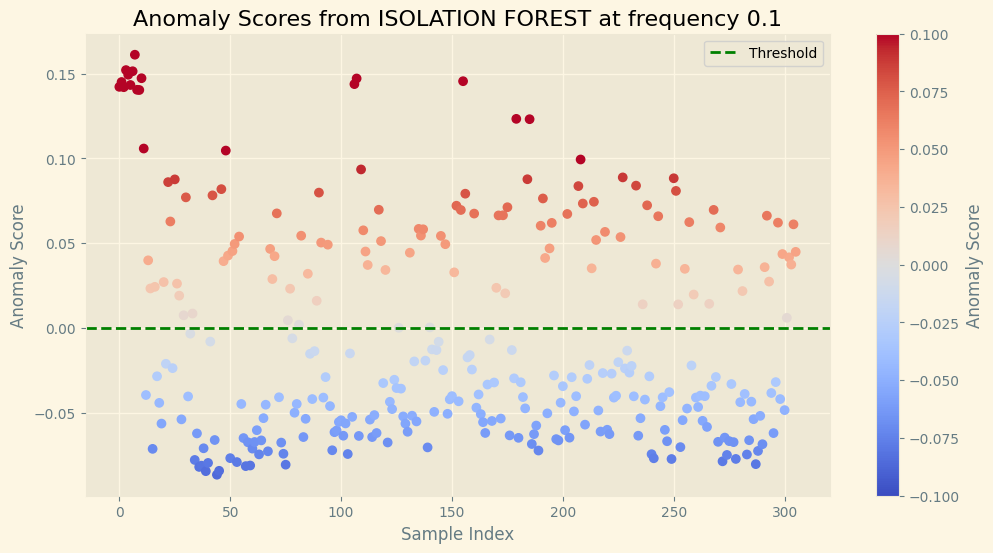

Number of anomalies detected: 117
Threshold: 0.0000
ROC AUC Score: 0.9392
F1 Score: 0.9189
Accuracy: 0.9412
Precision: 0.8718
Recall: 0.9714
              precision    recall  f1-score   support

           0       0.98      0.93      0.95       201
           1       0.87      0.97      0.92       105

    accuracy                           0.94       306
   macro avg       0.93      0.95      0.94       306
weighted avg       0.95      0.94      0.94       306



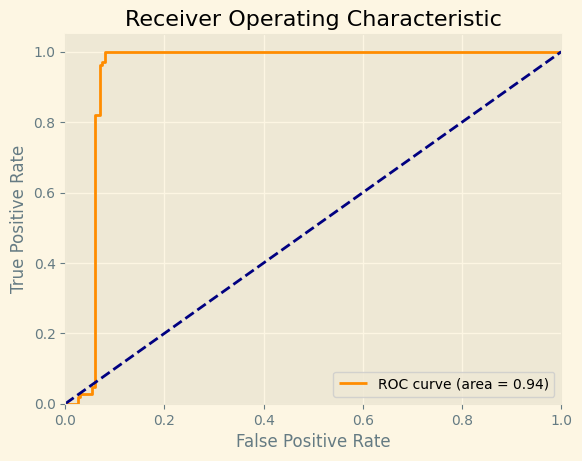

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1)
120


In [22]:
threshold = 0 # threshold 0 for decision_function method
for idx, anomaly_scores in enumerate(anomaly_scores_s):
    print(f"{clf_s[idx][0]}")
    anomaly_scores = -anomaly_scores    #This is done as scores from decision function that are lower than 0 are considered abnomalies (see literature)

    anomalies_detected = np.sum(anomaly_scores > 0)    
    print(f"{anomalies_detected}")
    if (anomalies_detected > 80 and anomalies_detected < 120):
        _ = plot_anomalies(anomaly_scores, freq, threshold, "ISOLATION FOREST")
        compute_metrics(anomaly_scores, y_test_collision, threshold)
        plot_roc_curve(y_test_collision.values, anomaly_scores)
        print("########################## ---------------------------------------- ##########################")
    # plot_anomalies_over_time(X_test, anomaly_scores, anomalies_detected, freq, threshold, collision_zones, X_test_start_end)

### Classifying collisions_1

IsolationForest(contamination=0.3431372549019608, n_estimators=1)
70
IsolationForest(contamination=0.005, n_estimators=1)
0
IsolationForest(contamination=0.001, n_estimators=1)
0
IsolationForest(contamination=0.001, n_estimators=1)
0
IsolationForest(contamination=0.03, n_estimators=1)
0
IsolationForest(contamination=0.05, n_estimators=1)
5
IsolationForest(contamination=0.1, n_estimators=1)
5
IsolationForest(contamination=0.2, n_estimators=1)
33


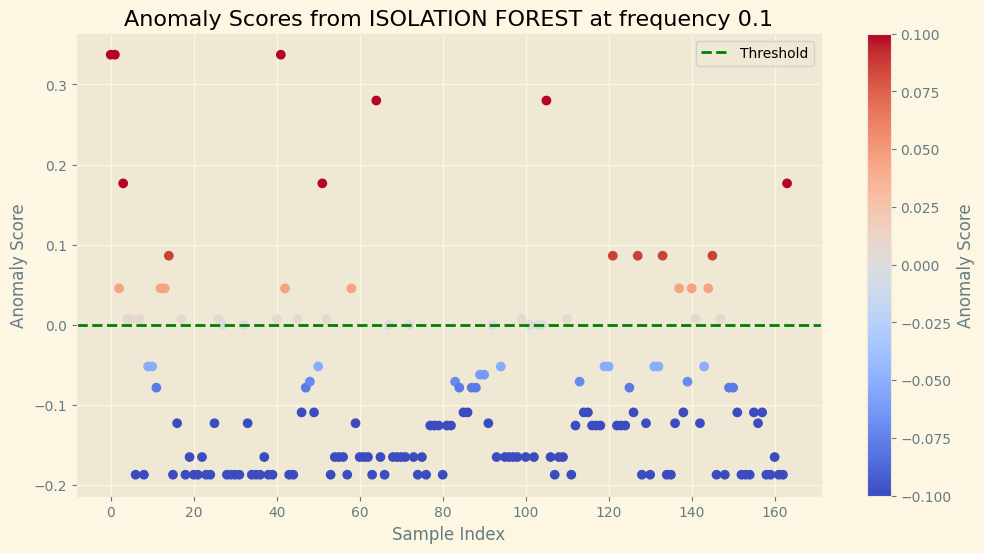

Number of anomalies detected: 33
Threshold: 0.0000
ROC AUC Score: 0.8445
F1 Score: 0.6471
Accuracy: 0.8537
Precision: 0.6667
Recall: 0.6286
              precision    recall  f1-score   support

           0       0.90      0.91      0.91       129
           1       0.67      0.63      0.65        35

    accuracy                           0.85       164
   macro avg       0.78      0.77      0.78       164
weighted avg       0.85      0.85      0.85       164



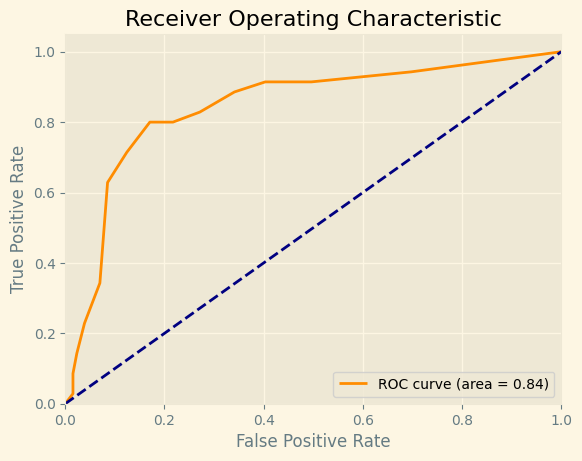

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=1)
39


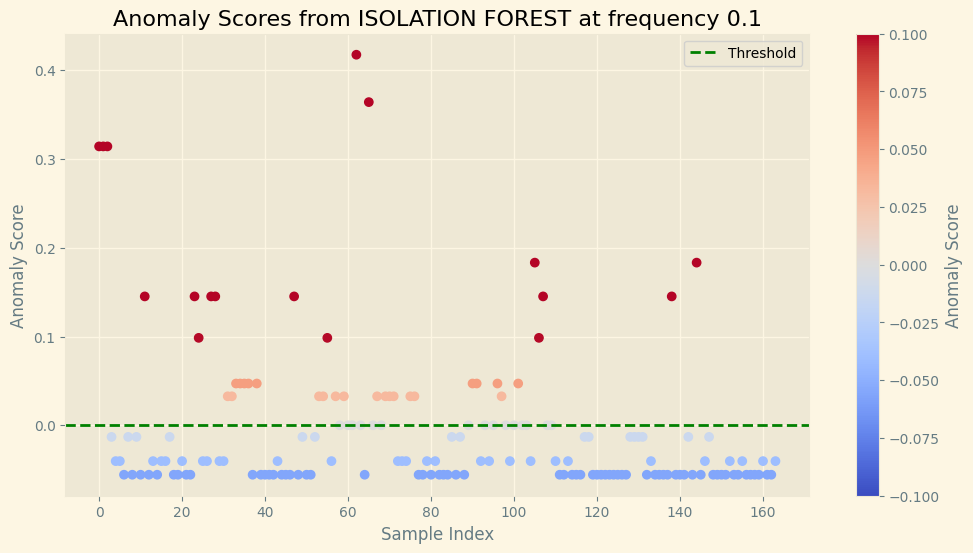

Number of anomalies detected: 39
Threshold: 0.0000
ROC AUC Score: 0.3797
F1 Score: 0.0541
Accuracy: 0.5732
Precision: 0.0513
Recall: 0.0571
              precision    recall  f1-score   support

           0       0.74      0.71      0.72       129
           1       0.05      0.06      0.05        35

    accuracy                           0.57       164
   macro avg       0.39      0.39      0.39       164
weighted avg       0.59      0.57      0.58       164



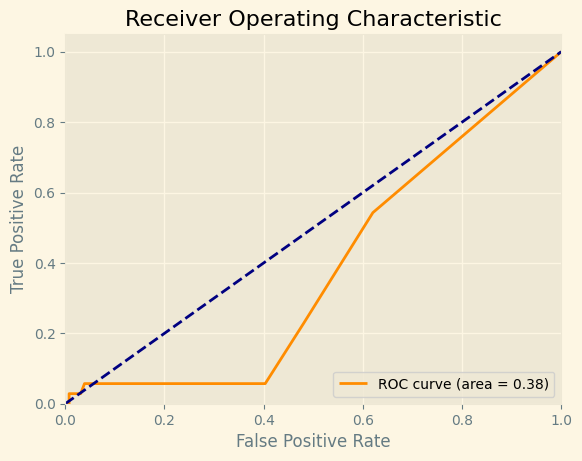

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.4, n_estimators=1)
62
IsolationForest(contamination=0.5, n_estimators=1)
86
IsolationForest(contamination=0.03, n_estimators=1)
3
IsolationForest(contamination=0.0475, n_estimators=1)
0
IsolationForest(contamination=0.065, n_estimators=1)
5
IsolationForest(contamination=0.0825, n_estimators=1)
16
IsolationForest(contamination=0.1, n_estimators=1)
21


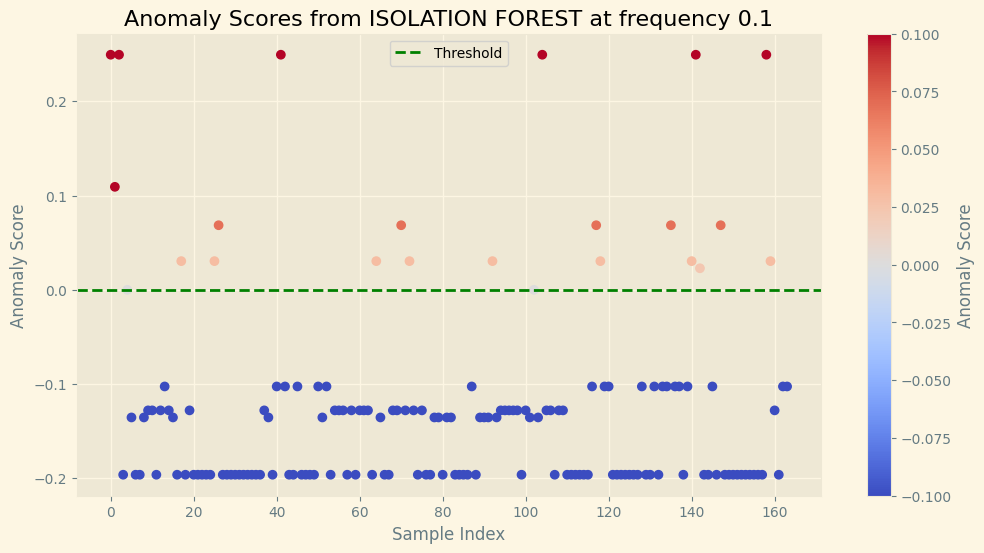

Number of anomalies detected: 21
Threshold: 0.0000
ROC AUC Score: 0.7907
F1 Score: 0.3571
Accuracy: 0.7805
Precision: 0.4762
Recall: 0.2857
              precision    recall  f1-score   support

           0       0.83      0.91      0.87       129
           1       0.48      0.29      0.36        35

    accuracy                           0.78       164
   macro avg       0.65      0.60      0.61       164
weighted avg       0.75      0.78      0.76       164



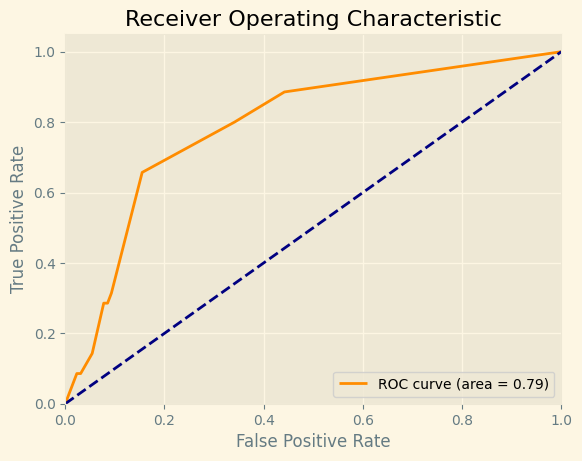

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3431372549019608, n_estimators=2)
64
IsolationForest(contamination=0.005, n_estimators=2)
0
IsolationForest(contamination=0.001, n_estimators=2)
0
IsolationForest(contamination=0.001, n_estimators=2)
0
IsolationForest(contamination=0.03, n_estimators=2)
4
IsolationForest(contamination=0.05, n_estimators=2)
11
IsolationForest(contamination=0.1, n_estimators=2)
20
IsolationForest(contamination=0.2, n_estimators=2)
37


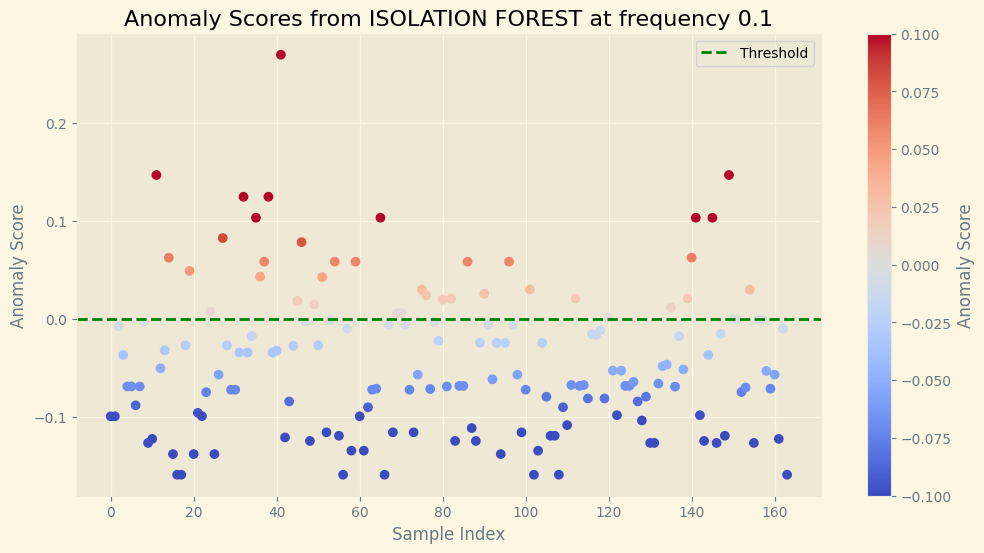

Number of anomalies detected: 37
Threshold: 0.0000
ROC AUC Score: 0.5130
F1 Score: 0.2500
Accuracy: 0.6707
Precision: 0.2432
Recall: 0.2571
              precision    recall  f1-score   support

           0       0.80      0.78      0.79       129
           1       0.24      0.26      0.25        35

    accuracy                           0.67       164
   macro avg       0.52      0.52      0.52       164
weighted avg       0.68      0.67      0.67       164



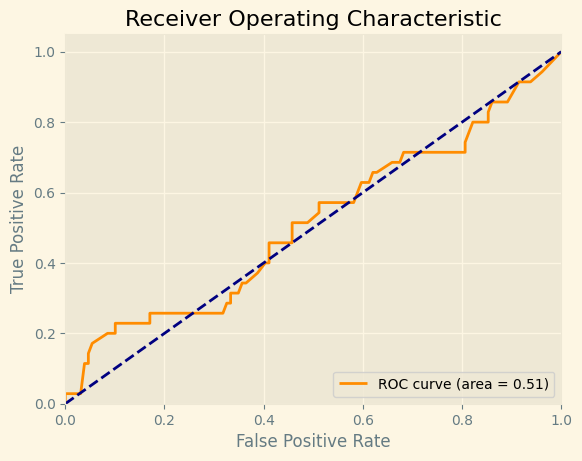

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=2)
50


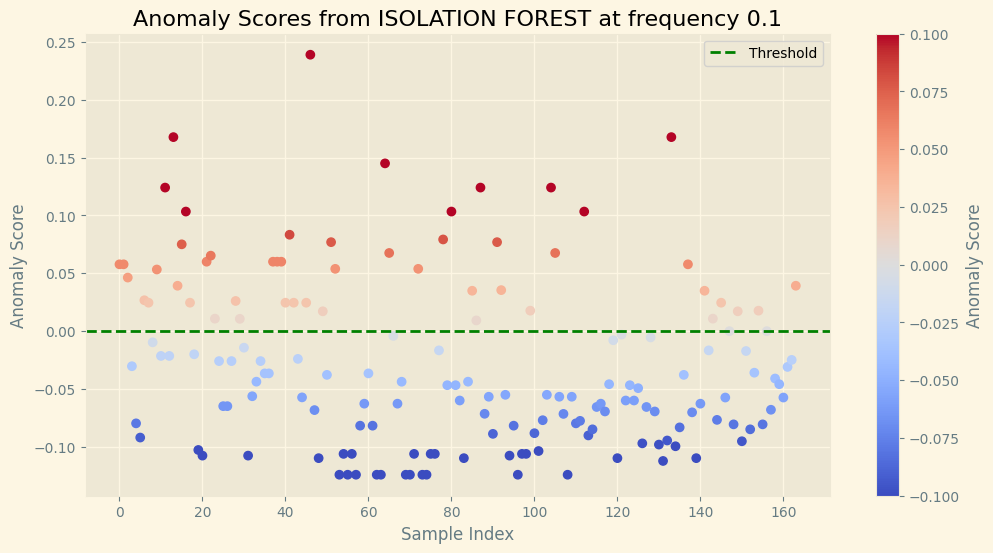

Number of anomalies detected: 50
Threshold: 0.0000
ROC AUC Score: 0.8037
F1 Score: 0.5882
Accuracy: 0.7866
Precision: 0.5000
Recall: 0.7143
              precision    recall  f1-score   support

           0       0.91      0.81      0.86       129
           1       0.50      0.71      0.59        35

    accuracy                           0.79       164
   macro avg       0.71      0.76      0.72       164
weighted avg       0.82      0.79      0.80       164



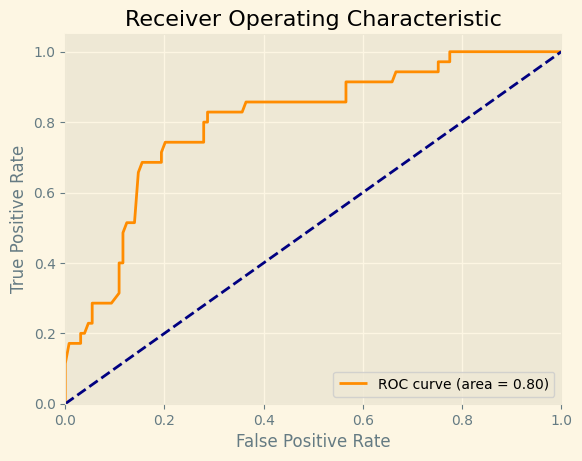

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.4, n_estimators=2)
80
IsolationForest(contamination=0.5, n_estimators=2)
92
IsolationForest(contamination=0.03, n_estimators=2)
11
IsolationForest(contamination=0.0475, n_estimators=2)
6
IsolationForest(contamination=0.065, n_estimators=2)
4
IsolationForest(contamination=0.0825, n_estimators=2)
18
IsolationForest(contamination=0.1, n_estimators=2)
24


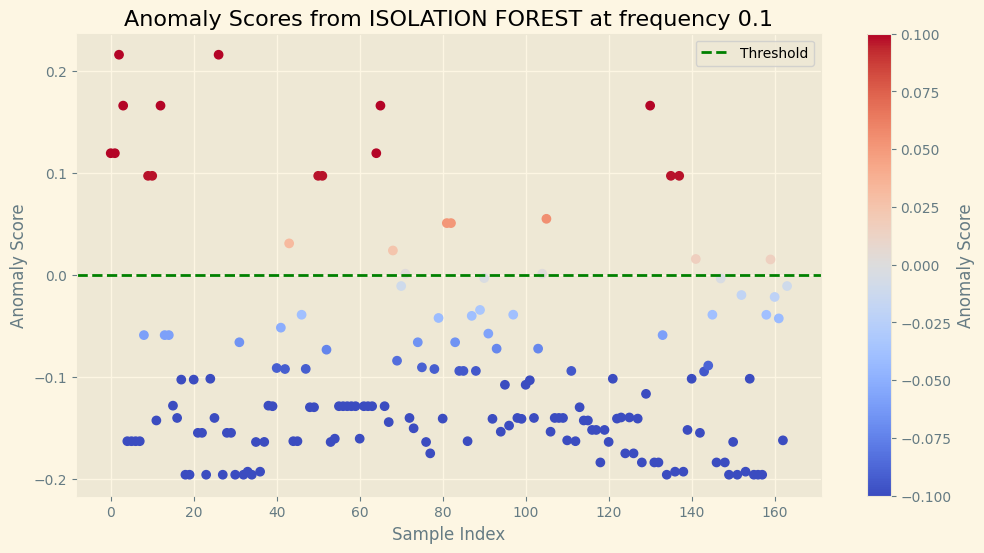

Number of anomalies detected: 24
Threshold: 0.0000
ROC AUC Score: 0.7587
F1 Score: 0.4407
Accuracy: 0.7988
Precision: 0.5417
Recall: 0.3714
              precision    recall  f1-score   support

           0       0.84      0.91      0.88       129
           1       0.54      0.37      0.44        35

    accuracy                           0.80       164
   macro avg       0.69      0.64      0.66       164
weighted avg       0.78      0.80      0.78       164



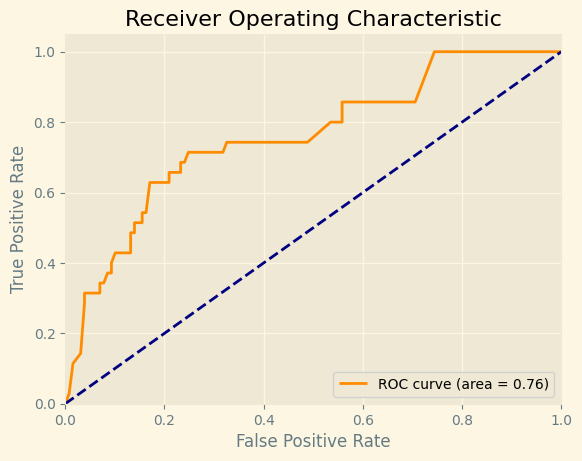

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3431372549019608, n_estimators=3)
75
IsolationForest(contamination=0.005, n_estimators=3)
13
IsolationForest(contamination=0.001, n_estimators=3)
0
IsolationForest(contamination=0.001, n_estimators=3)
0
IsolationForest(contamination=0.03, n_estimators=3)
0
IsolationForest(contamination=0.05, n_estimators=3)
18
IsolationForest(contamination=0.1, n_estimators=3)
40


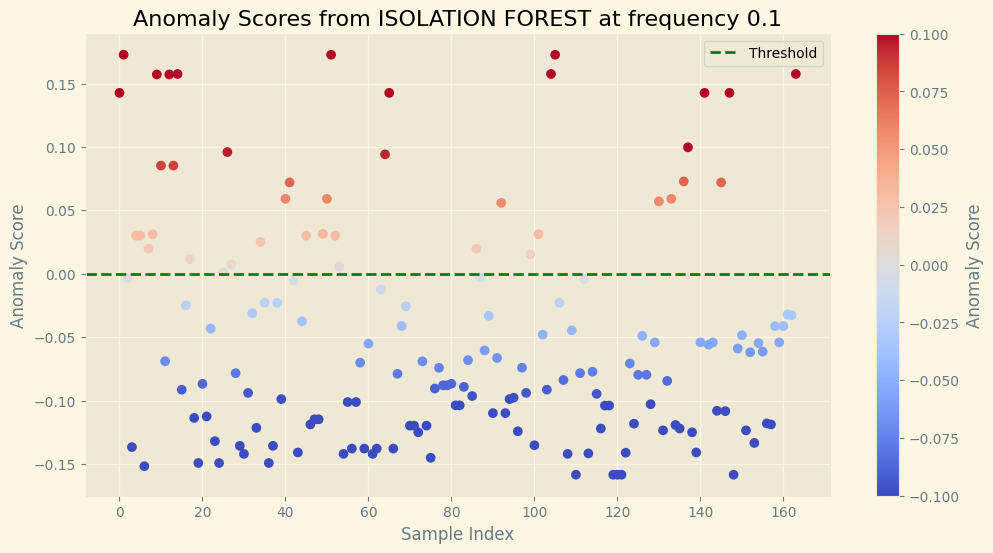

Number of anomalies detected: 40
Threshold: 0.0000
ROC AUC Score: 0.9267
F1 Score: 0.8000
Accuracy: 0.9085
Precision: 0.7500
Recall: 0.8571
              precision    recall  f1-score   support

           0       0.96      0.92      0.94       129
           1       0.75      0.86      0.80        35

    accuracy                           0.91       164
   macro avg       0.85      0.89      0.87       164
weighted avg       0.91      0.91      0.91       164



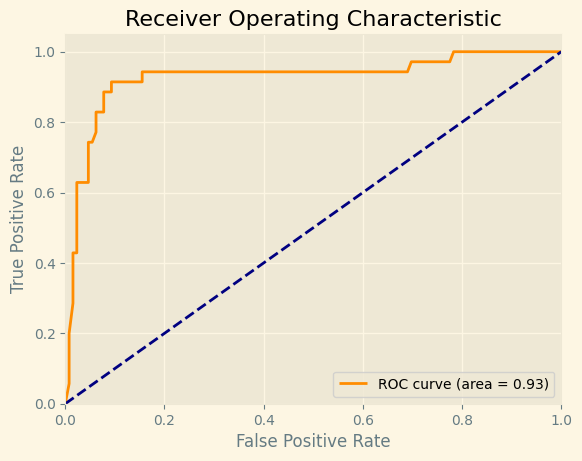

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2, n_estimators=3)
33


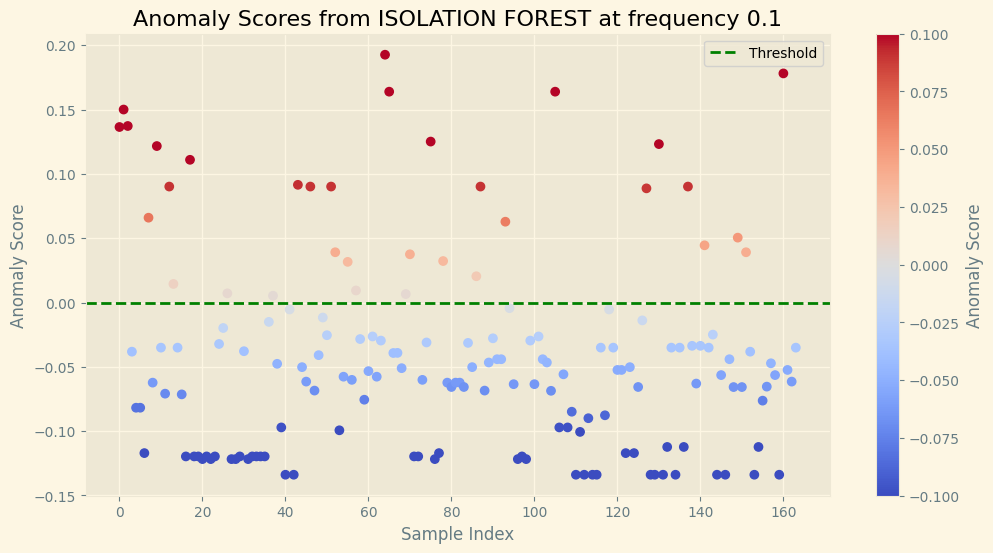

Number of anomalies detected: 33
Threshold: 0.0000
ROC AUC Score: 0.7331
F1 Score: 0.4706
Accuracy: 0.7805
Precision: 0.4848
Recall: 0.4571
              precision    recall  f1-score   support

           0       0.85      0.87      0.86       129
           1       0.48      0.46      0.47        35

    accuracy                           0.78       164
   macro avg       0.67      0.66      0.67       164
weighted avg       0.78      0.78      0.78       164



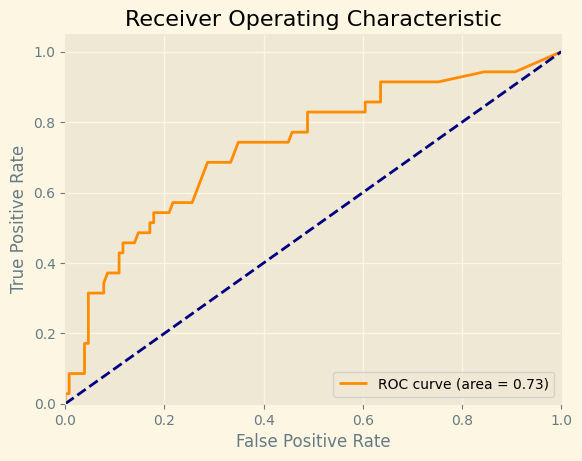

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=3)
70
IsolationForest(contamination=0.4, n_estimators=3)
58


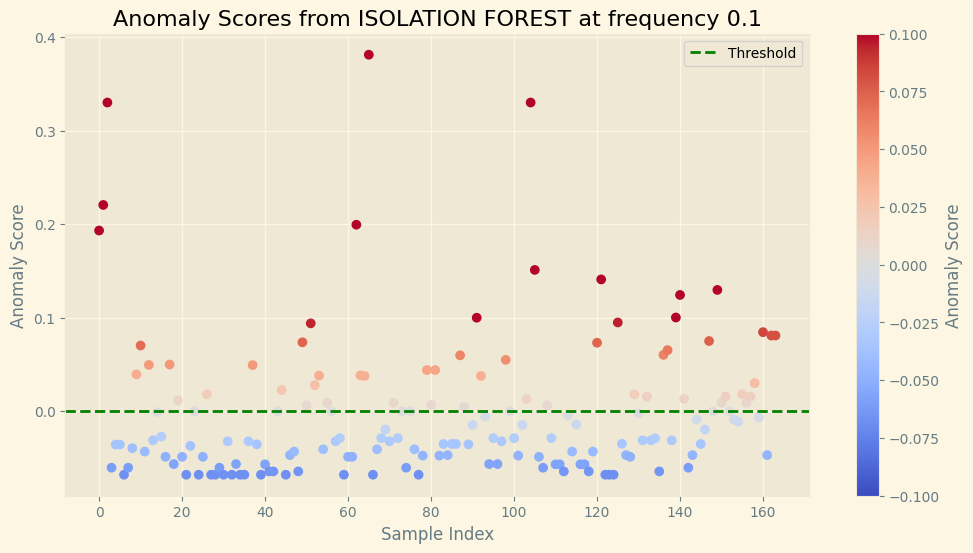

Number of anomalies detected: 58
Threshold: 0.0000
ROC AUC Score: 0.6685
F1 Score: 0.4086
Accuracy: 0.6646
Precision: 0.3276
Recall: 0.5429
              precision    recall  f1-score   support

           0       0.85      0.70      0.77       129
           1       0.33      0.54      0.41        35

    accuracy                           0.66       164
   macro avg       0.59      0.62      0.59       164
weighted avg       0.74      0.66      0.69       164



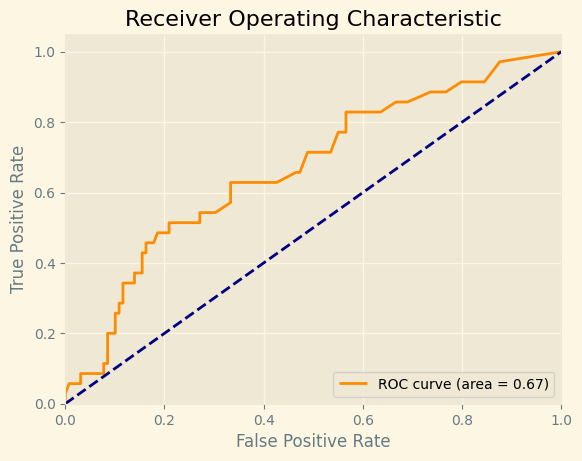

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.5, n_estimators=3)
101
IsolationForest(contamination=0.03, n_estimators=3)
2
IsolationForest(contamination=0.0475, n_estimators=3)
4
IsolationForest(contamination=0.065, n_estimators=3)
18
IsolationForest(contamination=0.0825, n_estimators=3)
18
IsolationForest(contamination=0.1, n_estimators=3)
28


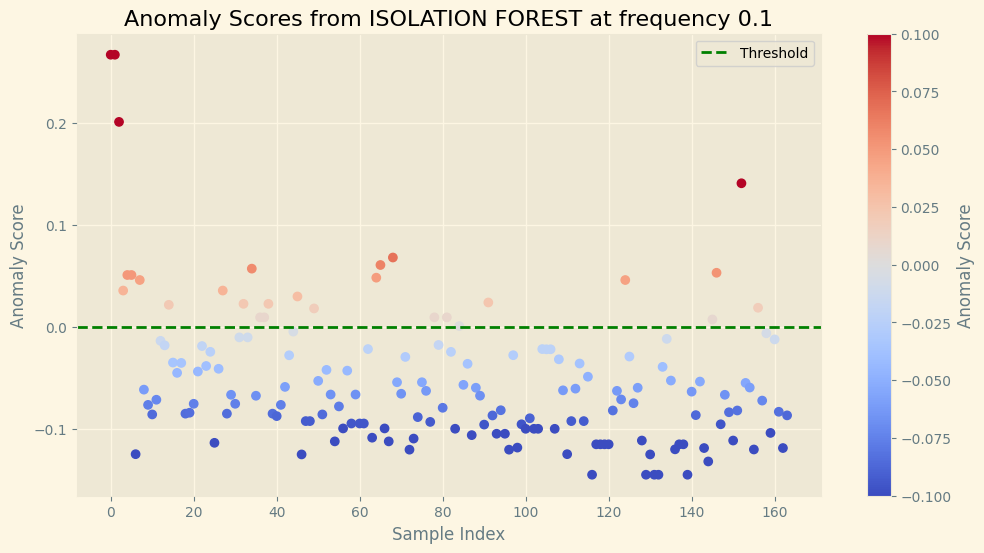

Number of anomalies detected: 28
Threshold: 0.0000
ROC AUC Score: 0.5267
F1 Score: 0.2222
Accuracy: 0.7012
Precision: 0.2500
Recall: 0.2000
              precision    recall  f1-score   support

           0       0.79      0.84      0.82       129
           1       0.25      0.20      0.22        35

    accuracy                           0.70       164
   macro avg       0.52      0.52      0.52       164
weighted avg       0.68      0.70      0.69       164



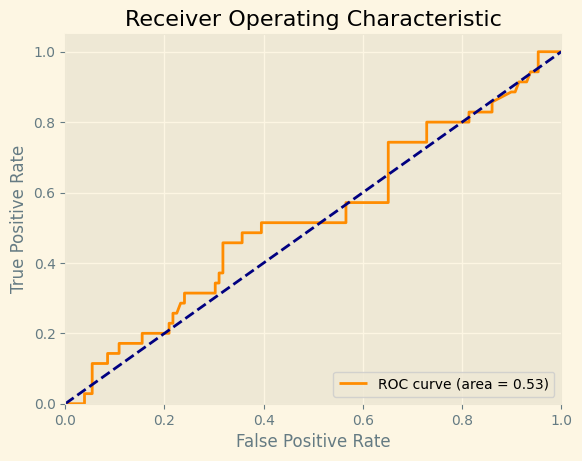

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3431372549019608, n_estimators=5)
65
IsolationForest(contamination=0.005, n_estimators=5)
0
IsolationForest(contamination=0.001, n_estimators=5)
0
IsolationForest(contamination=0.001, n_estimators=5)
0
IsolationForest(contamination=0.03, n_estimators=5)
2
IsolationForest(contamination=0.05, n_estimators=5)
5
IsolationForest(contamination=0.1, n_estimators=5)
20
IsolationForest(contamination=0.2, n_estimators=5)
54


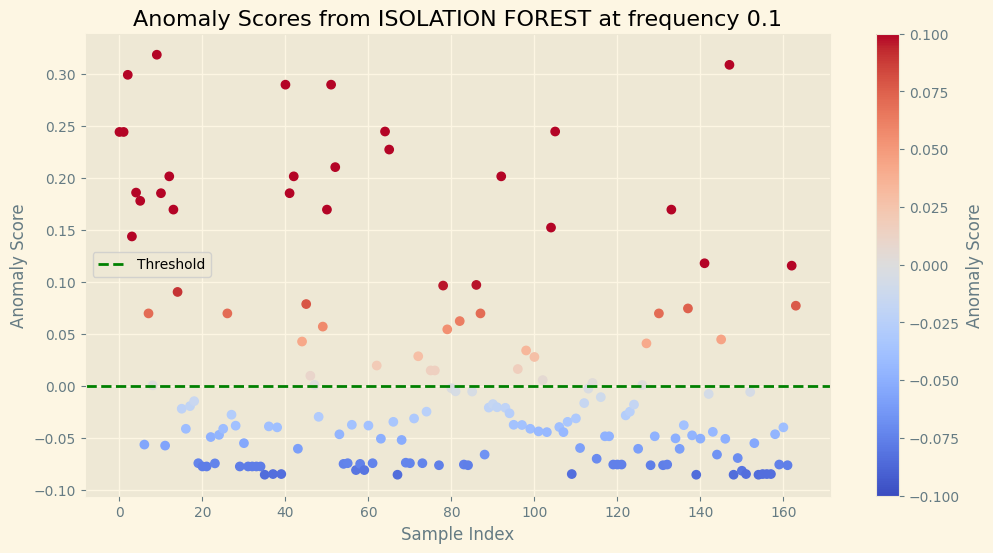

Number of anomalies detected: 54
Threshold: 0.0000
ROC AUC Score: 0.9385
F1 Score: 0.7191
Accuracy: 0.8476
Precision: 0.5926
Recall: 0.9143
              precision    recall  f1-score   support

           0       0.97      0.83      0.90       129
           1       0.59      0.91      0.72        35

    accuracy                           0.85       164
   macro avg       0.78      0.87      0.81       164
weighted avg       0.89      0.85      0.86       164



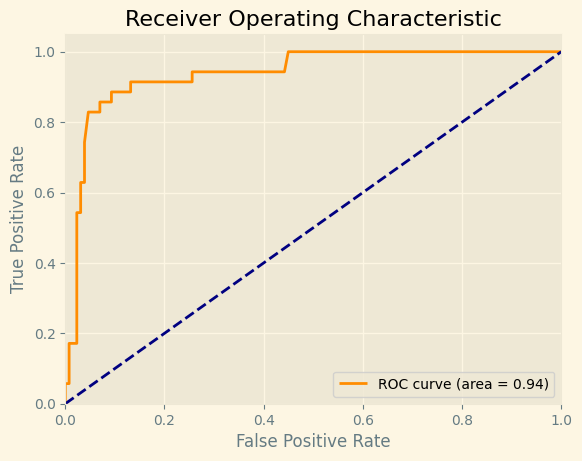

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=5)
58


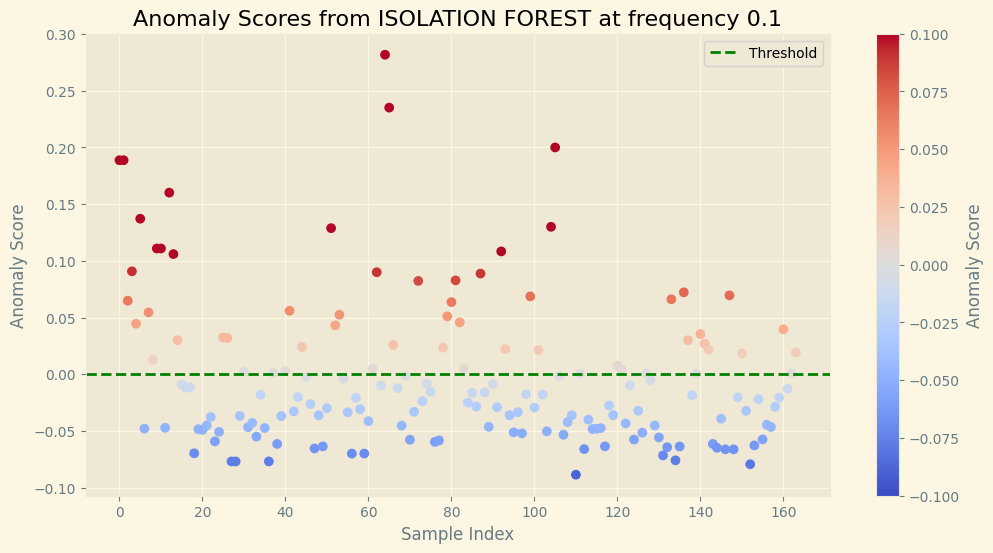

Number of anomalies detected: 58
Threshold: 0.0000
ROC AUC Score: 0.8434
F1 Score: 0.5806
Accuracy: 0.7622
Precision: 0.4655
Recall: 0.7714
              precision    recall  f1-score   support

           0       0.92      0.76      0.83       129
           1       0.47      0.77      0.58        35

    accuracy                           0.76       164
   macro avg       0.70      0.77      0.71       164
weighted avg       0.83      0.76      0.78       164



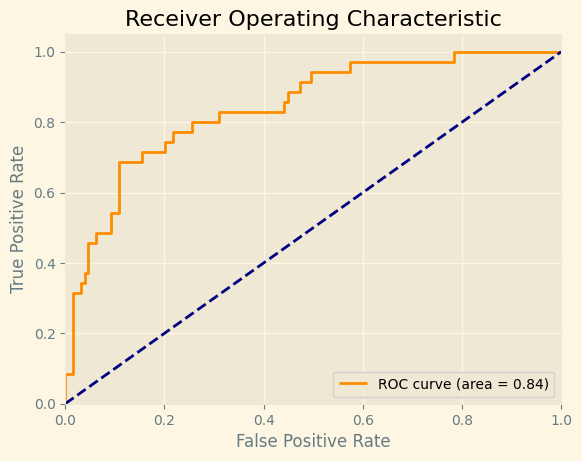

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.4, n_estimators=5)
81
IsolationForest(contamination=0.5, n_estimators=5)
93
IsolationForest(contamination=0.03, n_estimators=5)
3
IsolationForest(contamination=0.0475, n_estimators=5)
21


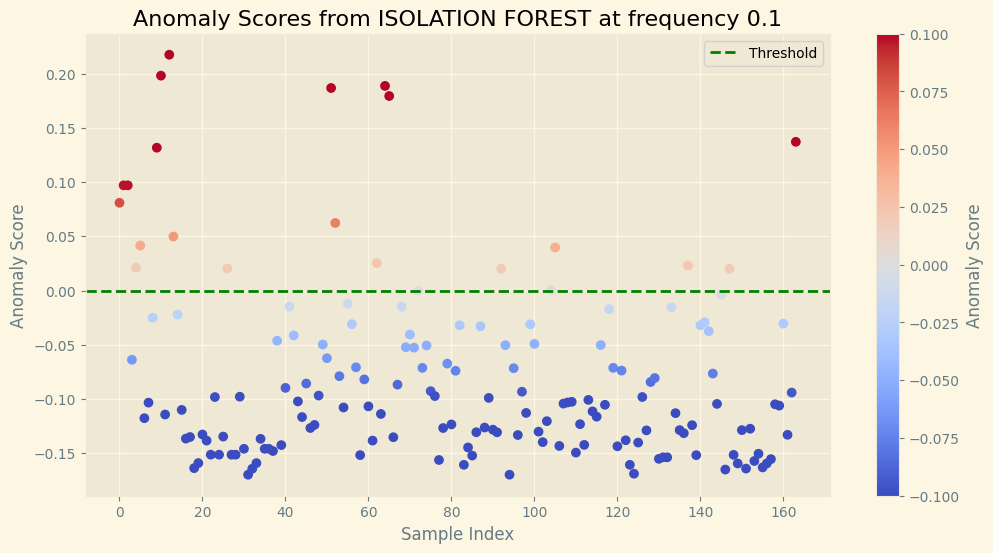

Number of anomalies detected: 21
Threshold: 0.0000
ROC AUC Score: 0.8529
F1 Score: 0.6071
Accuracy: 0.8659
Precision: 0.8095
Recall: 0.4857
              precision    recall  f1-score   support

           0       0.87      0.97      0.92       129
           1       0.81      0.49      0.61        35

    accuracy                           0.87       164
   macro avg       0.84      0.73      0.76       164
weighted avg       0.86      0.87      0.85       164



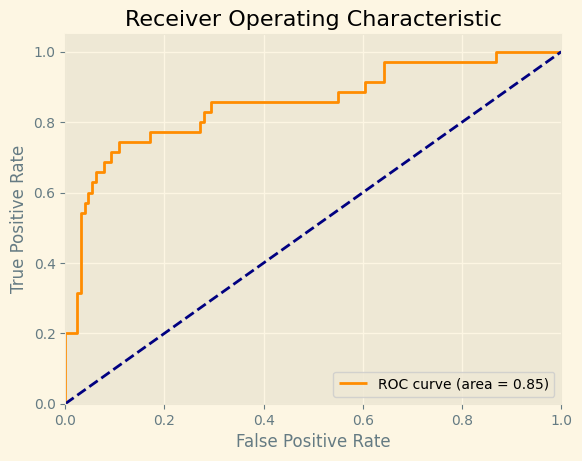

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.065, n_estimators=5)
29


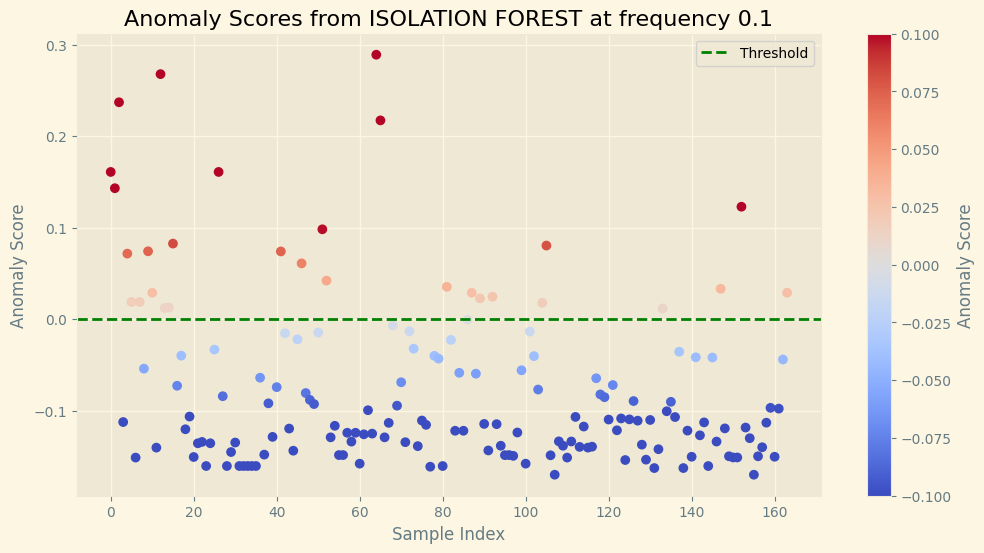

Number of anomalies detected: 29
Threshold: 0.0000
ROC AUC Score: 0.9302
F1 Score: 0.6562
Accuracy: 0.8659
Precision: 0.7241
Recall: 0.6000
              precision    recall  f1-score   support

           0       0.90      0.94      0.92       129
           1       0.72      0.60      0.66        35

    accuracy                           0.87       164
   macro avg       0.81      0.77      0.79       164
weighted avg       0.86      0.87      0.86       164



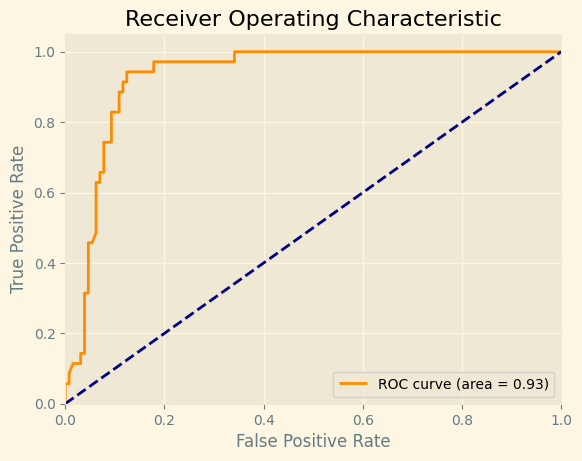

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825, n_estimators=5)
38


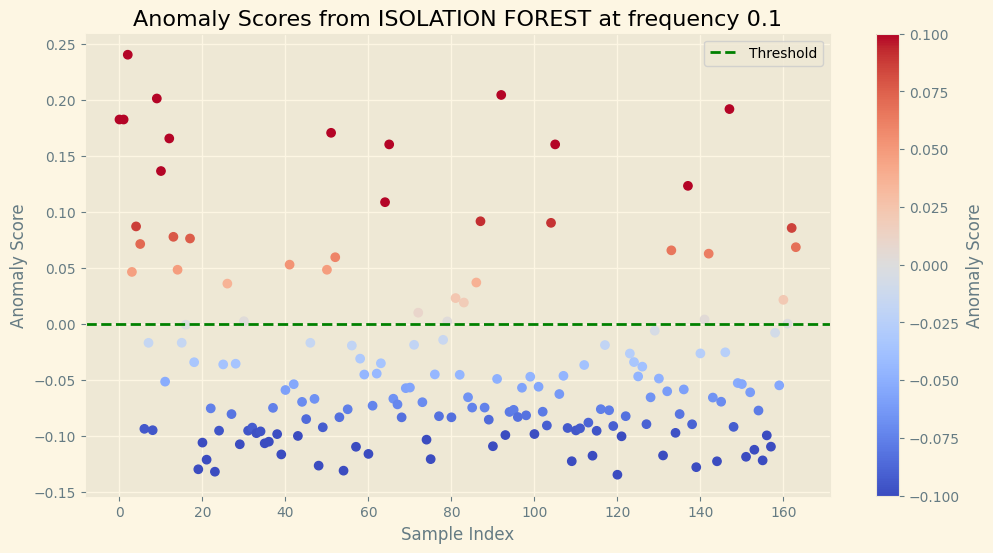

Number of anomalies detected: 38
Threshold: 0.0000
ROC AUC Score: 0.9053
F1 Score: 0.7397
Accuracy: 0.8841
Precision: 0.7105
Recall: 0.7714
              precision    recall  f1-score   support

           0       0.94      0.91      0.93       129
           1       0.71      0.77      0.74        35

    accuracy                           0.88       164
   macro avg       0.82      0.84      0.83       164
weighted avg       0.89      0.88      0.89       164



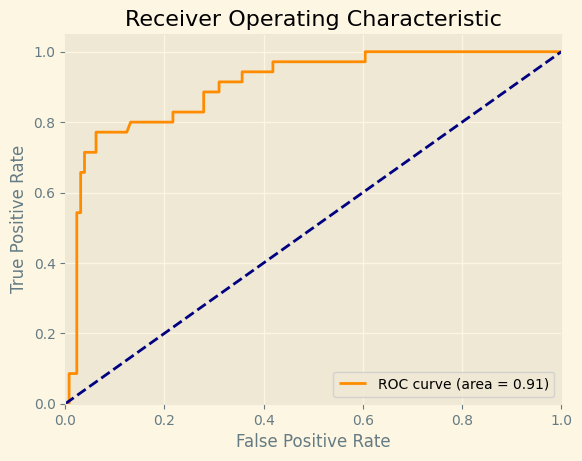

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=5)
33


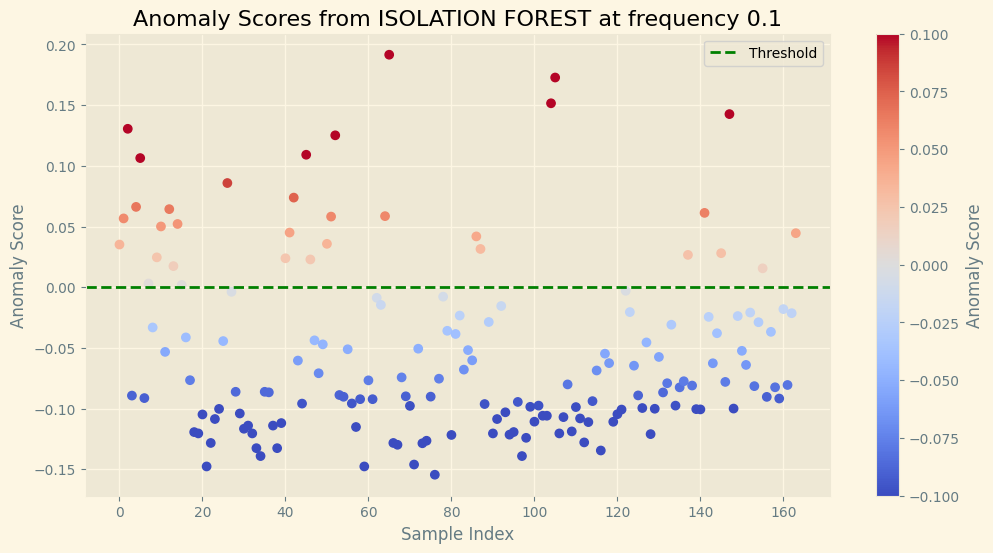

Number of anomalies detected: 33
Threshold: 0.0000
ROC AUC Score: 0.9347
F1 Score: 0.7941
Accuracy: 0.9146
Precision: 0.8182
Recall: 0.7714
              precision    recall  f1-score   support

           0       0.94      0.95      0.95       129
           1       0.82      0.77      0.79        35

    accuracy                           0.91       164
   macro avg       0.88      0.86      0.87       164
weighted avg       0.91      0.91      0.91       164



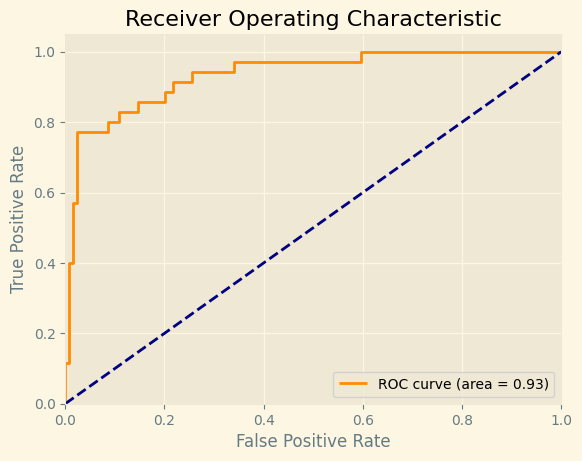

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3431372549019608, n_estimators=10)
74
IsolationForest(contamination=0.005, n_estimators=10)
2
IsolationForest(contamination=0.001, n_estimators=10)
0
IsolationForest(contamination=0.001, n_estimators=10)
0
IsolationForest(contamination=0.03, n_estimators=10)
4
IsolationForest(contamination=0.05, n_estimators=10)
9
IsolationForest(contamination=0.1, n_estimators=10)
37


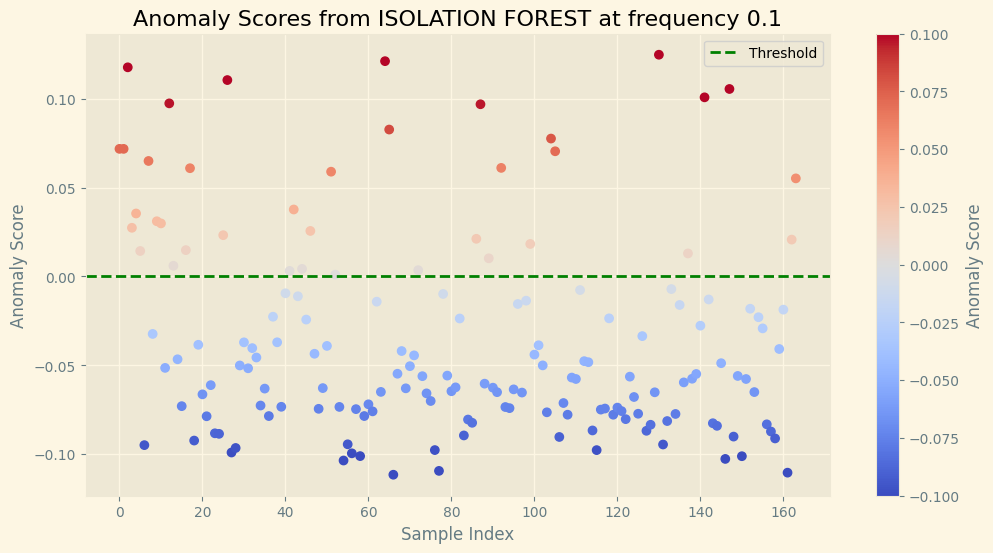

Number of anomalies detected: 37
Threshold: 0.0000
ROC AUC Score: 0.9435
F1 Score: 0.8056
Accuracy: 0.9146
Precision: 0.7838
Recall: 0.8286
              precision    recall  f1-score   support

           0       0.95      0.94      0.95       129
           1       0.78      0.83      0.81        35

    accuracy                           0.91       164
   macro avg       0.87      0.88      0.88       164
weighted avg       0.92      0.91      0.92       164



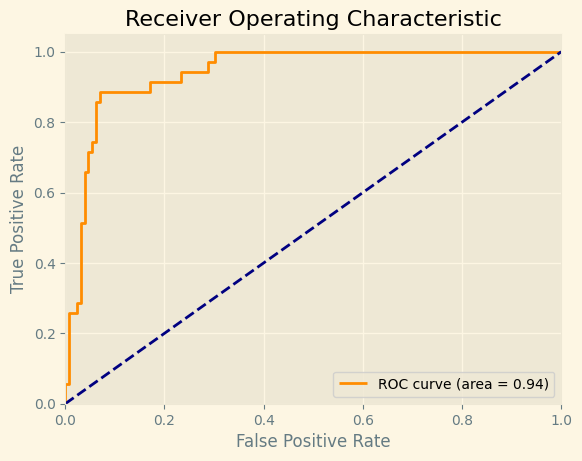

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2, n_estimators=10)
45


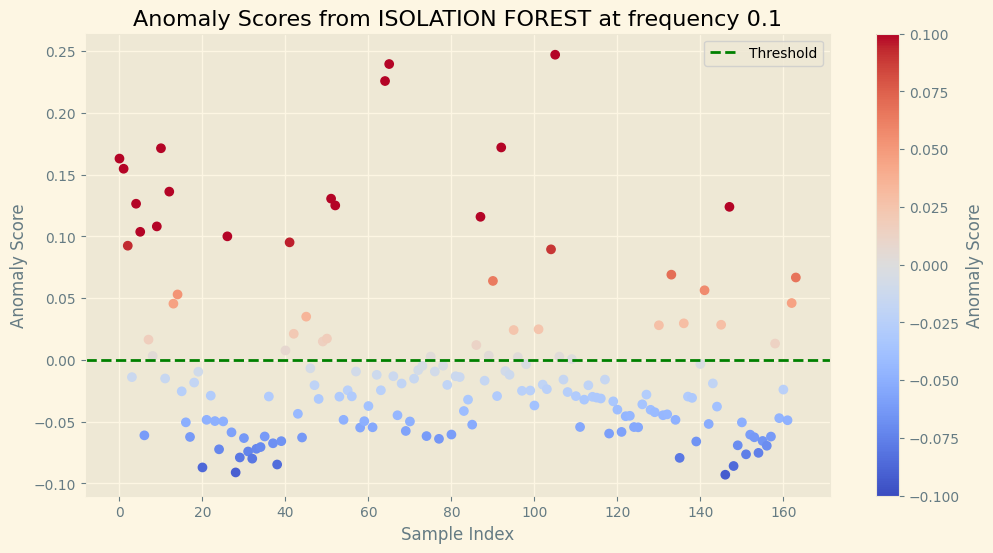

Number of anomalies detected: 45
Threshold: 0.0000
ROC AUC Score: 0.9061
F1 Score: 0.7250
Accuracy: 0.8659
Precision: 0.6444
Recall: 0.8286
              precision    recall  f1-score   support

           0       0.95      0.88      0.91       129
           1       0.64      0.83      0.72        35

    accuracy                           0.87       164
   macro avg       0.80      0.85      0.82       164
weighted avg       0.88      0.87      0.87       164



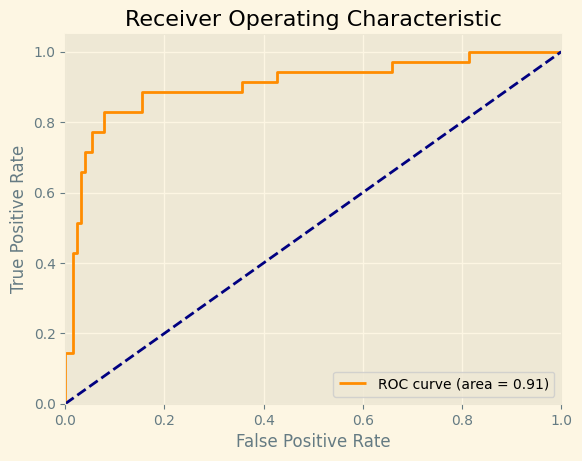

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=10)
64
IsolationForest(contamination=0.4, n_estimators=10)
67
IsolationForest(contamination=0.5, n_estimators=10)
99
IsolationForest(contamination=0.03, n_estimators=10)
4
IsolationForest(contamination=0.0475, n_estimators=10)
20
IsolationForest(contamination=0.065, n_estimators=10)
25


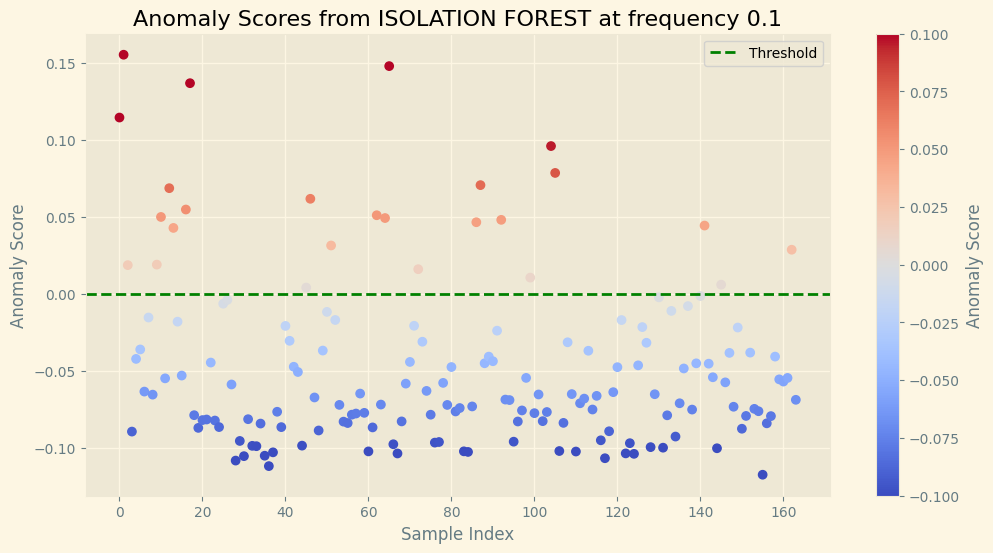

Number of anomalies detected: 25
Threshold: 0.0000
ROC AUC Score: 0.9393
F1 Score: 0.6667
Accuracy: 0.8780
Precision: 0.8000
Recall: 0.5714
              precision    recall  f1-score   support

           0       0.89      0.96      0.93       129
           1       0.80      0.57      0.67        35

    accuracy                           0.88       164
   macro avg       0.85      0.77      0.80       164
weighted avg       0.87      0.88      0.87       164



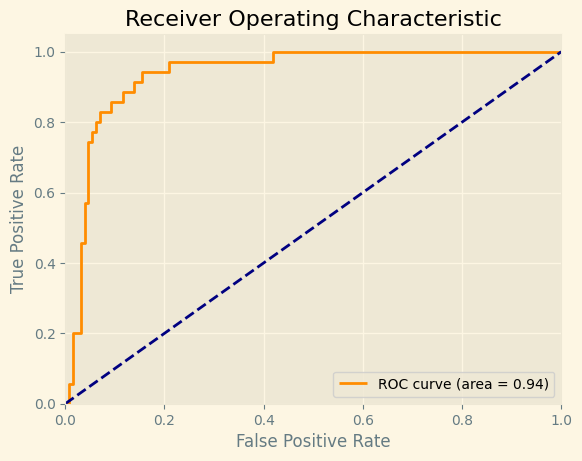

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825, n_estimators=10)
31


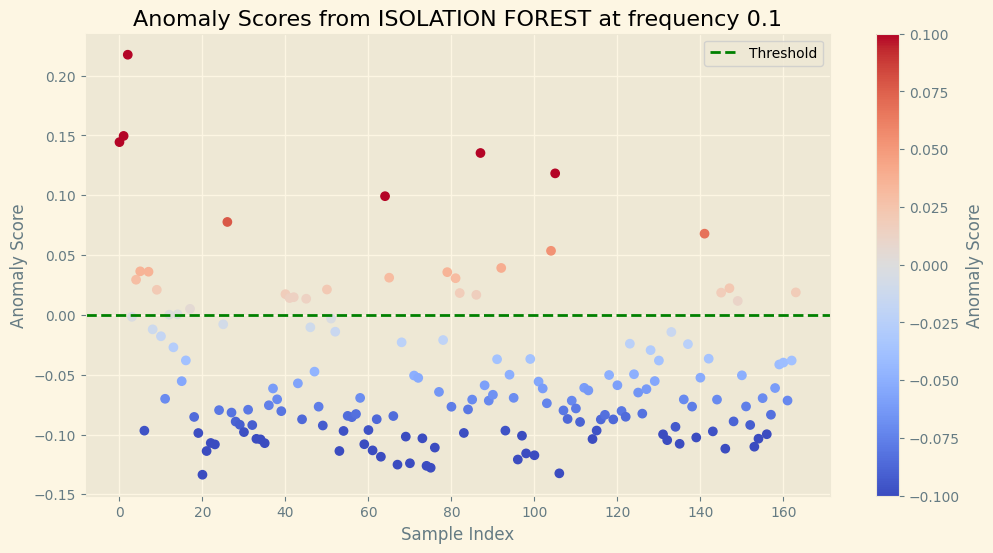

Number of anomalies detected: 31
Threshold: 0.0000
ROC AUC Score: 0.9375
F1 Score: 0.6970
Accuracy: 0.8780
Precision: 0.7419
Recall: 0.6571
              precision    recall  f1-score   support

           0       0.91      0.94      0.92       129
           1       0.74      0.66      0.70        35

    accuracy                           0.88       164
   macro avg       0.83      0.80      0.81       164
weighted avg       0.87      0.88      0.88       164



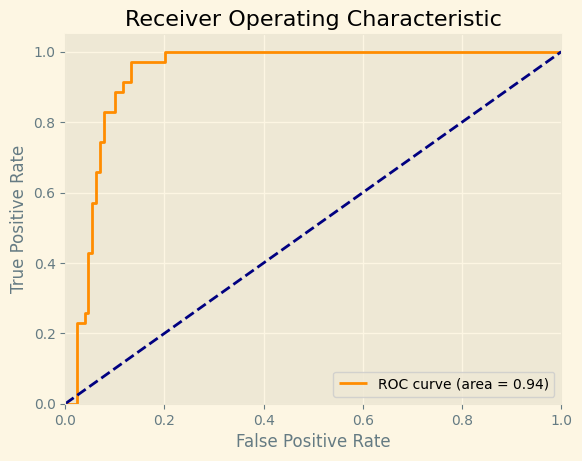

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=10)
29


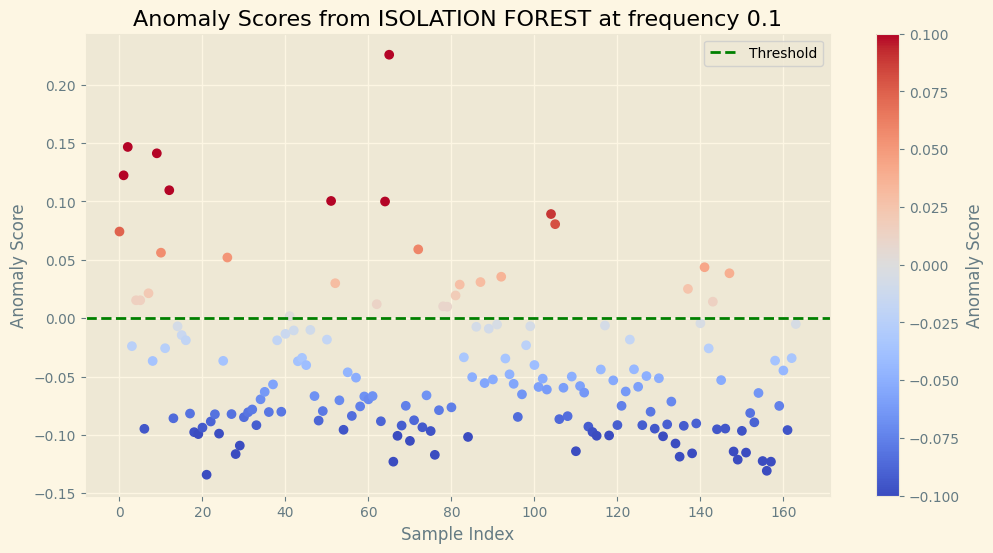

Number of anomalies detected: 29
Threshold: 0.0000
ROC AUC Score: 0.8802
F1 Score: 0.5938
Accuracy: 0.8415
Precision: 0.6552
Recall: 0.5429
              precision    recall  f1-score   support

           0       0.88      0.92      0.90       129
           1       0.66      0.54      0.59        35

    accuracy                           0.84       164
   macro avg       0.77      0.73      0.75       164
weighted avg       0.83      0.84      0.84       164



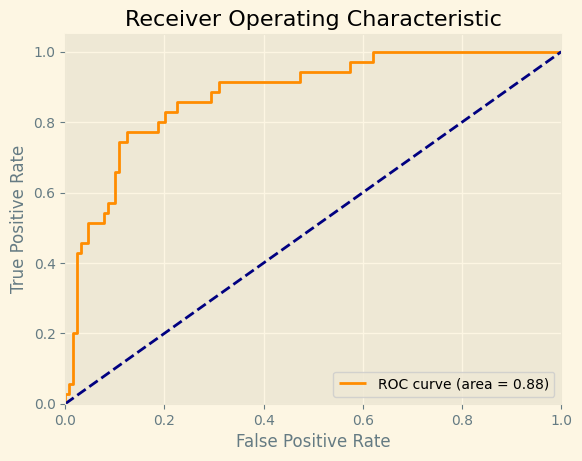

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3431372549019608)
71
IsolationForest(contamination=0.005)
0
IsolationForest(contamination=0.001)
0
IsolationForest(contamination=0.001)
0
IsolationForest(contamination=0.03)
6
IsolationForest(contamination=0.05)
25


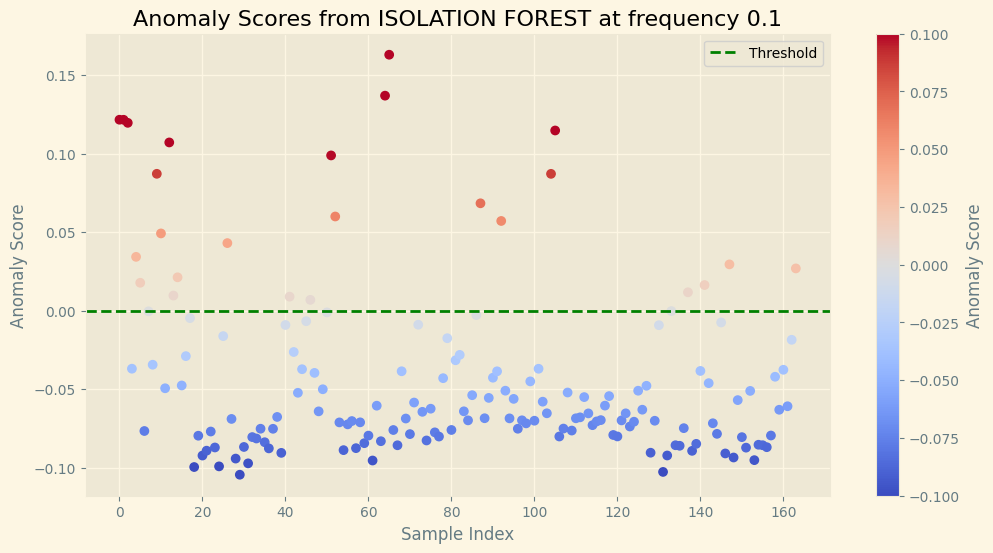

Number of anomalies detected: 25
Threshold: 0.0000
ROC AUC Score: 0.9714
F1 Score: 0.7333
Accuracy: 0.9024
Precision: 0.8800
Recall: 0.6286
              precision    recall  f1-score   support

           0       0.91      0.98      0.94       129
           1       0.88      0.63      0.73        35

    accuracy                           0.90       164
   macro avg       0.89      0.80      0.84       164
weighted avg       0.90      0.90      0.90       164



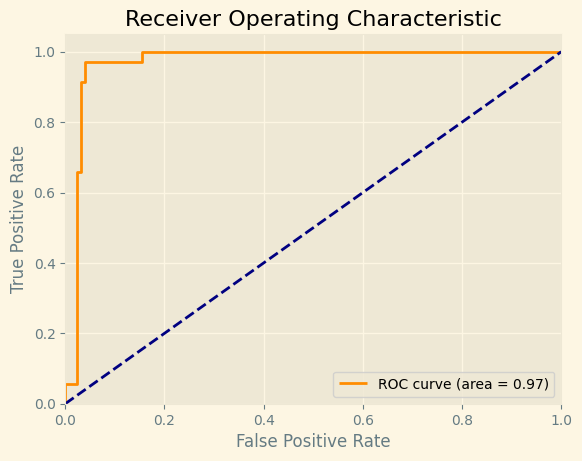

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1)
41


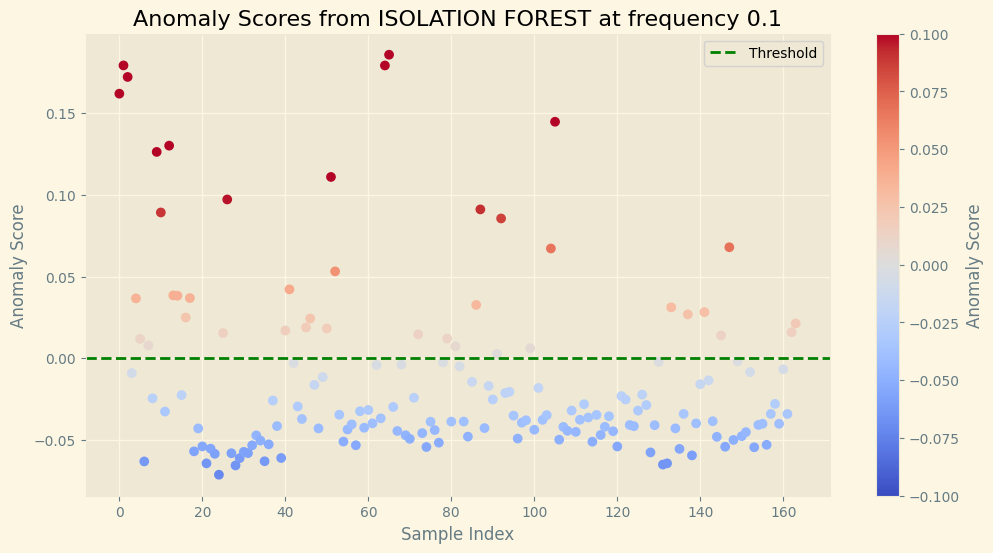

Number of anomalies detected: 41
Threshold: 0.0000
ROC AUC Score: 0.9717
F1 Score: 0.8684
Accuracy: 0.9390
Precision: 0.8049
Recall: 0.9429
              precision    recall  f1-score   support

           0       0.98      0.94      0.96       129
           1       0.80      0.94      0.87        35

    accuracy                           0.94       164
   macro avg       0.89      0.94      0.91       164
weighted avg       0.95      0.94      0.94       164



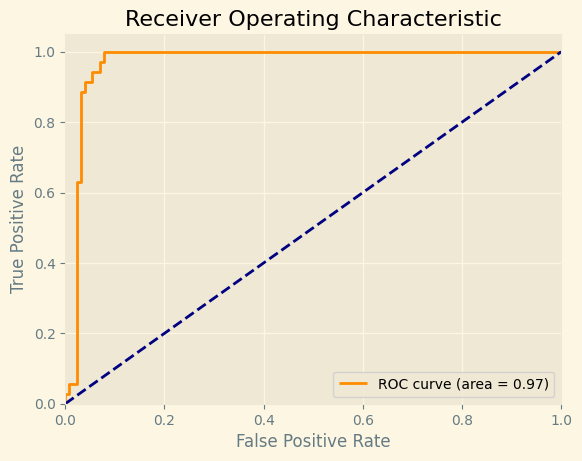

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2)
56


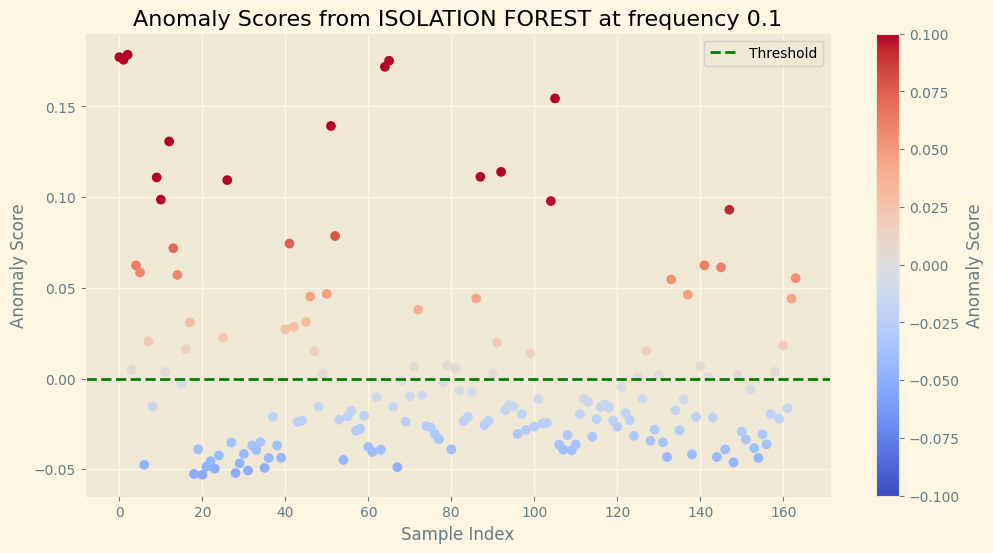

Number of anomalies detected: 56
Threshold: 0.0000
ROC AUC Score: 0.9721
F1 Score: 0.7692
Accuracy: 0.8720
Precision: 0.6250
Recall: 1.0000
              precision    recall  f1-score   support

           0       1.00      0.84      0.91       129
           1       0.62      1.00      0.77        35

    accuracy                           0.87       164
   macro avg       0.81      0.92      0.84       164
weighted avg       0.92      0.87      0.88       164



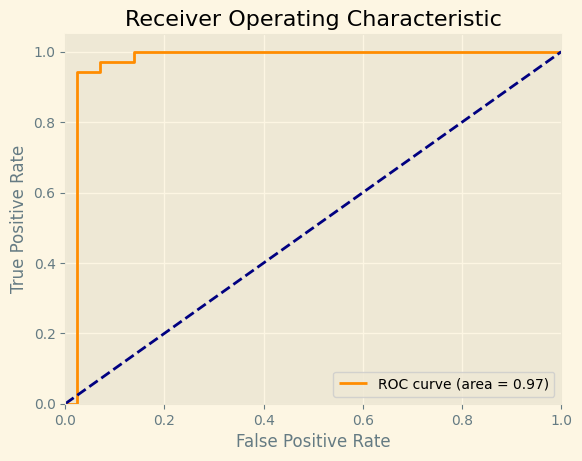

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3)
67
IsolationForest(contamination=0.4)
68
IsolationForest(contamination=0.5)
85
IsolationForest(contamination=0.03)
7
IsolationForest(contamination=0.0475)
23


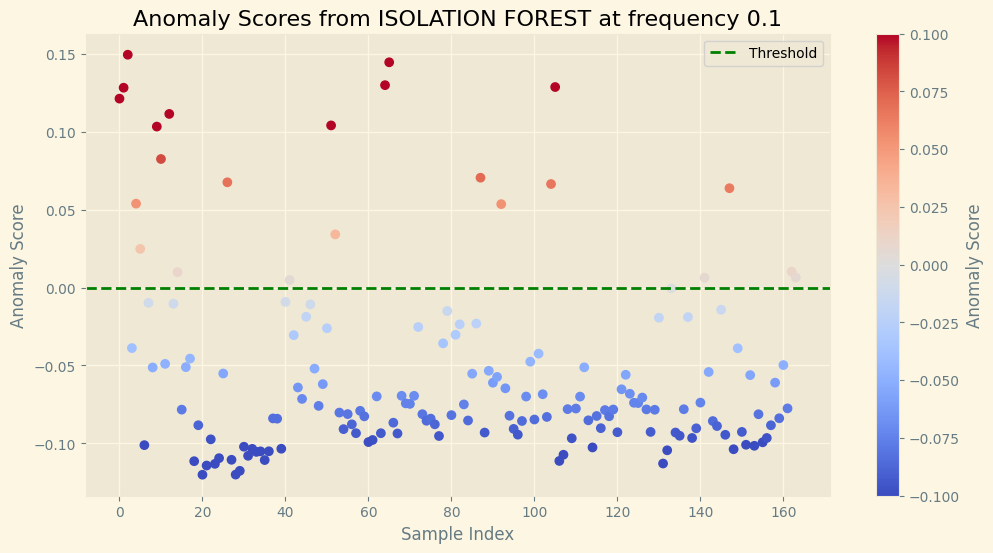

Number of anomalies detected: 23
Threshold: 0.0000
ROC AUC Score: 0.9663
F1 Score: 0.6897
Accuracy: 0.8902
Precision: 0.8696
Recall: 0.5714
              precision    recall  f1-score   support

           0       0.89      0.98      0.93       129
           1       0.87      0.57      0.69        35

    accuracy                           0.89       164
   macro avg       0.88      0.77      0.81       164
weighted avg       0.89      0.89      0.88       164



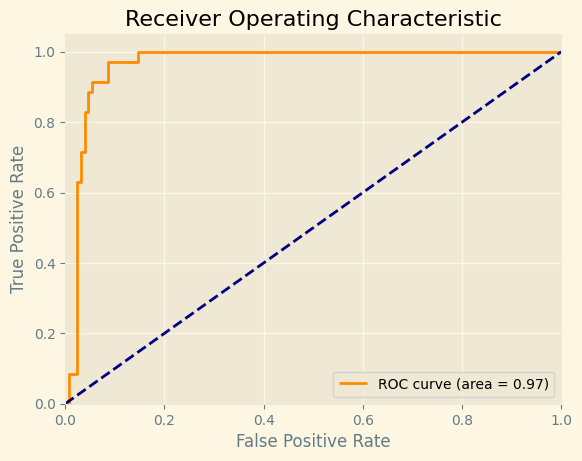

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.065)
30


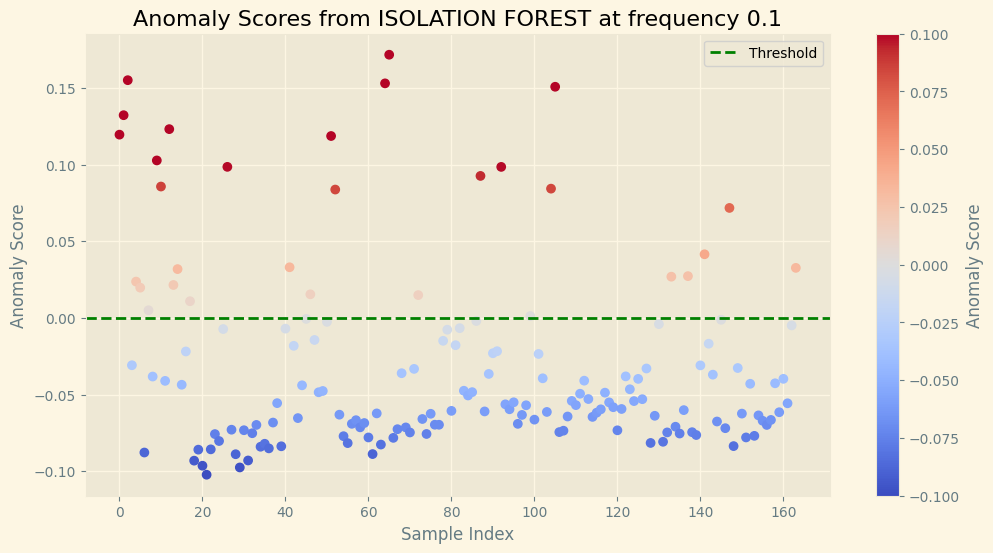

Number of anomalies detected: 30
Threshold: 0.0000
ROC AUC Score: 0.9745
F1 Score: 0.8000
Accuracy: 0.9207
Precision: 0.8667
Recall: 0.7429
              precision    recall  f1-score   support

           0       0.93      0.97      0.95       129
           1       0.87      0.74      0.80        35

    accuracy                           0.92       164
   macro avg       0.90      0.86      0.88       164
weighted avg       0.92      0.92      0.92       164



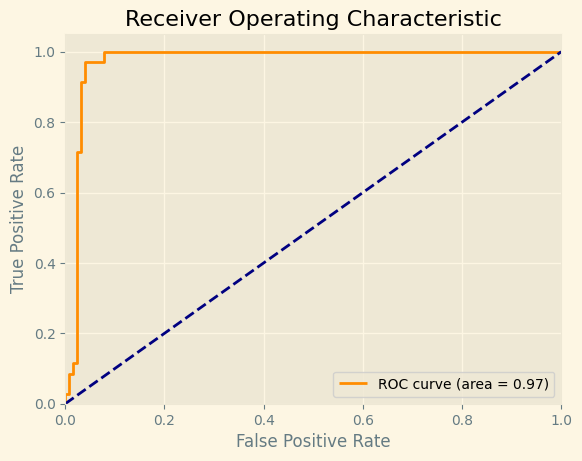

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825)
37


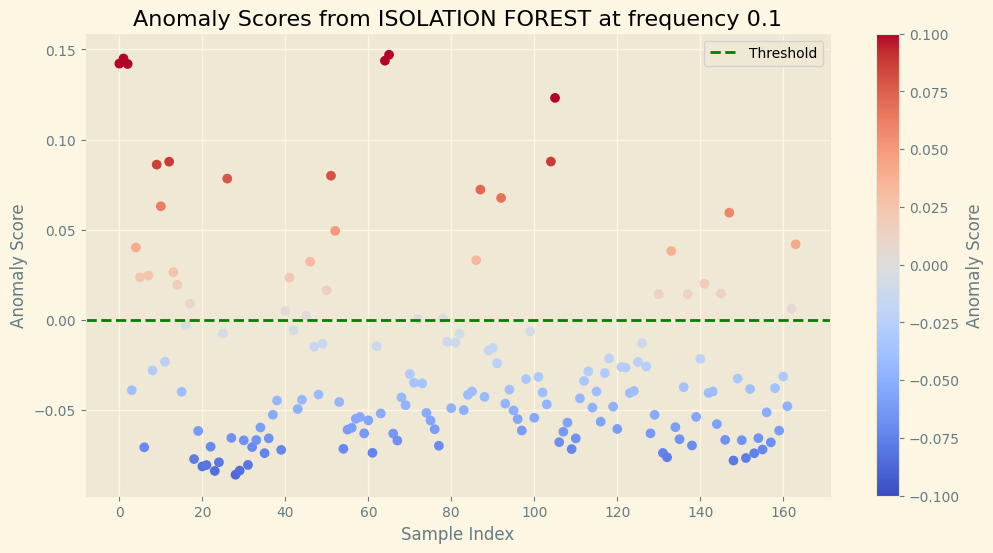

Number of anomalies detected: 37
Threshold: 0.0000
ROC AUC Score: 0.9728
F1 Score: 0.8889
Accuracy: 0.9512
Precision: 0.8649
Recall: 0.9143
              precision    recall  f1-score   support

           0       0.98      0.96      0.97       129
           1       0.86      0.91      0.89        35

    accuracy                           0.95       164
   macro avg       0.92      0.94      0.93       164
weighted avg       0.95      0.95      0.95       164



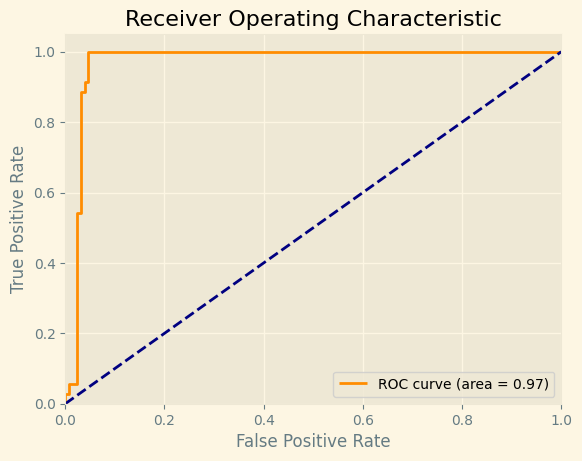

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1)
40


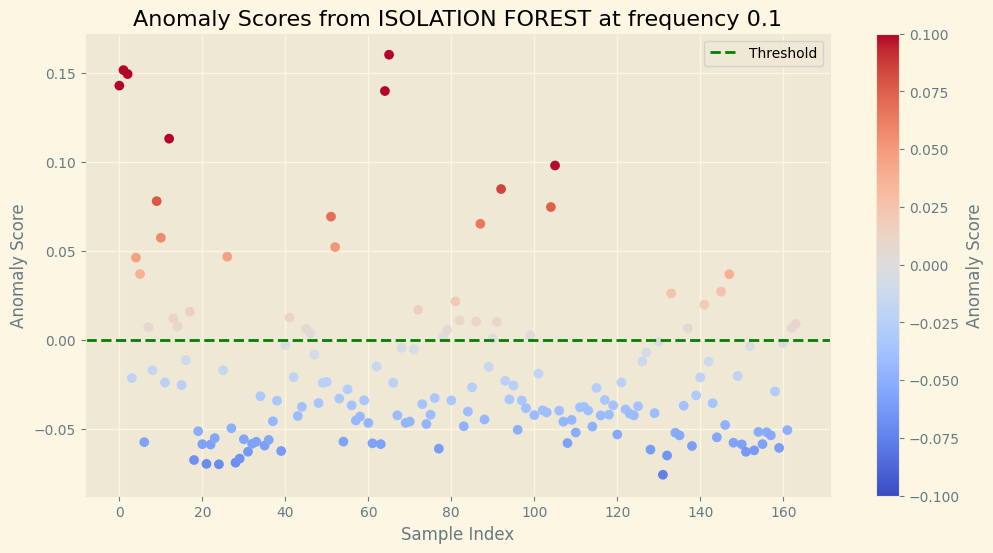

Number of anomalies detected: 40
Threshold: 0.0000
ROC AUC Score: 0.9522
F1 Score: 0.8000
Accuracy: 0.9085
Precision: 0.7500
Recall: 0.8571
              precision    recall  f1-score   support

           0       0.96      0.92      0.94       129
           1       0.75      0.86      0.80        35

    accuracy                           0.91       164
   macro avg       0.85      0.89      0.87       164
weighted avg       0.91      0.91      0.91       164



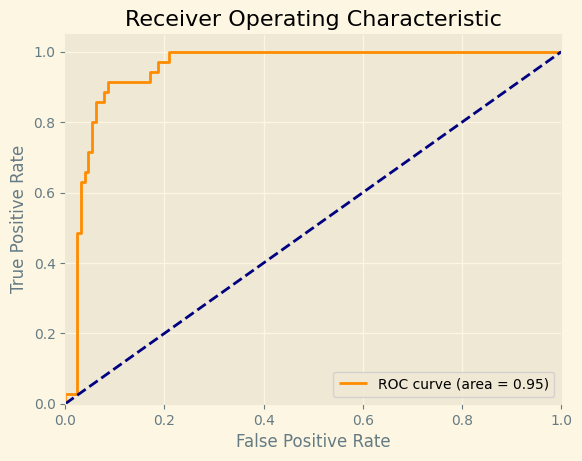

########################## ---------------------------------------- ##########################


In [23]:
threshold = 0 # threshold 0 for decision_function method
for idx, anomaly_scores in enumerate(anomaly_scores_s_1):
    print(f"{clf_s[idx][0]}")
    anomaly_scores = -anomaly_scores    #This is done as scores from decision function that are lower than 0 are considered abnomalies (see literature)

    anomalies_detected = np.sum(anomaly_scores > 0)    
    print(f"{anomalies_detected}")
    if (anomalies_detected > 20 and anomalies_detected < 60):
        _ = plot_anomalies(anomaly_scores, freq, threshold, "ISOLATION FOREST")
        compute_metrics(anomaly_scores, y_test_collision_1, threshold)
        plot_roc_curve(y_test_collision_1.values, anomaly_scores)
        print("########################## ---------------------------------------- ##########################")
    # plot_anomalies_over_time(X_test, anomaly_scores, anomalies_detected, freq, threshold, collision_zones, X_test_start_end)

### Classifying collisions_5

IsolationForest(contamination=0.3431372549019608, n_estimators=1)
88
IsolationForest(contamination=0.005, n_estimators=1)
0
IsolationForest(contamination=0.001, n_estimators=1)
0
IsolationForest(contamination=0.001, n_estimators=1)
0
IsolationForest(contamination=0.03, n_estimators=1)
2
IsolationForest(contamination=0.05, n_estimators=1)
13
IsolationForest(contamination=0.1, n_estimators=1)
11
IsolationForest(contamination=0.2, n_estimators=1)
60


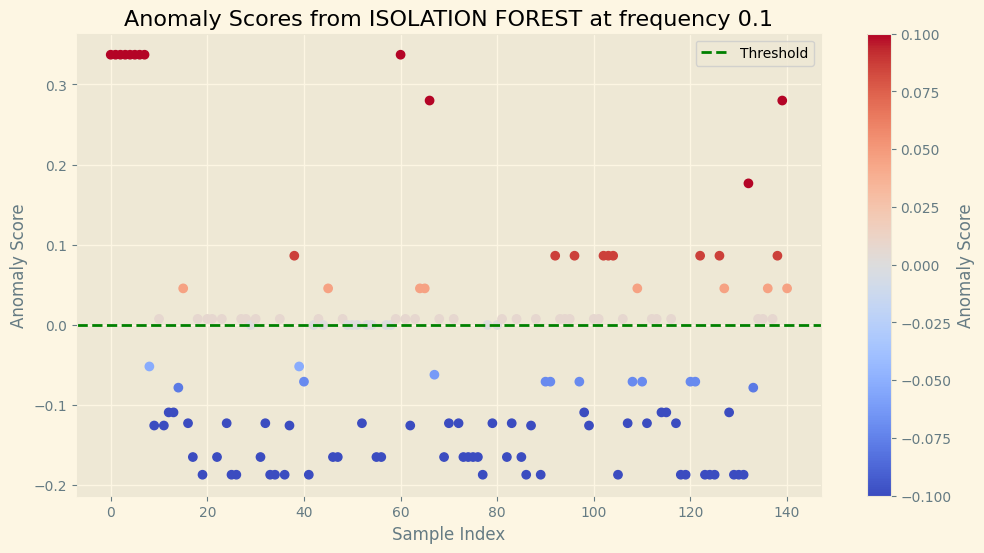

Number of anomalies detected: 60
Threshold: 0.0000
ROC AUC Score: 0.6695
F1 Score: 0.5862
Accuracy: 0.6596
Precision: 0.5667
Recall: 0.6071
              precision    recall  f1-score   support

           0       0.73      0.69      0.71        85
           1       0.57      0.61      0.59        56

    accuracy                           0.66       141
   macro avg       0.65      0.65      0.65       141
weighted avg       0.66      0.66      0.66       141



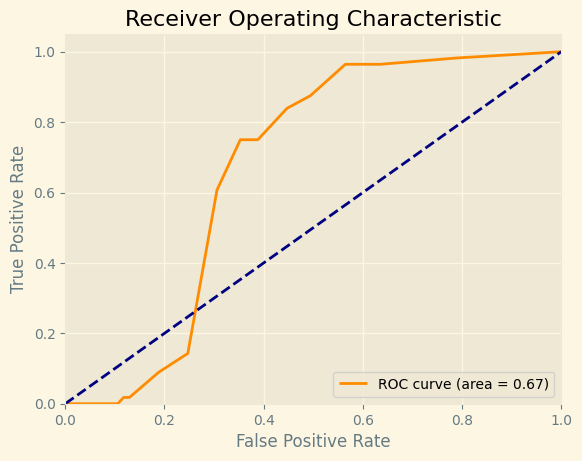

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=1)
22
IsolationForest(contamination=0.4, n_estimators=1)
80
IsolationForest(contamination=0.5, n_estimators=1)
100
IsolationForest(contamination=0.03, n_estimators=1)
2
IsolationForest(contamination=0.0475, n_estimators=1)
0
IsolationForest(contamination=0.065, n_estimators=1)
8
IsolationForest(contamination=0.0825, n_estimators=1)
70


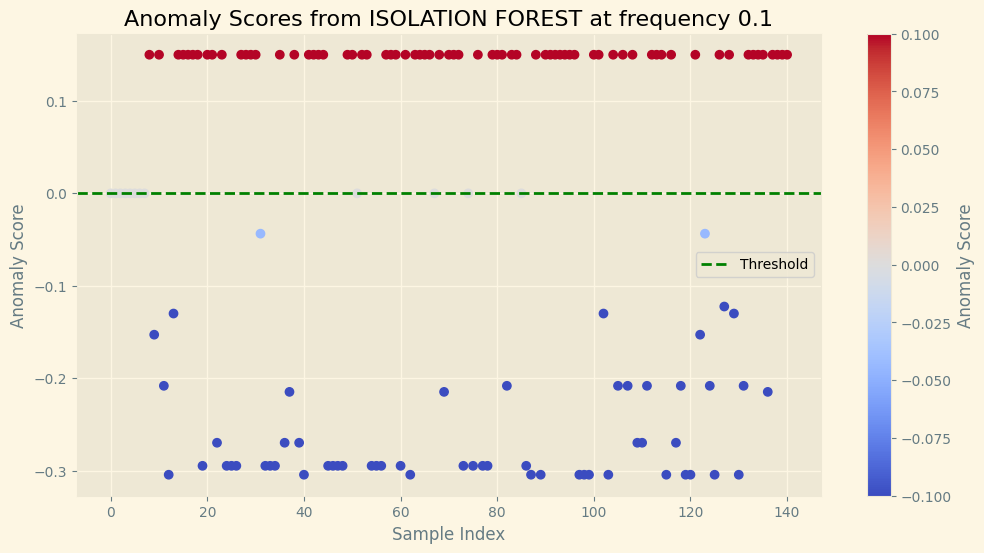

Number of anomalies detected: 70
Threshold: 0.0000
ROC AUC Score: 0.9068
F1 Score: 0.8730
Accuracy: 0.8865
Precision: 0.7857
Recall: 0.9821
              precision    recall  f1-score   support

           0       0.99      0.82      0.90        85
           1       0.79      0.98      0.87        56

    accuracy                           0.89       141
   macro avg       0.89      0.90      0.89       141
weighted avg       0.91      0.89      0.89       141



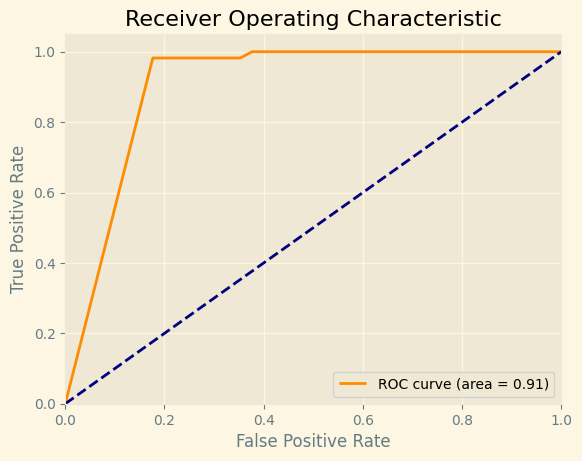

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=1)
40
IsolationForest(contamination=0.3431372549019608, n_estimators=2)
63


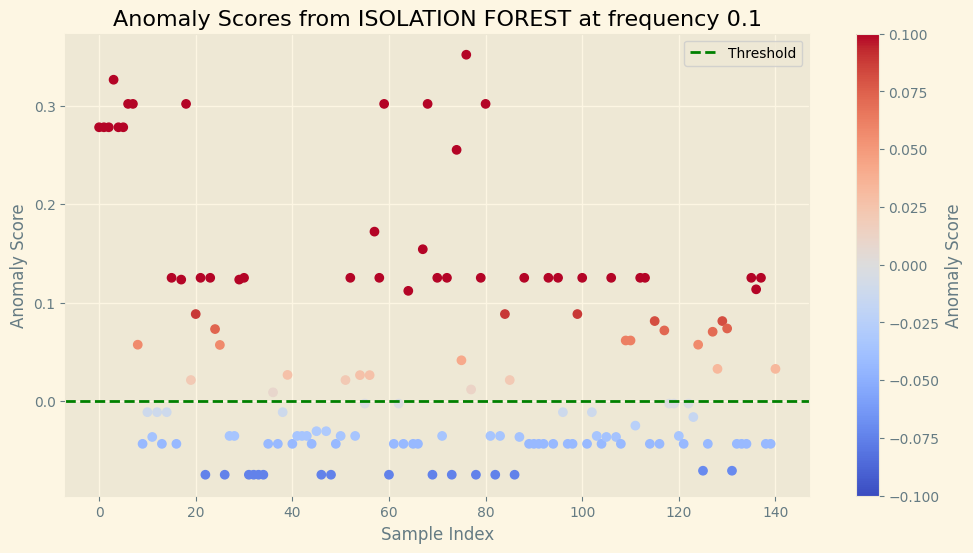

Number of anomalies detected: 63
Threshold: 0.0000
ROC AUC Score: 0.5497
F1 Score: 0.4034
Accuracy: 0.4965
Precision: 0.3810
Recall: 0.4286
              precision    recall  f1-score   support

           0       0.59      0.54      0.56        85
           1       0.38      0.43      0.40        56

    accuracy                           0.50       141
   macro avg       0.49      0.48      0.48       141
weighted avg       0.51      0.50      0.50       141



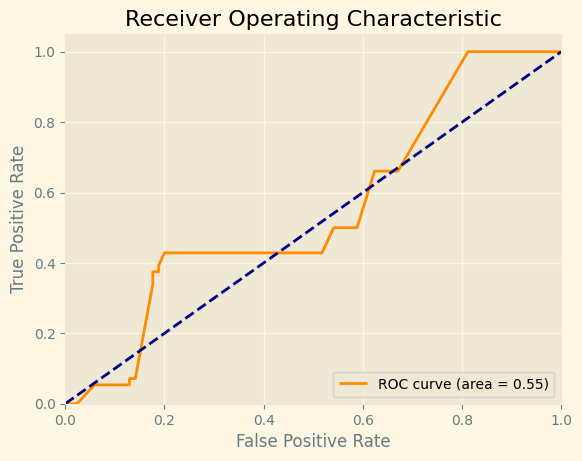

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.005, n_estimators=2)
0
IsolationForest(contamination=0.001, n_estimators=2)
0
IsolationForest(contamination=0.001, n_estimators=2)
0
IsolationForest(contamination=0.03, n_estimators=2)
7
IsolationForest(contamination=0.05, n_estimators=2)
16
IsolationForest(contamination=0.1, n_estimators=2)
52


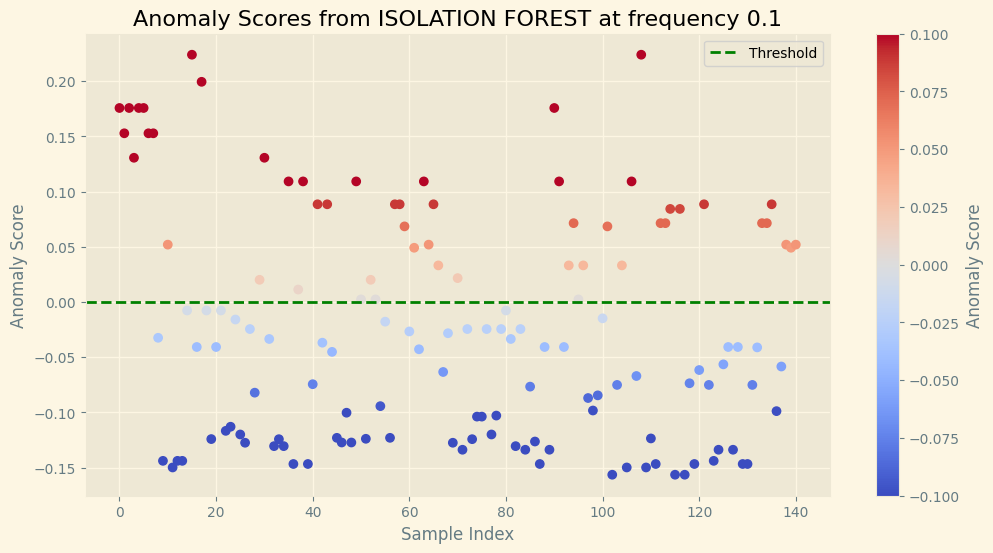

Number of anomalies detected: 52
Threshold: 0.0000
ROC AUC Score: 0.7908
F1 Score: 0.6296
Accuracy: 0.7163
Precision: 0.6538
Recall: 0.6071
              precision    recall  f1-score   support

           0       0.75      0.79      0.77        85
           1       0.65      0.61      0.63        56

    accuracy                           0.72       141
   macro avg       0.70      0.70      0.70       141
weighted avg       0.71      0.72      0.71       141



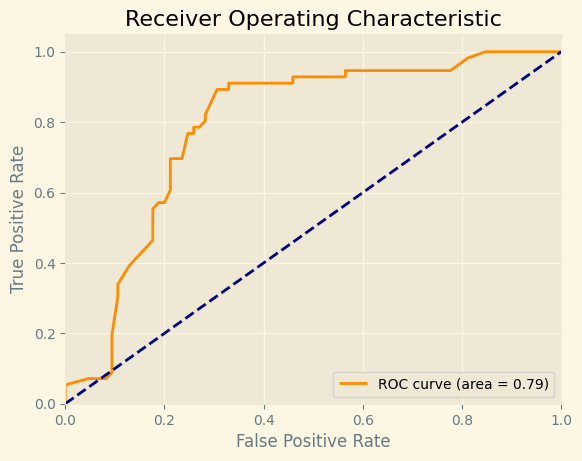

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2, n_estimators=2)
36
IsolationForest(contamination=0.3, n_estimators=2)
69


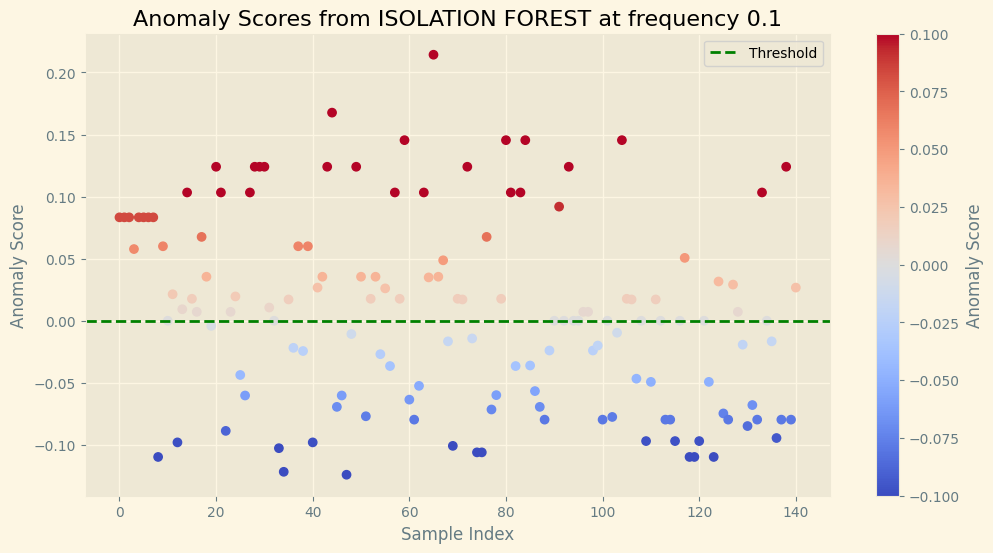

Number of anomalies detected: 69
Threshold: 0.0000
ROC AUC Score: 0.7561
F1 Score: 0.6240
Accuracy: 0.6667
Precision: 0.5652
Recall: 0.6964
              precision    recall  f1-score   support

           0       0.76      0.65      0.70        85
           1       0.57      0.70      0.62        56

    accuracy                           0.67       141
   macro avg       0.66      0.67      0.66       141
weighted avg       0.68      0.67      0.67       141



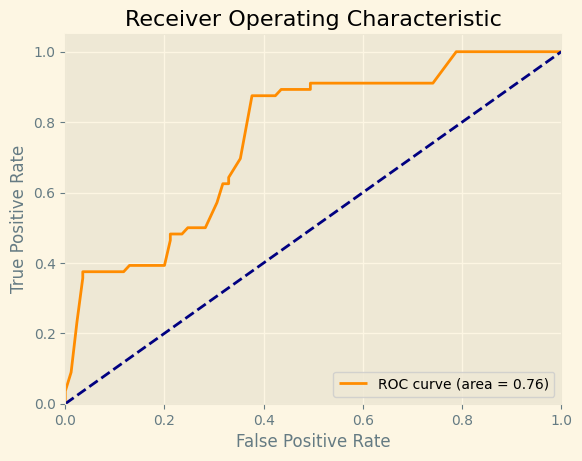

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.4, n_estimators=2)
98
IsolationForest(contamination=0.5, n_estimators=2)
79


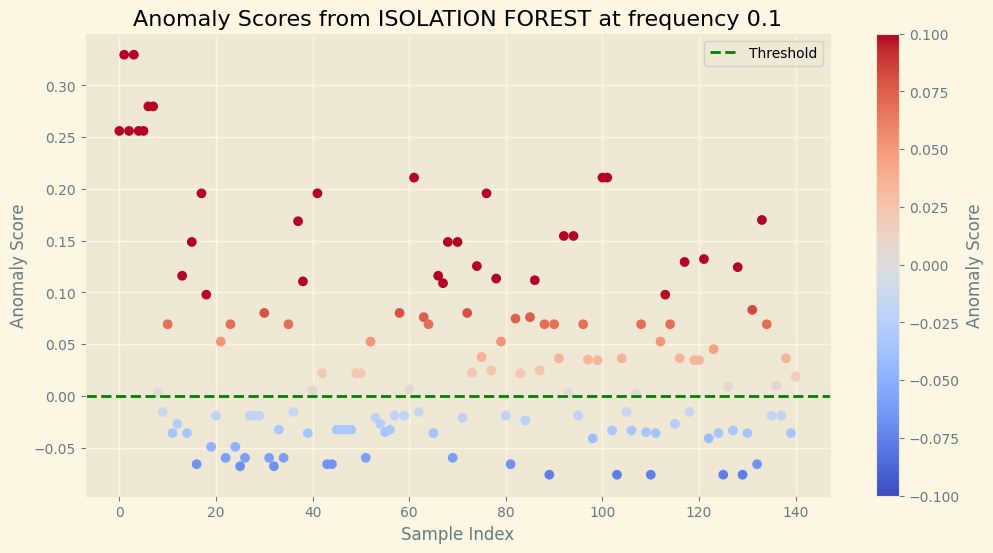

Number of anomalies detected: 79
Threshold: 0.0000
ROC AUC Score: 0.6465
F1 Score: 0.5778
Accuracy: 0.5957
Precision: 0.4937
Recall: 0.6964
              precision    recall  f1-score   support

           0       0.73      0.53      0.61        85
           1       0.49      0.70      0.58        56

    accuracy                           0.60       141
   macro avg       0.61      0.61      0.60       141
weighted avg       0.63      0.60      0.60       141



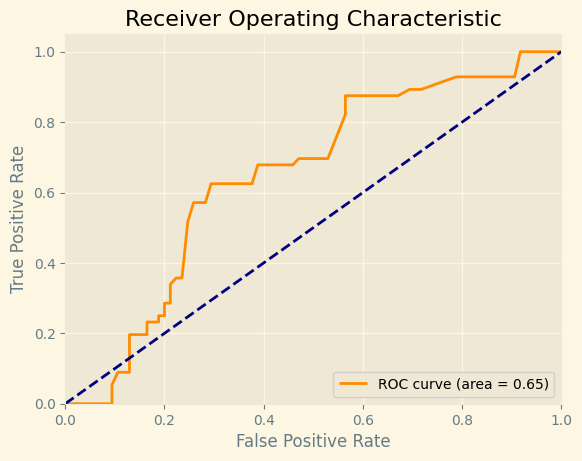

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.03, n_estimators=2)
27
IsolationForest(contamination=0.0475, n_estimators=2)
4
IsolationForest(contamination=0.065, n_estimators=2)
18
IsolationForest(contamination=0.0825, n_estimators=2)
67


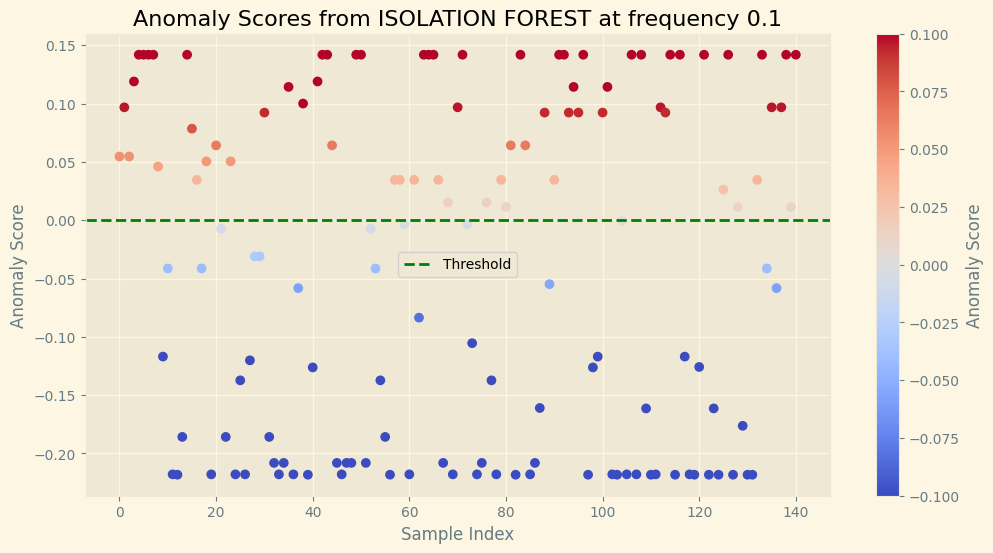

Number of anomalies detected: 67
Threshold: 0.0000
ROC AUC Score: 0.8460
F1 Score: 0.7480
Accuracy: 0.7801
Precision: 0.6866
Recall: 0.8214
              precision    recall  f1-score   support

           0       0.86      0.75      0.81        85
           1       0.69      0.82      0.75        56

    accuracy                           0.78       141
   macro avg       0.78      0.79      0.78       141
weighted avg       0.79      0.78      0.78       141



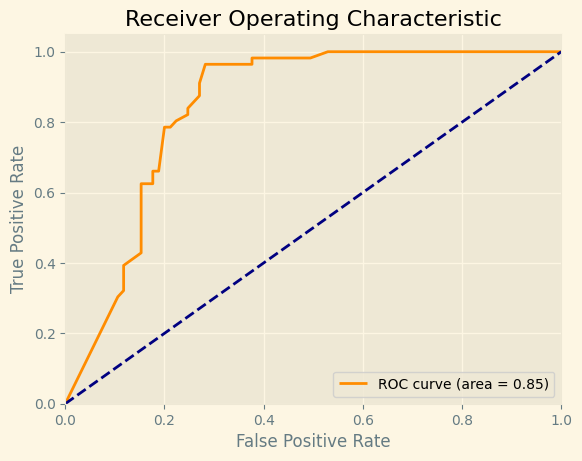

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=2)
40
IsolationForest(contamination=0.3431372549019608, n_estimators=3)
89
IsolationForest(contamination=0.005, n_estimators=3)
51


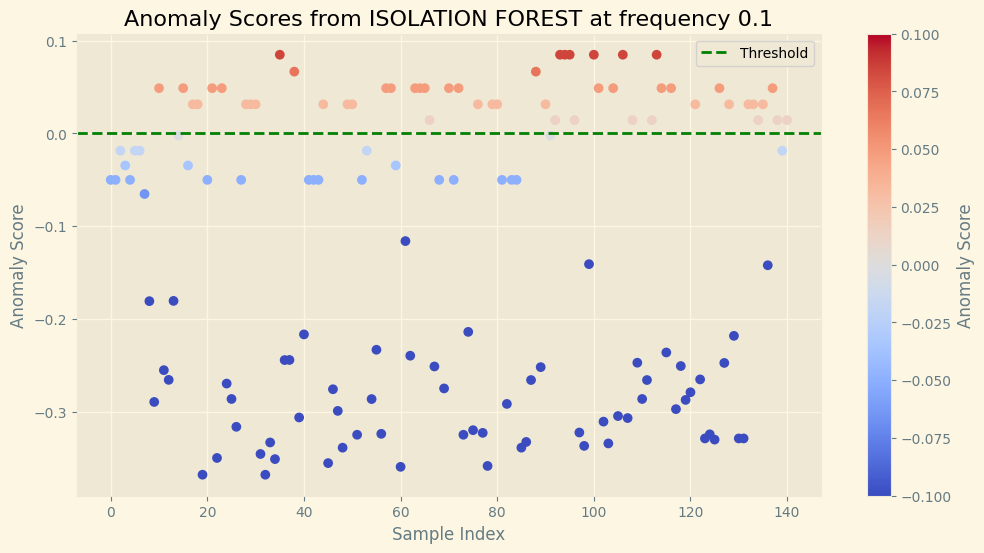

Number of anomalies detected: 51
Threshold: 0.0000
ROC AUC Score: 0.9150
F1 Score: 0.7477
Accuracy: 0.8085
Precision: 0.7843
Recall: 0.7143
              precision    recall  f1-score   support

           0       0.82      0.87      0.85        85
           1       0.78      0.71      0.75        56

    accuracy                           0.81       141
   macro avg       0.80      0.79      0.80       141
weighted avg       0.81      0.81      0.81       141



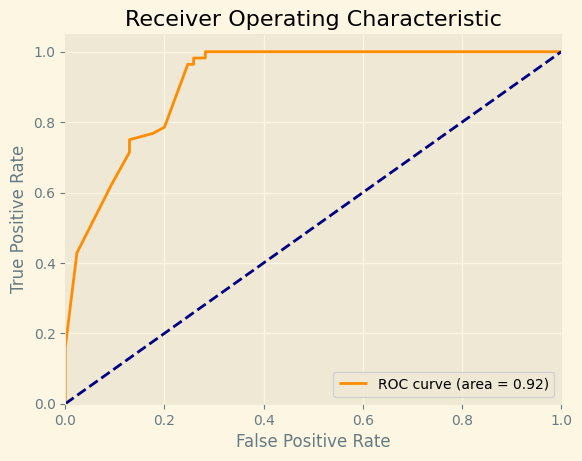

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.001, n_estimators=3)
0
IsolationForest(contamination=0.001, n_estimators=3)
0
IsolationForest(contamination=0.03, n_estimators=3)
1
IsolationForest(contamination=0.05, n_estimators=3)
63


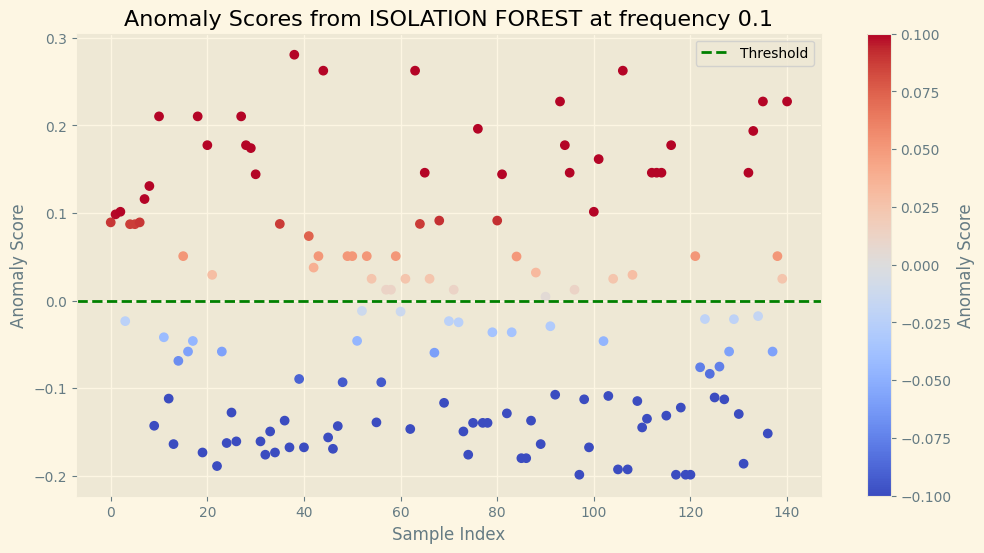

Number of anomalies detected: 63
Threshold: 0.0000
ROC AUC Score: 0.8422
F1 Score: 0.7563
Accuracy: 0.7943
Precision: 0.7143
Recall: 0.8036
              precision    recall  f1-score   support

           0       0.86      0.79      0.82        85
           1       0.71      0.80      0.76        56

    accuracy                           0.79       141
   macro avg       0.79      0.80      0.79       141
weighted avg       0.80      0.79      0.80       141



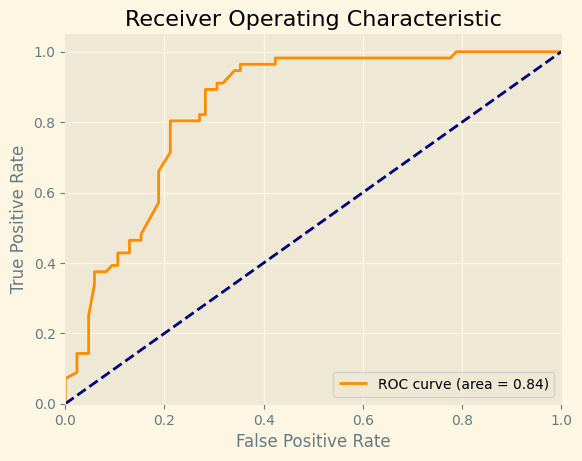

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=3)
71


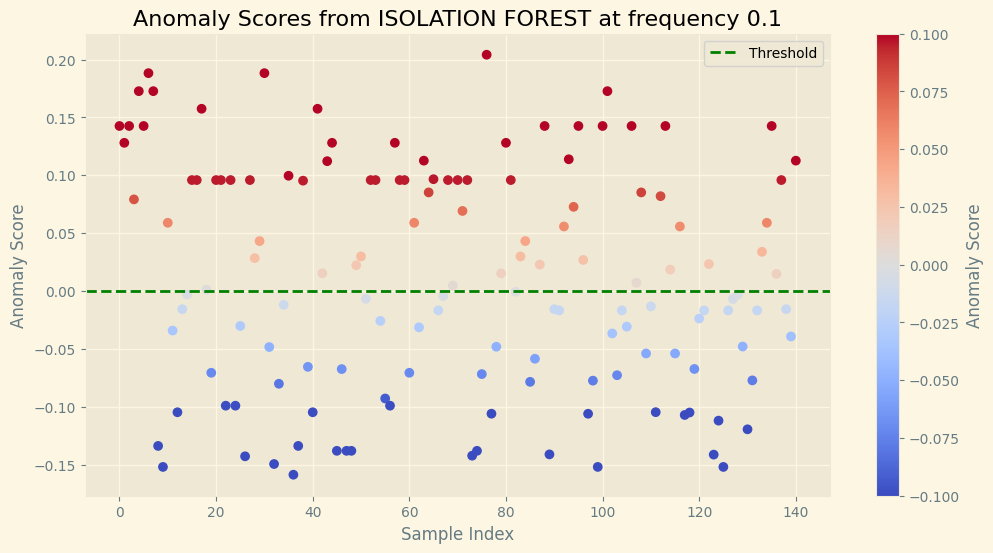

Number of anomalies detected: 71
Threshold: 0.0000
ROC AUC Score: 0.8364
F1 Score: 0.7717
Accuracy: 0.7943
Precision: 0.6901
Recall: 0.8750
              precision    recall  f1-score   support

           0       0.90      0.74      0.81        85
           1       0.69      0.88      0.77        56

    accuracy                           0.79       141
   macro avg       0.80      0.81      0.79       141
weighted avg       0.82      0.79      0.80       141



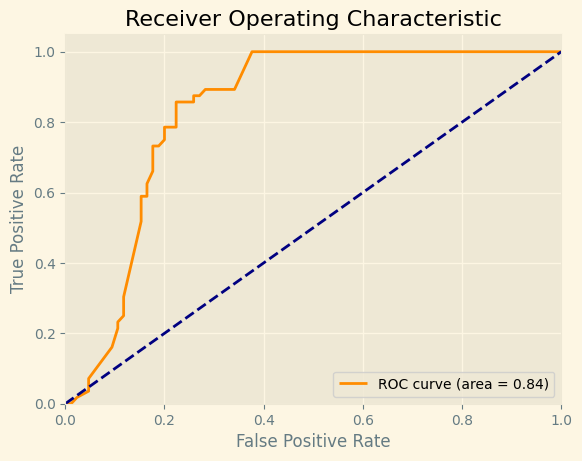

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2, n_estimators=3)
49


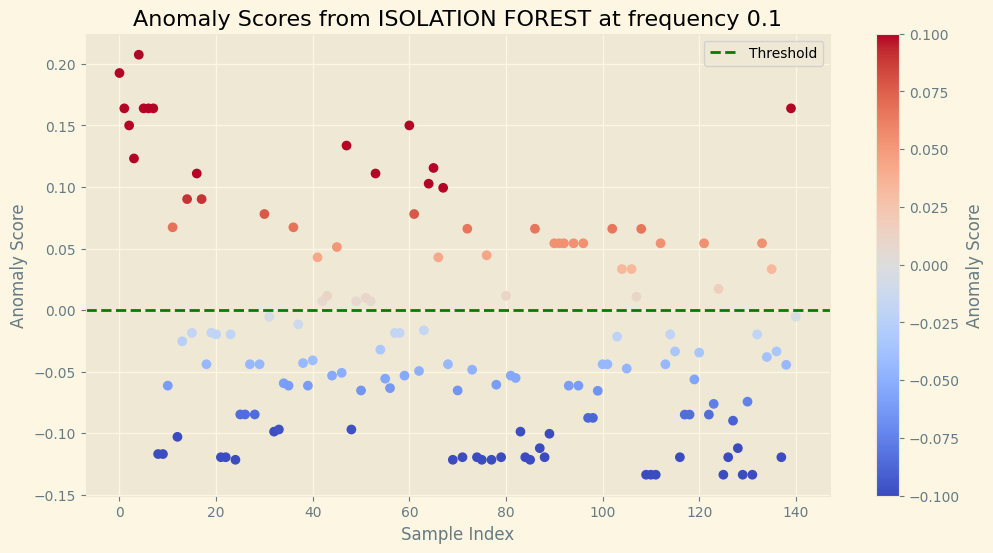

Number of anomalies detected: 49
Threshold: 0.0000
ROC AUC Score: 0.6237
F1 Score: 0.4762
Accuracy: 0.6099
Precision: 0.5102
Recall: 0.4464
              precision    recall  f1-score   support

           0       0.66      0.72      0.69        85
           1       0.51      0.45      0.48        56

    accuracy                           0.61       141
   macro avg       0.59      0.58      0.58       141
weighted avg       0.60      0.61      0.60       141



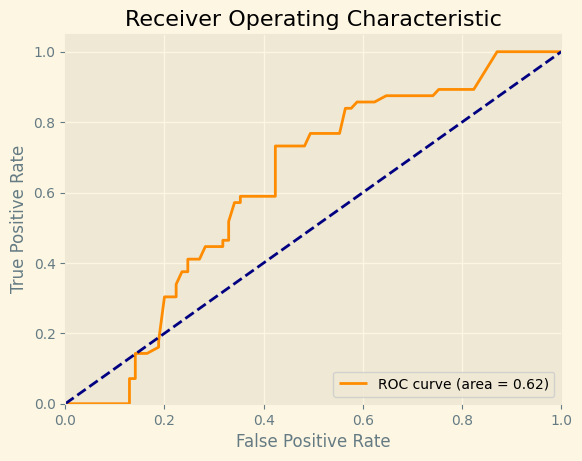

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=3)
92
IsolationForest(contamination=0.4, n_estimators=3)
86
IsolationForest(contamination=0.5, n_estimators=3)
94
IsolationForest(contamination=0.03, n_estimators=3)
11
IsolationForest(contamination=0.0475, n_estimators=3)
18
IsolationForest(contamination=0.065, n_estimators=3)
27
IsolationForest(contamination=0.0825, n_estimators=3)
57


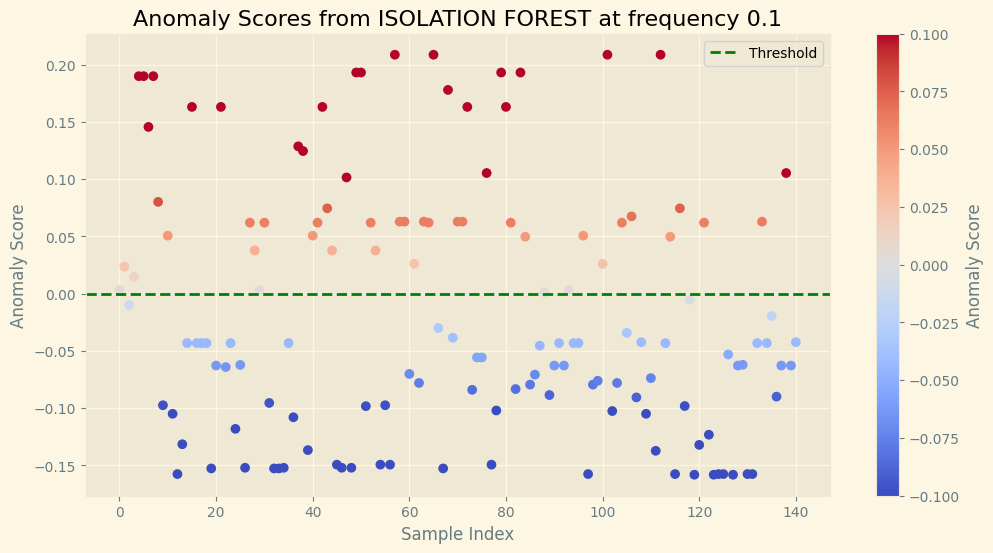

Number of anomalies detected: 57
Threshold: 0.0000
ROC AUC Score: 0.8301
F1 Score: 0.7080
Accuracy: 0.7660
Precision: 0.7018
Recall: 0.7143
              precision    recall  f1-score   support

           0       0.81      0.80      0.80        85
           1       0.70      0.71      0.71        56

    accuracy                           0.77       141
   macro avg       0.76      0.76      0.76       141
weighted avg       0.77      0.77      0.77       141



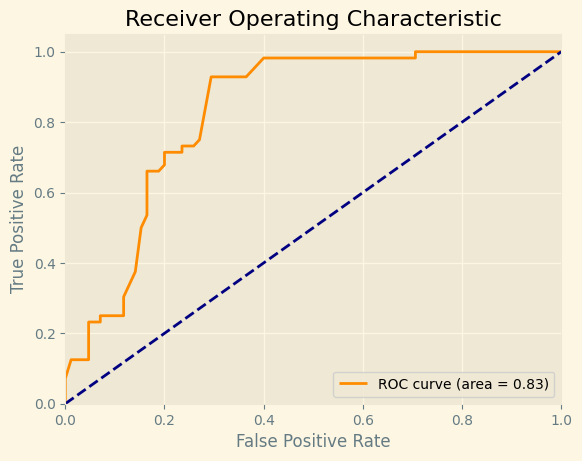

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=3)
17
IsolationForest(contamination=0.3431372549019608, n_estimators=5)
88
IsolationForest(contamination=0.005, n_estimators=5)
0
IsolationForest(contamination=0.001, n_estimators=5)
0
IsolationForest(contamination=0.001, n_estimators=5)
5
IsolationForest(contamination=0.03, n_estimators=5)
10
IsolationForest(contamination=0.05, n_estimators=5)
9
IsolationForest(contamination=0.1, n_estimators=5)
44


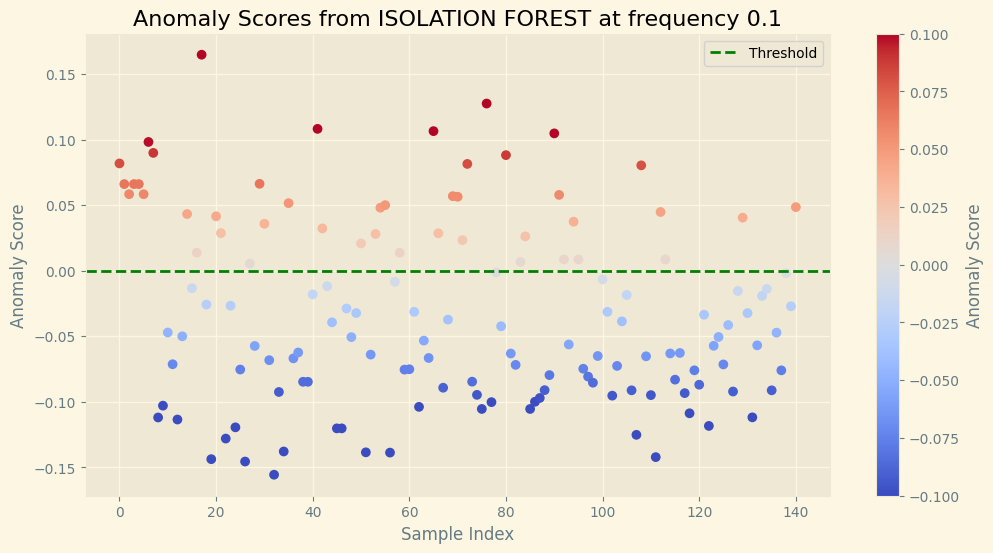

Number of anomalies detected: 44
Threshold: 0.0000
ROC AUC Score: 0.7720
F1 Score: 0.5800
Accuracy: 0.7021
Precision: 0.6591
Recall: 0.5179
              precision    recall  f1-score   support

           0       0.72      0.82      0.77        85
           1       0.66      0.52      0.58        56

    accuracy                           0.70       141
   macro avg       0.69      0.67      0.67       141
weighted avg       0.70      0.70      0.69       141



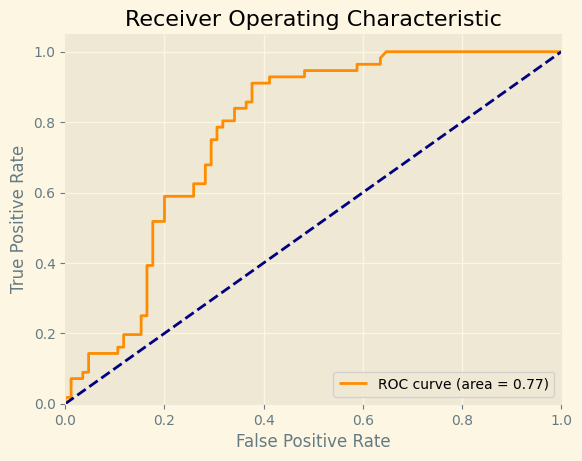

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2, n_estimators=5)
86
IsolationForest(contamination=0.3, n_estimators=5)
92
IsolationForest(contamination=0.4, n_estimators=5)
96
IsolationForest(contamination=0.5, n_estimators=5)
106
IsolationForest(contamination=0.03, n_estimators=5)
10
IsolationForest(contamination=0.0475, n_estimators=5)
50


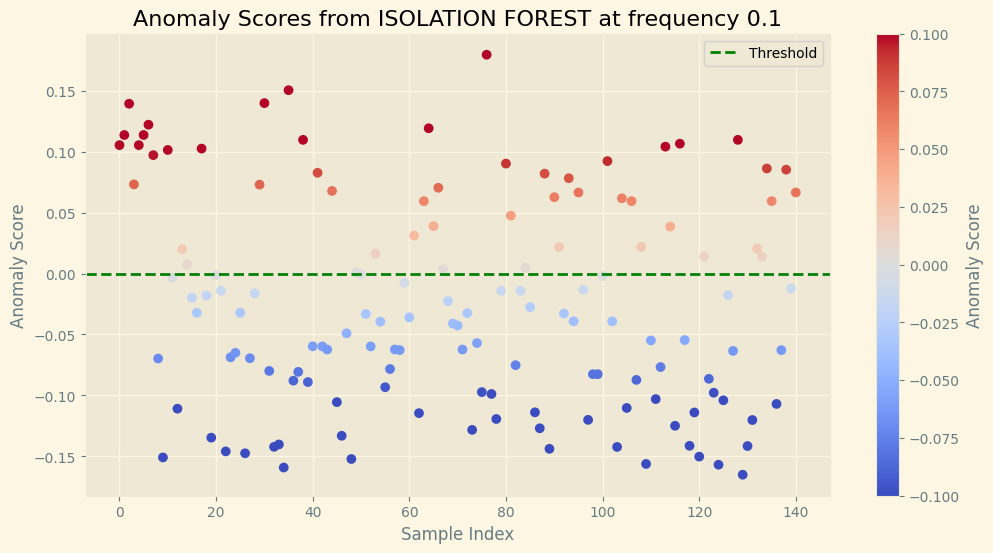

Number of anomalies detected: 50
Threshold: 0.0000
ROC AUC Score: 0.7909
F1 Score: 0.6226
Accuracy: 0.7163
Precision: 0.6600
Recall: 0.5893
              precision    recall  f1-score   support

           0       0.75      0.80      0.77        85
           1       0.66      0.59      0.62        56

    accuracy                           0.72       141
   macro avg       0.70      0.69      0.70       141
weighted avg       0.71      0.72      0.71       141



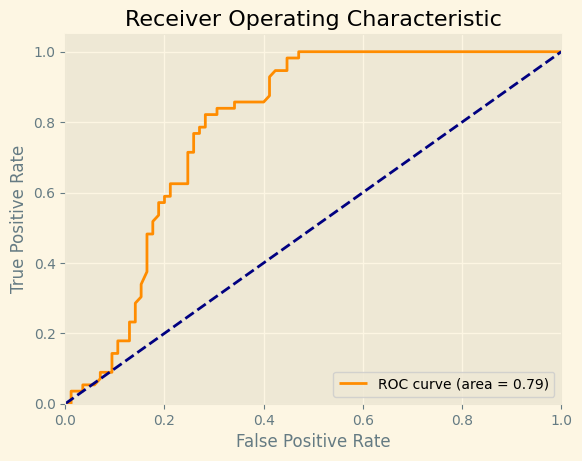

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.065, n_estimators=5)
70


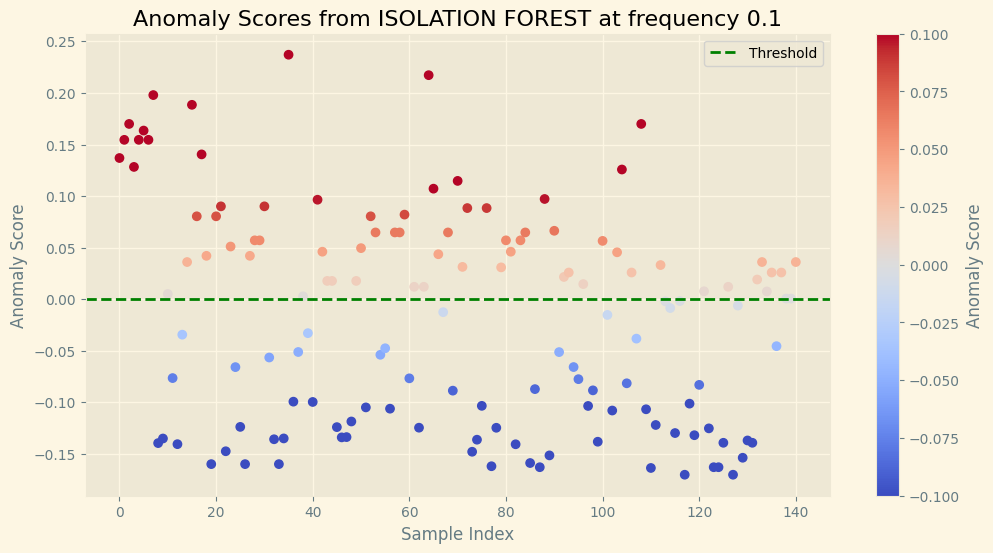

Number of anomalies detected: 70
Threshold: 0.0000
ROC AUC Score: 0.8372
F1 Score: 0.7619
Accuracy: 0.7872
Precision: 0.6857
Recall: 0.8571
              precision    recall  f1-score   support

           0       0.89      0.74      0.81        85
           1       0.69      0.86      0.76        56

    accuracy                           0.79       141
   macro avg       0.79      0.80      0.78       141
weighted avg       0.81      0.79      0.79       141



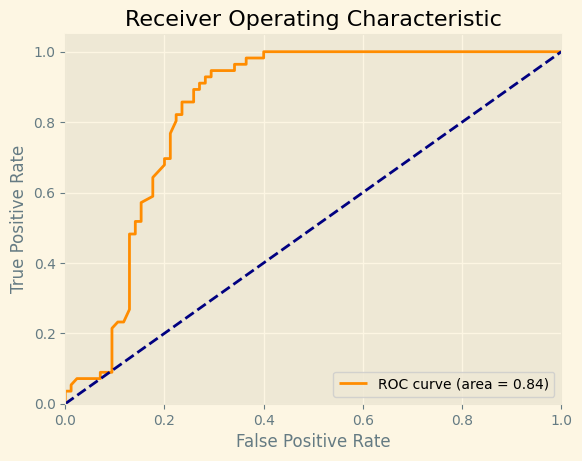

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825, n_estimators=5)
80
IsolationForest(contamination=0.1, n_estimators=5)
77


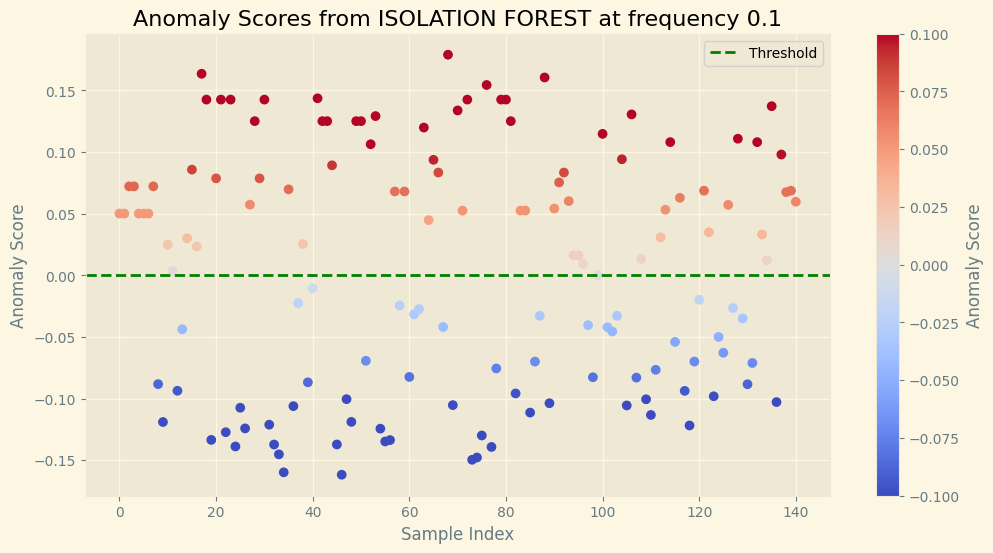

Number of anomalies detected: 77
Threshold: 0.0000
ROC AUC Score: 0.8752
F1 Score: 0.7820
Accuracy: 0.7943
Precision: 0.6753
Recall: 0.9286
              precision    recall  f1-score   support

           0       0.94      0.71      0.81        85
           1       0.68      0.93      0.78        56

    accuracy                           0.79       141
   macro avg       0.81      0.82      0.79       141
weighted avg       0.83      0.79      0.80       141



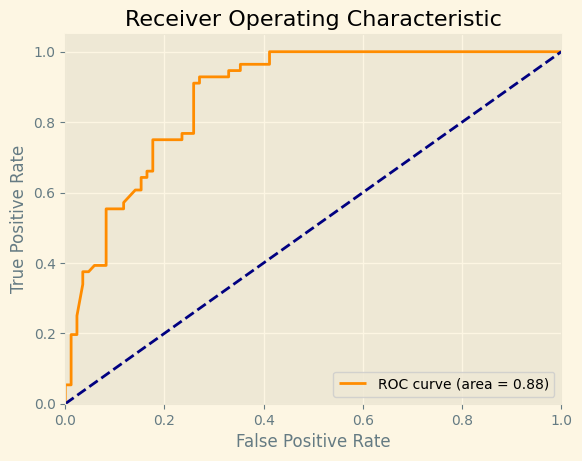

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3431372549019608, n_estimators=10)
99
IsolationForest(contamination=0.005, n_estimators=10)
0
IsolationForest(contamination=0.001, n_estimators=10)
0
IsolationForest(contamination=0.001, n_estimators=10)
0
IsolationForest(contamination=0.03, n_estimators=10)
9
IsolationForest(contamination=0.05, n_estimators=10)
20
IsolationForest(contamination=0.1, n_estimators=10)
78


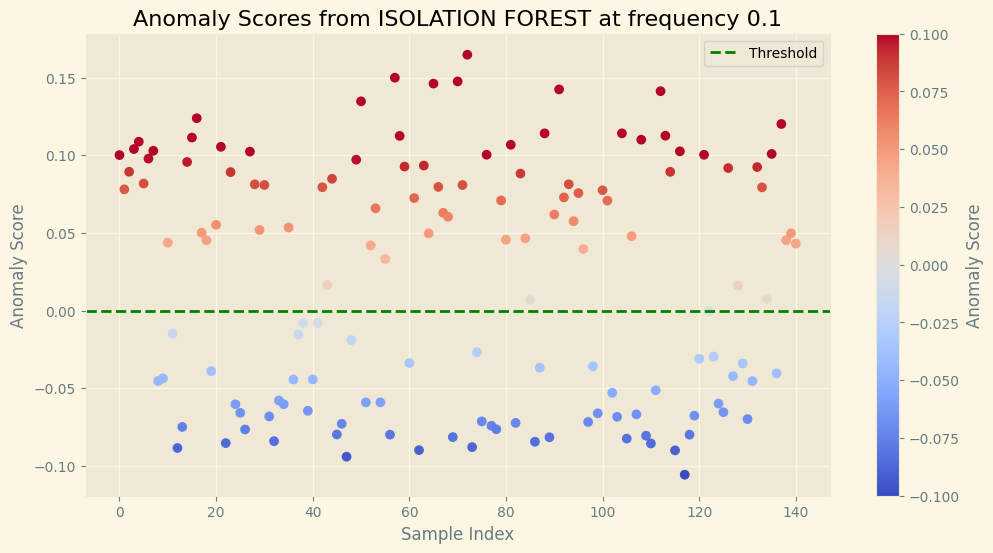

Number of anomalies detected: 78
Threshold: 0.0000
ROC AUC Score: 0.8527
F1 Score: 0.7910
Accuracy: 0.8014
Precision: 0.6795
Recall: 0.9464
              precision    recall  f1-score   support

           0       0.95      0.71      0.81        85
           1       0.68      0.95      0.79        56

    accuracy                           0.80       141
   macro avg       0.82      0.83      0.80       141
weighted avg       0.84      0.80      0.80       141



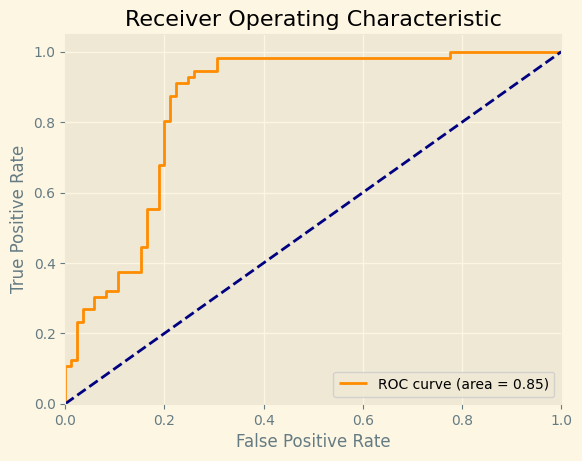

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2, n_estimators=10)
83
IsolationForest(contamination=0.3, n_estimators=10)
96
IsolationForest(contamination=0.4, n_estimators=10)
98
IsolationForest(contamination=0.5, n_estimators=10)
107
IsolationForest(contamination=0.03, n_estimators=10)
9
IsolationForest(contamination=0.0475, n_estimators=10)
52


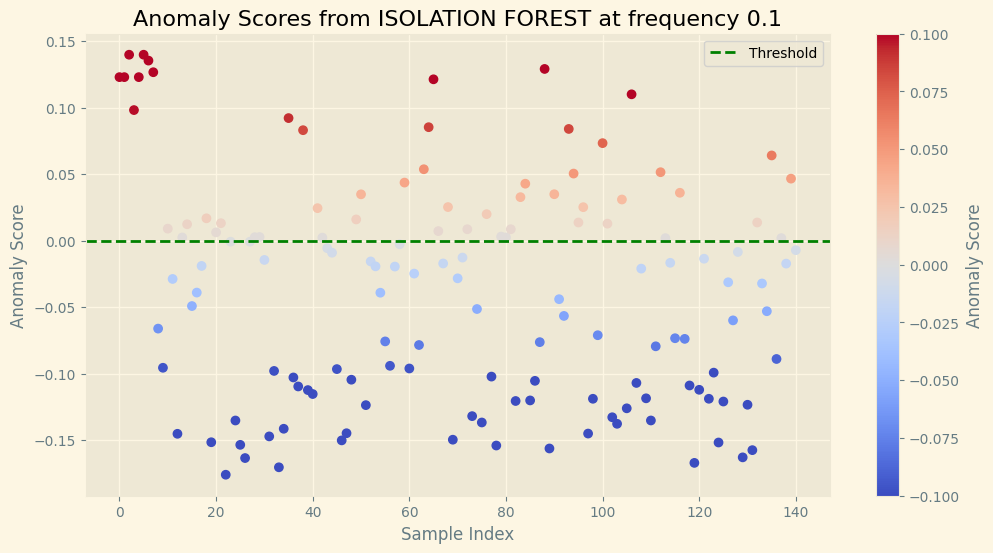

Number of anomalies detected: 52
Threshold: 0.0000
ROC AUC Score: 0.8338
F1 Score: 0.6852
Accuracy: 0.7589
Precision: 0.7115
Recall: 0.6607
              precision    recall  f1-score   support

           0       0.79      0.82      0.80        85
           1       0.71      0.66      0.69        56

    accuracy                           0.76       141
   macro avg       0.75      0.74      0.74       141
weighted avg       0.76      0.76      0.76       141



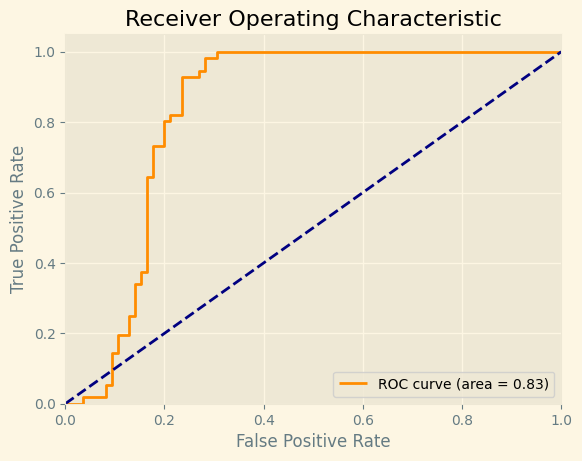

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.065, n_estimators=10)
67


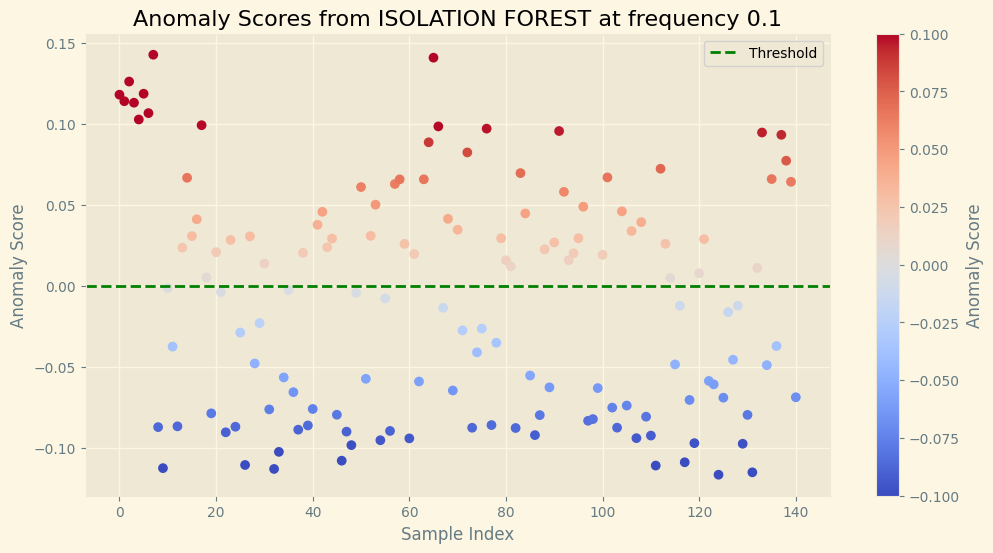

Number of anomalies detected: 67
Threshold: 0.0000
ROC AUC Score: 0.8162
F1 Score: 0.7805
Accuracy: 0.8085
Precision: 0.7164
Recall: 0.8571
              precision    recall  f1-score   support

           0       0.89      0.78      0.83        85
           1       0.72      0.86      0.78        56

    accuracy                           0.81       141
   macro avg       0.80      0.82      0.81       141
weighted avg       0.82      0.81      0.81       141



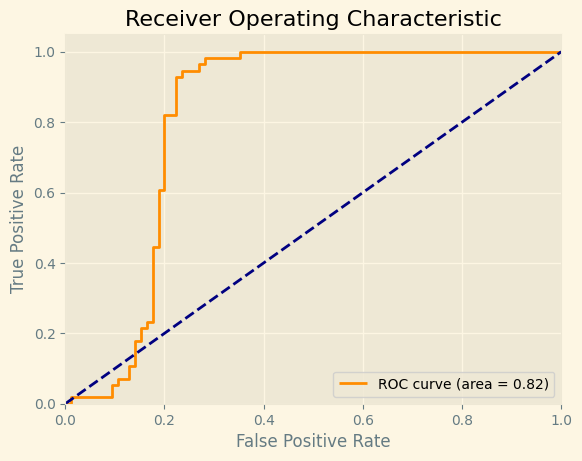

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825, n_estimators=10)
72


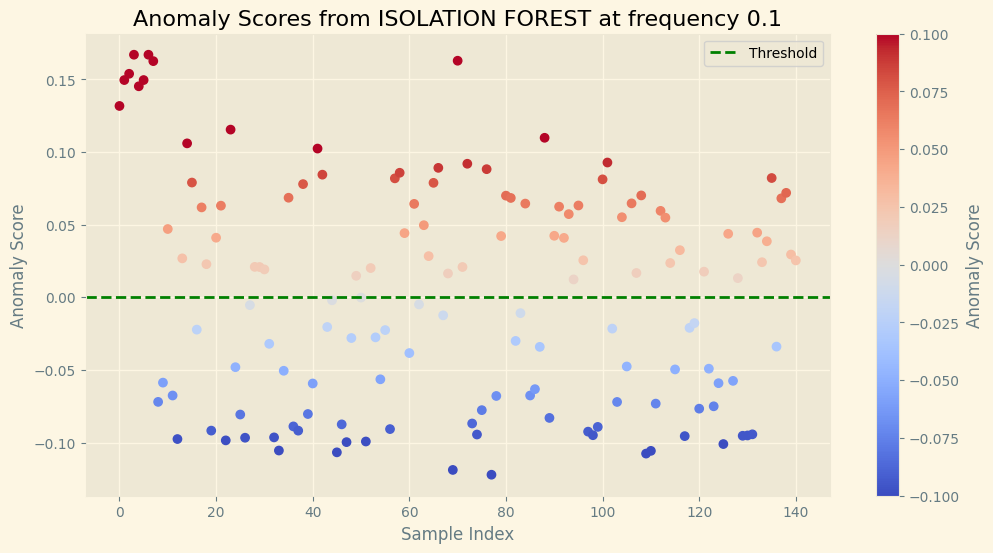

Number of anomalies detected: 72
Threshold: 0.0000
ROC AUC Score: 0.8307
F1 Score: 0.7812
Accuracy: 0.8014
Precision: 0.6944
Recall: 0.8929
              precision    recall  f1-score   support

           0       0.91      0.74      0.82        85
           1       0.69      0.89      0.78        56

    accuracy                           0.80       141
   macro avg       0.80      0.82      0.80       141
weighted avg       0.83      0.80      0.80       141



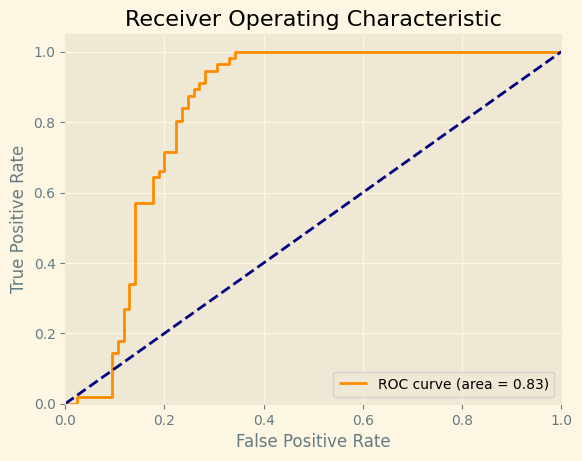

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=10)
74


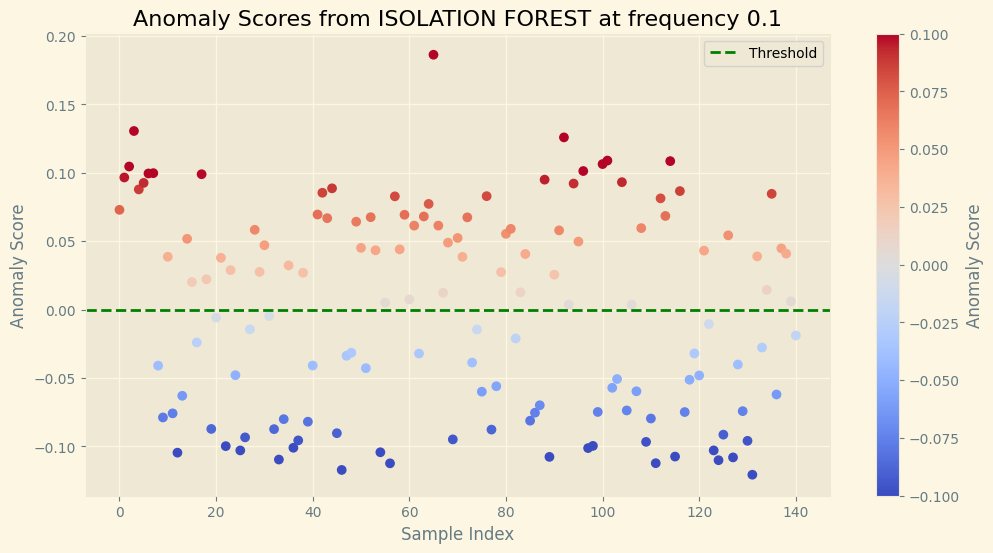

Number of anomalies detected: 74
Threshold: 0.0000
ROC AUC Score: 0.8487
F1 Score: 0.8000
Accuracy: 0.8156
Precision: 0.7027
Recall: 0.9286
              precision    recall  f1-score   support

           0       0.94      0.74      0.83        85
           1       0.70      0.93      0.80        56

    accuracy                           0.82       141
   macro avg       0.82      0.83      0.81       141
weighted avg       0.85      0.82      0.82       141



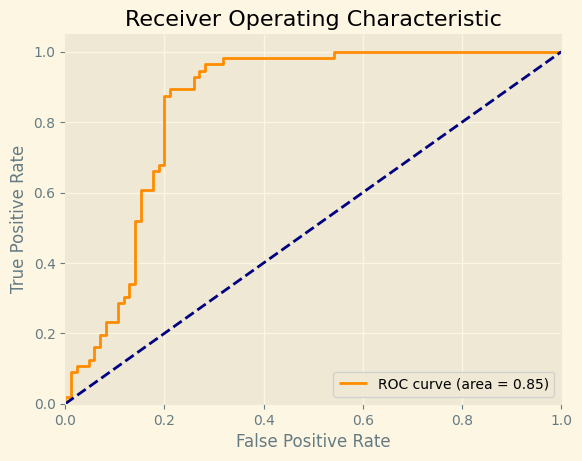

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3431372549019608)
97
IsolationForest(contamination=0.005)
0
IsolationForest(contamination=0.001)
0
IsolationForest(contamination=0.001)
0
IsolationForest(contamination=0.03)
8
IsolationForest(contamination=0.05)
77


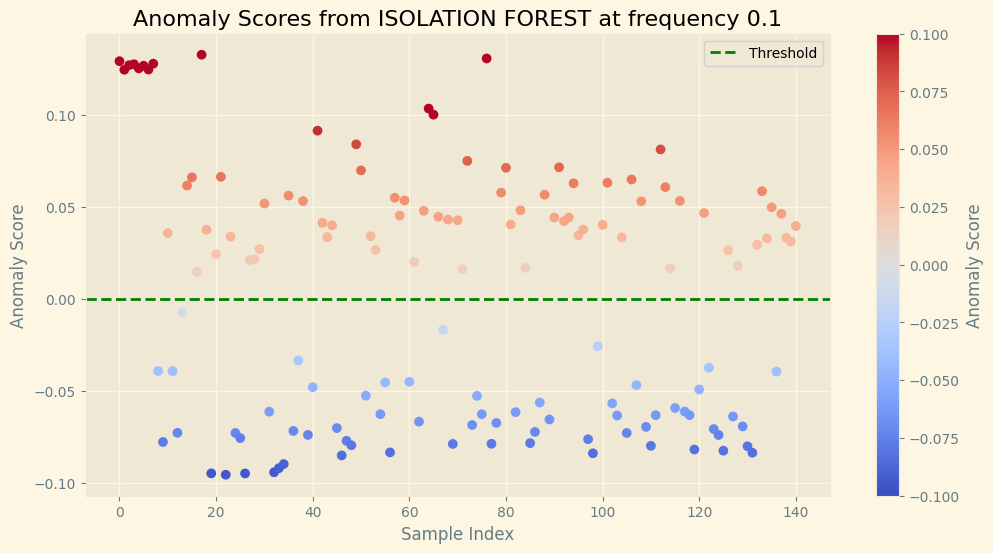

Number of anomalies detected: 77
Threshold: 0.0000
ROC AUC Score: 0.8384
F1 Score: 0.8271
Accuracy: 0.8369
Precision: 0.7143
Recall: 0.9821
              precision    recall  f1-score   support

           0       0.98      0.74      0.85        85
           1       0.71      0.98      0.83        56

    accuracy                           0.84       141
   macro avg       0.85      0.86      0.84       141
weighted avg       0.88      0.84      0.84       141



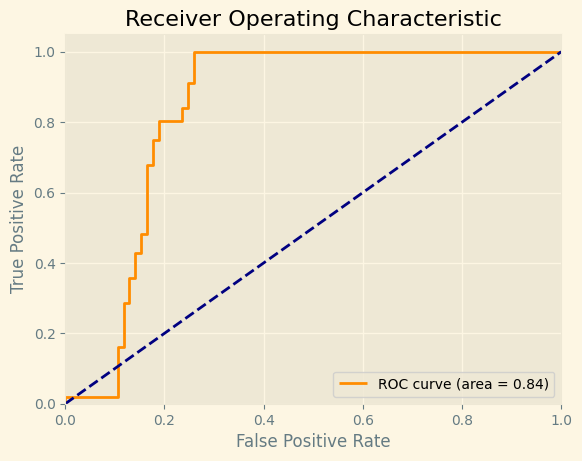

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1)
79


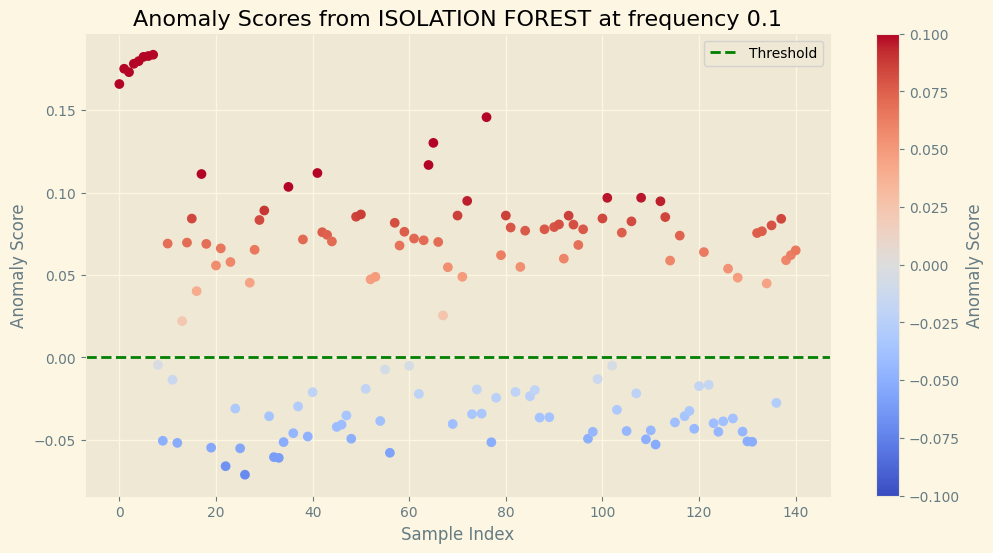

Number of anomalies detected: 79
Threshold: 0.0000
ROC AUC Score: 0.8410
F1 Score: 0.8296
Accuracy: 0.8369
Precision: 0.7089
Recall: 1.0000
              precision    recall  f1-score   support

           0       1.00      0.73      0.84        85
           1       0.71      1.00      0.83        56

    accuracy                           0.84       141
   macro avg       0.85      0.86      0.84       141
weighted avg       0.88      0.84      0.84       141



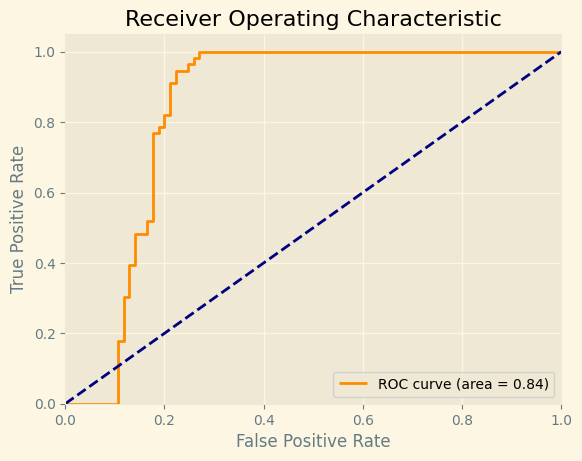

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2)
84
IsolationForest(contamination=0.3)
89
IsolationForest(contamination=0.4)
99
IsolationForest(contamination=0.5)
103
IsolationForest(contamination=0.03)
13
IsolationForest(contamination=0.0475)
77


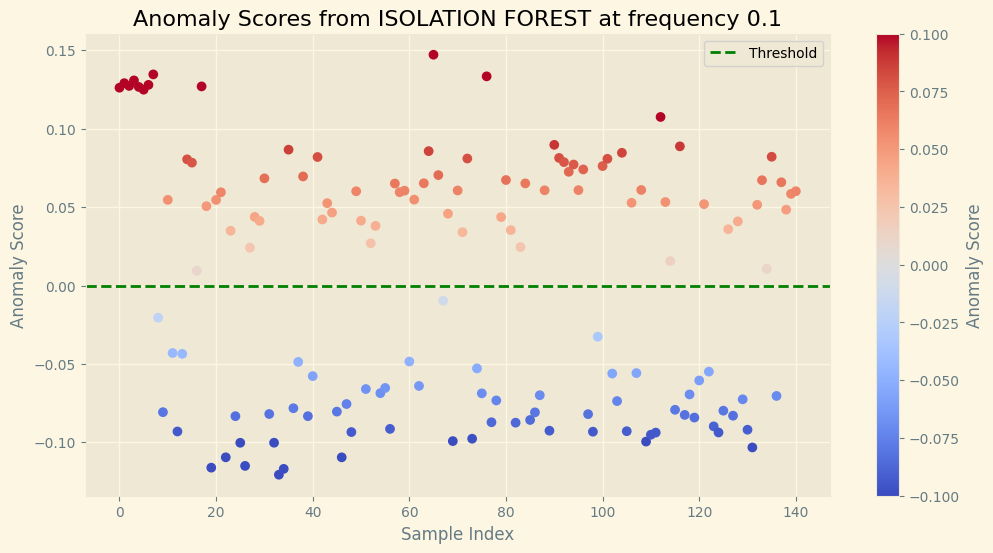

Number of anomalies detected: 77
Threshold: 0.0000
ROC AUC Score: 0.8424
F1 Score: 0.8271
Accuracy: 0.8369
Precision: 0.7143
Recall: 0.9821
              precision    recall  f1-score   support

           0       0.98      0.74      0.85        85
           1       0.71      0.98      0.83        56

    accuracy                           0.84       141
   macro avg       0.85      0.86      0.84       141
weighted avg       0.88      0.84      0.84       141



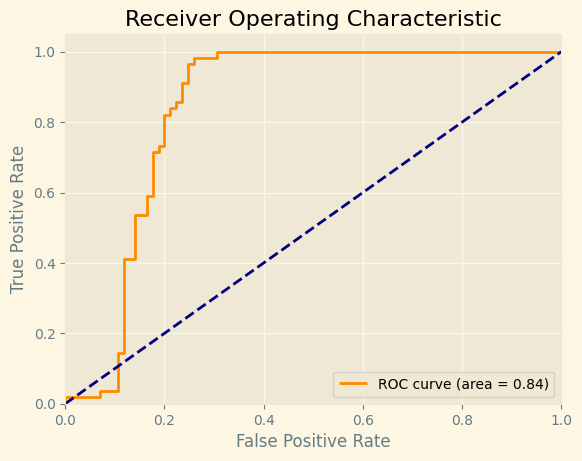

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.065)
78


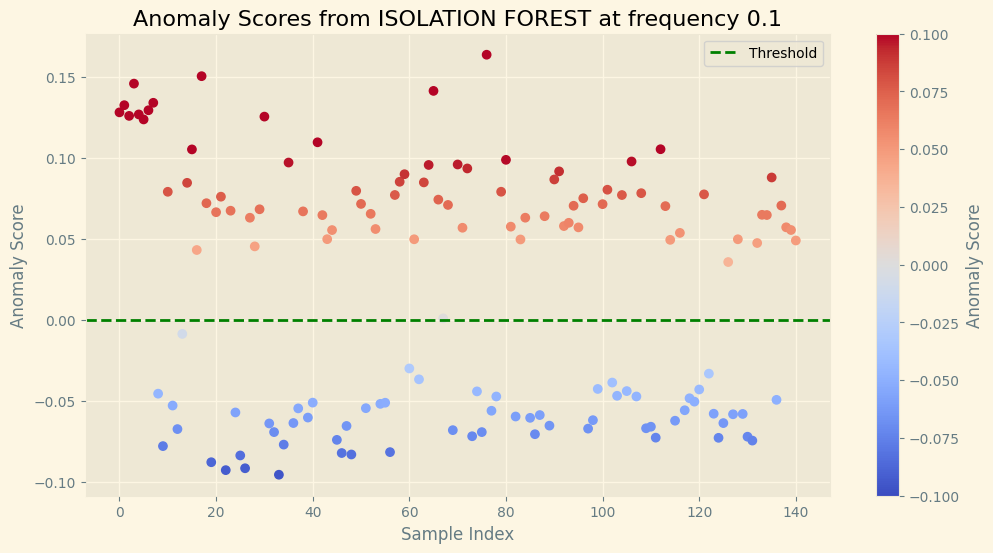

Number of anomalies detected: 78
Threshold: 0.0000
ROC AUC Score: 0.8492
F1 Score: 0.8209
Accuracy: 0.8298
Precision: 0.7051
Recall: 0.9821
              precision    recall  f1-score   support

           0       0.98      0.73      0.84        85
           1       0.71      0.98      0.82        56

    accuracy                           0.83       141
   macro avg       0.84      0.86      0.83       141
weighted avg       0.87      0.83      0.83       141



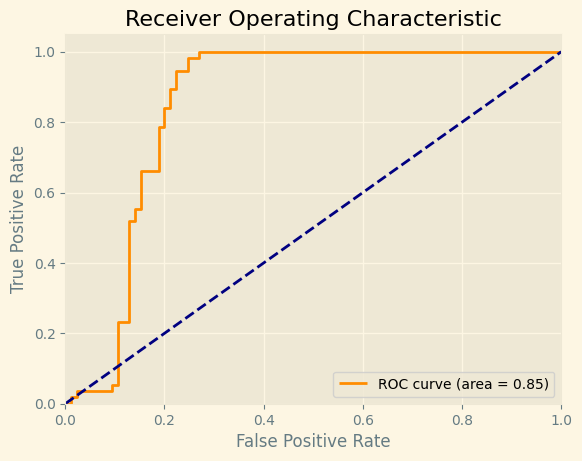

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825)
79


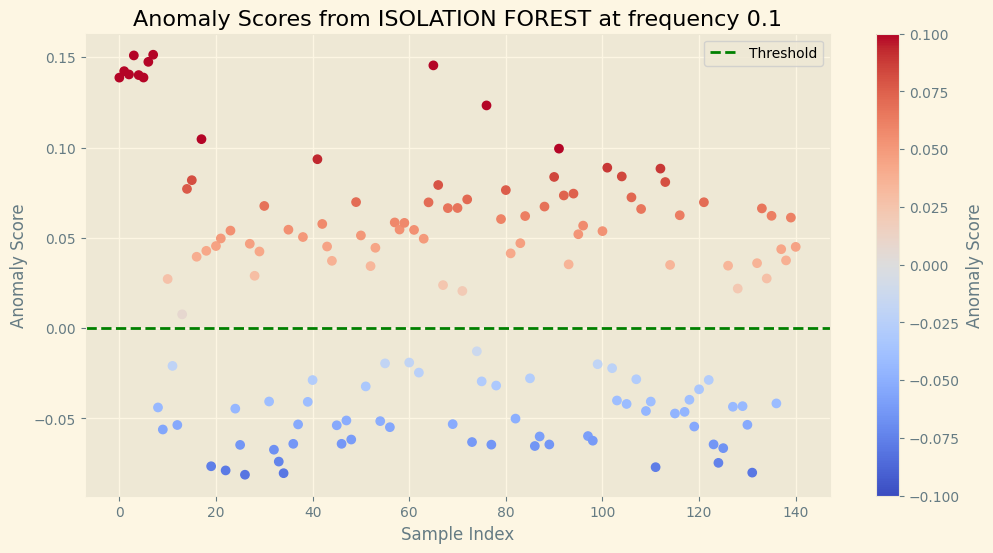

Number of anomalies detected: 79
Threshold: 0.0000
ROC AUC Score: 0.8559
F1 Score: 0.8296
Accuracy: 0.8369
Precision: 0.7089
Recall: 1.0000
              precision    recall  f1-score   support

           0       1.00      0.73      0.84        85
           1       0.71      1.00      0.83        56

    accuracy                           0.84       141
   macro avg       0.85      0.86      0.84       141
weighted avg       0.88      0.84      0.84       141



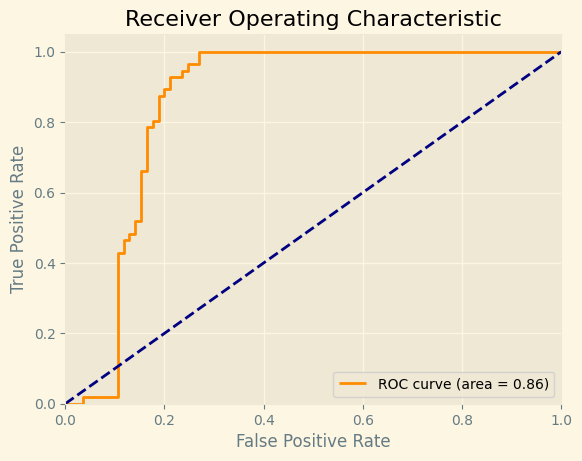

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1)
79


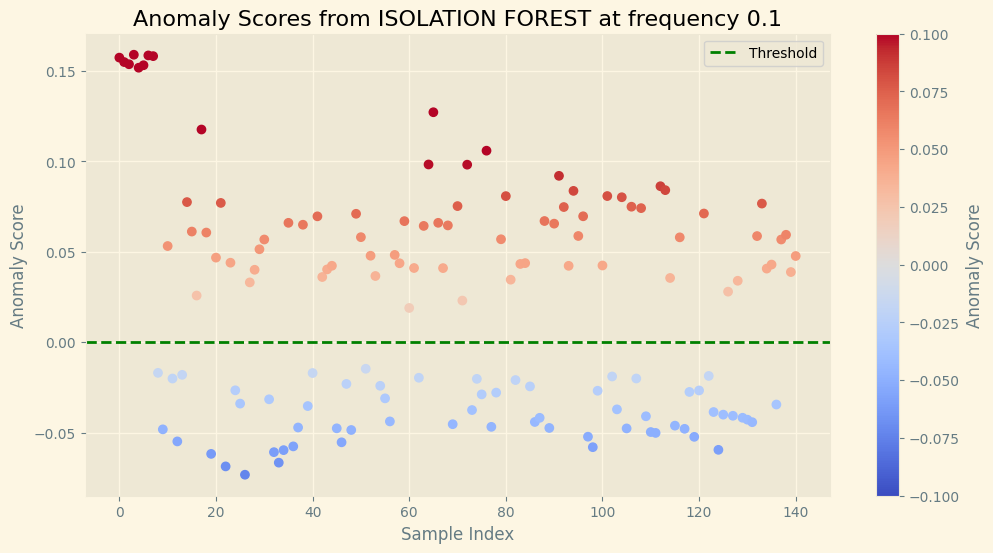

Number of anomalies detected: 79
Threshold: 0.0000
ROC AUC Score: 0.8387
F1 Score: 0.8148
Accuracy: 0.8227
Precision: 0.6962
Recall: 0.9821
              precision    recall  f1-score   support

           0       0.98      0.72      0.83        85
           1       0.70      0.98      0.81        56

    accuracy                           0.82       141
   macro avg       0.84      0.85      0.82       141
weighted avg       0.87      0.82      0.82       141



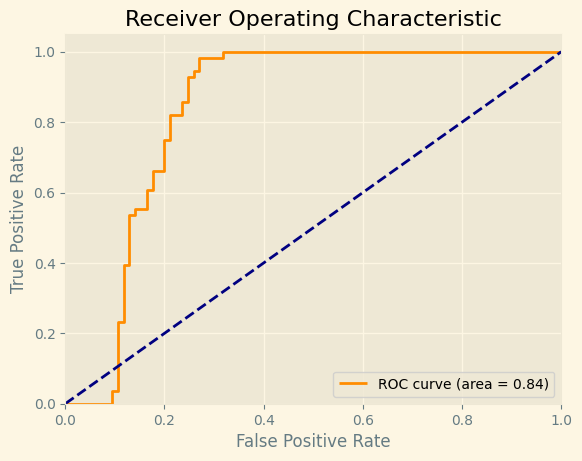

########################## ---------------------------------------- ##########################


In [24]:
threshold = 0 # threshold 0 for decision_function method
for idx, anomaly_scores in enumerate(anomaly_scores_s_5):
    print(f"{clf_s[idx][0]}")
    anomaly_scores = -anomaly_scores    #This is done as scores from decision function that are lower than 0 are considered abnomalies (see literature)

    anomalies_detected = np.sum(anomaly_scores > 0)
    print(f"{anomalies_detected}")
    if (anomalies_detected > 40 and anomalies_detected < 80):
        _ = plot_anomalies(anomaly_scores, freq, threshold, "ISOLATION FOREST")
        compute_metrics(anomaly_scores, y_test_collision_5, threshold)
        plot_roc_curve(y_test_collision_5.values, anomaly_scores)
        print("########################## ---------------------------------------- ##########################")
    # plot_anomalies_over_time(X_test, anomaly_scores, anomalies_detected, freq, threshold, collision_zones, X_test_start_end)

## Map anomalies to original time series

In [25]:
# def plot_anomalies_over_time_isolation_forest(X_test, pred, freq, collision_zones, X_test_start_end):
#     # Step 1: Create a DataFrame with the original data and anomaly scores
#     df = X_test.copy()

#     # Step 2: Add a timestamp column since it doesn't exist
#     df['timestamp'] = pd.date_range(start=X_test_start_end['start'].to_list()[0], end=X_test_start_end['end'].to_list()[-1], periods=len(df))  #Qua assicurati di bindare bene i timestamp (se puoi, non generarli)

#     print(df['timestamp'])

#     # Step 3: Select a few features to plot along with the anomaly scores
#     features_to_plot = df.columns.drop(['timestamp'])

#     # Step 4: Create the plot
#     fig, ax1 = plt.subplots(figsize=(15, 6))
#     ax1.set_title(f'Time Series Data with Anomaly Scores at frequency {freq}', fontsize=16)
    
#     # Plot features on primary y-axis
#     ax1.set_xlabel('Time')
#     ax1.set_ylabel('Feature Values')
#     colors = plt.cm.Greys(np.linspace(0, 1, len(features_to_plot)))
#     lines = []  # To collect plot lines for legend
#     labels = []  # To collect plot labels for legend
    
#     # print(f"THRESH: {threshold}")
#     for feature, color in zip(features_to_plot, colors):
#         # if any(df[feature] > threshold):
#         line, = ax1.plot(df['timestamp'], df[feature], label=f'Feature: {feature}', linewidth=1, color=color, alpha=0.7)
#         lines.append(line)
#         labels.append(f'Feature: {feature}')
#         # else:
#             # print("\t\tQuesta feature non supera mai soglia")

#     #Highlighting collision zones on the graph
#     for s, e in zip(collision_zones['start'].tolist(), collision_zones['end'].tolist()):
#         ax1.axvspan(s, e, alpha=0.2, color='blue')

#     # ax1.plot(df['timestamp'], df['anomaly_score'], color='red', label='Anomaly Score', linestyle='--', linewidth=1)
#     ax1.plot(df['timestamp'], pred, 'go-', label='Anomaly Score', linestyle='--', linewidth=1)

#     fig.tight_layout()
#     plt.show()

In [26]:
# for pred in pred_s:
#     plot_anomalies_over_time_isolation_forest(X_test, pred, freq, collision_zones, X_test_start_end)